# F_S3.2 — Complex Path: SiZer vs KL/QR/HD Comparison

Compare two methods for classifying shapes that the Simple (power-law) path cannot resolve:
- **Method A**: SiZer (multi-scale derivative analysis)
- **Method B**: KL / QR / HD (distributional tests from the thresholds paper)

Input: cases from Gate 2 Complex + Simple path R² fail ("Enter next branch").

## Shared setup

Reuse config, catalogue, data loading, Gate 1, Gate 2 from F_S3.

In [ ]:
from __future__ import annotations

import json
import math
import warnings
from pathlib import Path

import numpy as np
import pandas as pd
from scipy.optimize import curve_fit

try:
    from tqdm.auto import tqdm
except ImportError:
    def tqdm(it, **kw):
        return it

warnings.filterwarnings('ignore')

def count_percent(count, total):
    count = int(count)
    total = int(total)
    return f'{count:,} ({count / total:.1%})' if total else f'{count:,} (N/A)'

def locate_repo_root() -> Path:
    for root in [Path.cwd().resolve(), *Path.cwd().resolve().parents]:
        if (root / 'D').is_dir() and (root / 'E').is_dir():
            return root
    raise FileNotFoundError('Could not locate repo root.')

REPO_ROOT = locate_repo_root()

# ═══════════════════════════════════════════════════════
# ██  DATA SOURCE SWITCH  ██
# ═══════════════════════════════════════════════════════
# DATA_SOURCE = 'E'        # E data (S3_snr_mic_sweep, no spread)
# DATA_SOURCE = 'F'        # F data (S1_parameterized)
DATA_SOURCE = 'E_spread'   # E data with spread/group/x_dist dimensions

# ── E data: variant_level filter ──
# Available: 'mild', 'none', 'standard', 'strong'
# E_VARIANT_FILTER = ['mild']
E_VARIANT_FILTER = ['strong','mild', 'standard']

# ── F data: strength_name filter ──
# Available: 'very_weak', 'weak', 'medium', 'strong', 'very_strong'
F_STRENGTH_FILTER = ['strong']

# ── E_spread data: spread / group / x_dist ──
# Available spread: 'constant', 'increasing', 'decreasing', 'middle_high'
SPREAD_PATTERN = 'constant'
# Available group: 'selected', 'other'
FAMILY_GROUP = 'selected'
# Available x_dist: 'even', 'left_dense', 'right_dense', 'center_dense'
X_DISTRIBUTION = 'even'
# ── Repeat filter (for faster testing) ──
REPEAT_FILTER = [1]
# ── SNR filter (None = no filter) ──
SNR_MAX = 200  # Set to None to disable
# ═══════════════════════════════════════════════════════


# ═══════════════════════════════════════════════════════
# ██  METHOD SWITCH  ██
# ═══════════════════════════════════════════════════════
RUN_METHOD_A = True    # Method A: Multiscale TP (SiZer-based derivative analysis)
RUN_METHOD_B = True   # Method B: KL / QR / HD (distributional tests)
RUN_METHOD_C = True    # Method C: Conditional dip test (branch detection)
RUN_METHOD_D = False    # Method D: Periodicity detection (Lomb-Scargle / ACF / Spectral Entropy)
RUN_SIMPLE_ANALYSIS = True  # Simple-path diagnostic tables (R² breakdown, routing accuracy, sweep)
KL_METHOD = 'histogram'     # 'kde' (paper-style 2D KDE, slow) or 'histogram' (np.histogram2d, fast)

# ── MIC analysis gates (both will be analyzed) ──
MIC_ANALYSIS_GATES = ['strong_global', 'intermediate_global']


#
# ── Flat threshold for derivative (SiZer) ──
FLAT_FRAC = 0.05           # |β₁| < FLAT_FRAC * ref → treated as flat
FLAT_REF = 'max'           # 'max' = max|β₁|, 'median' = median|β₁|
# FLAT_REF = 'median'
# ── Width-ratio sub-classification (within TP=0) ──
USE_WIDTH_RATIO_SUBCLASS = False   # Toggle: subdivide TP=0 using width_ratio
WIDTH_RATIO_THRESHOLD = 0.5        # TP=0 cases with width_ratio_fine < this -> 'Threshold'
# ═══════════════════════════════════════════════════════

if DATA_SOURCE == 'E':
    INPUT_DIR = REPO_ROOT / 'E' / 'output' / 'S3_snr_mic_sweep'
    CASES_FILE = 'cases.csv'
    SCATTER_FILE = 'scatter_points.npz'
    METRICS_DIR = INPUT_DIR
elif DATA_SOURCE == 'E_spread':
    INPUT_DIR = REPO_ROOT / 'F' / 'output' / 'E' / 'E_S1' / SPREAD_PATTERN / FAMILY_GROUP / X_DISTRIBUTION
    CASES_FILE = 'cases.csv'
    SCATTER_FILE = 'scatter_points.npz'
    METRICS_DIR = REPO_ROOT / 'F' / 'output' / 'E' / 'E_S2' / SPREAD_PATTERN / FAMILY_GROUP / X_DISTRIBUTION
elif DATA_SOURCE == 'F':
    INPUT_DIR = REPO_ROOT / 'F' / 'output' / 'S1_parameterized'
    CASES_FILE = 'representative_cases.csv'
    SCATTER_FILE = 'representative_scatter_points.npz'
    METRICS_DIR = REPO_ROOT / 'F' / 'output' / 'S2_metrics'

OUT_DIR = REPO_ROOT / 'F' / 'output' / 'S3_shape_classification'
OUT_DIR.mkdir(parents=True, exist_ok=True)

print(f'DATA_SOURCE = {DATA_SOURCE!r}')
print(f'Input:  {INPUT_DIR.relative_to(REPO_ROOT)}')
if DATA_SOURCE == 'E_spread':
    print(f'Spread: {SPREAD_PATTERN}  |  Group: {FAMILY_GROUP}  |  X dist: {X_DISTRIBUTION}')
    print(f'Metrics: {METRICS_DIR.relative_to(REPO_ROOT)}')
elif DATA_SOURCE == 'F':
    print(f'Metrics: {METRICS_DIR.relative_to(REPO_ROOT)}')


In [1475]:
# Family catalogue: ground-truth properties for each signal family.
# F17 (Quadratic peak) was removed in F; F18 is standalone.
FAMILY_CATALOGUE = {
    'F01': {'name': 'Linear positive',           'direction': 'positive',     'linearity': 'linear',              'monotonicity': 'monotonic',     'curvature': 'N/A',    'special_shape': 'none',                  'tp': 0},
    'F02': {'name': 'Linear negative',           'direction': 'negative',     'linearity': 'linear',              'monotonicity': 'monotonic',     'curvature': 'N/A',    'special_shape': 'none',                  'tp': 0},
    'F03': {'name': 'Power convex positive',     'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'convex', 'special_shape': 'none',                  'tp': 0},
    'F04': {'name': 'Power convex negative',     'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'concave','special_shape': 'none',                  'tp': 0},
    'F05': {'name': 'Power concave positive',    'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'concave','special_shape': 'none',                  'tp': 0},
    'F06': {'name': 'Power concave negative',    'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'convex', 'special_shape': 'none',                  'tp': 0},
    'F07': {'name': 'Saturation positive',       'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'concave','special_shape': 'saturation',            'tp': 0},
    'F08': {'name': 'Saturation negative',       'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'convex', 'special_shape': 'saturation',            'tp': 0},
    'F09': {'name': 'Log positive',              'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'concave','special_shape': 'none',                  'tp': 0},
    'F10': {'name': 'Log negative',              'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'convex', 'special_shape': 'none',                  'tp': 0},
    'F11': {'name': 'Exponential positive',      'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'convex', 'special_shape': 'none',                  'tp': 0},
    'F12': {'name': 'Exponential negative',      'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'concave','special_shape': 'none',                  'tp': 0},
    'F13': {'name': 'S-curve positive',          'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'mixed',  'special_shape': 'S-curve',               'tp': 0},
    'F14': {'name': 'S-curve negative',          'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'mixed',  'special_shape': 'S-curve',               'tp': 0},
    'F15': {'name': 'Threshold positive',        'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'N/A',    'special_shape': 'threshold',             'tp': 0},
    'F16': {'name': 'Threshold negative',        'direction': 'negative',     'linearity': 'nonlinear',           'monotonicity': 'monotonic',     'curvature': 'N/A',    'special_shape': 'threshold',             'tp': 0},
    'F18': {'name': 'Quadratic valley (U)',       'direction': 'none/local',   'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'convex', 'special_shape': 'valley',                'tp': 1},
    'F19': {'name': 'Spike',                     'direction': 'none/local',   'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'N/A',    'special_shape': 'spike',                 'tp': 1},
    'F20': {'name': 'Inverted Spike',            'direction': 'none/local',   'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'N/A',    'special_shape': 'inverted spike',        'tp': 1},
    'F21': {'name': 'Cubic',                     'direction': 'none/mixed',   'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'mixed',  'special_shape': 'cubic',                 'tp': 2},
    'F22': {'name': 'Oscillation',               'direction': 'none/mixed',   'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'mixed',  'special_shape': 'oscillation',           'tp': 'multiple'},
    'F23': {'name': 'Two Lines',                 'direction': 'positive',     'linearity': 'multi-branch linear', 'monotonicity': 'multi-branch',  'curvature': 'N/A',    'special_shape': 'two lines',             'tp': 0},
    'F24': {'name': 'Line and Parabola',         'direction': 'none/local',   'linearity': 'multi-branch',        'monotonicity': 'multi-branch',  'curvature': 'mixed',  'special_shape': 'line + parabola',       'tp': 1},
    'F25': {'name': 'Multi-regime threshold',    'direction': 'positive',     'linearity': 'multi-branch',        'monotonicity': 'multi-branch',  'curvature': 'convex', 'special_shape': 'overlapping J',         'tp': 'multiple'},
    'F26': {'name': 'Windowed threshold',        'direction': 'positive',     'linearity': 'nonlinear',           'monotonicity': 'non-monotonic', 'curvature': 'convex', 'special_shape': 'windowed J',            'tp': 'multiple'},
    'Null': {'name': 'No relationship',          'direction': 'N/A',          'linearity': 'N/A',                 'monotonicity': 'N/A',           'curvature': 'N/A',    'special_shape': 'none',                  'tp': 'N/A'},
}

# Build the expected shape_label mapping from the catalogue.
# This is the ground-truth: what shape should the classifier assign at high SNR?
EXPECTED_SHAPE = {}
for fid, props in FAMILY_CATALOGUE.items():
    if fid == 'Null':
        EXPECTED_SHAPE[fid] = 'no_global'
        continue
    d = props['direction']
    mono = props['monotonicity']
    lin = props['linearity']
    curv = props['curvature']
    shape = props['special_shape']
    tp = props['tp']

    # Simple monotonic families → gate2 = Simple
    if mono == 'monotonic':
        if lin == 'linear':
            EXPECTED_SHAPE[fid] = f'{d}_line'
        elif shape in ('S-curve', 'threshold'):
            EXPECTED_SHAPE[fid] = f'{d}_transition'
        elif curv in ('concave', 'convex'):
            if (d == 'positive' and curv == 'concave') or (d == 'negative' and curv == 'convex'):
                EXPECTED_SHAPE[fid] = f'{d}_saturation'
            else:
                EXPECTED_SHAPE[fid] = f'{d}_acceleration'
        else:
            EXPECTED_SHAPE[fid] = 'simple_other'
    # Non-monotonic / multi-branch → gate2 = Complex
    elif mono == 'non-monotonic':
        if tp == 1:
            EXPECTED_SHAPE[fid] = 'u_inv_u_spike'
        elif tp == 2:
            EXPECTED_SHAPE[fid] = 'complex_cubic'
        elif tp == 'multiple' and 'oscillat' in shape:
            EXPECTED_SHAPE[fid] = 'oscillatory'
        elif tp == 'multiple' and 'windowed' in shape:
            EXPECTED_SHAPE[fid] = 'multi_step_threshold'
        else:
            EXPECTED_SHAPE[fid] = 'complex_uncertain'
    elif mono == 'multi-branch':
        if 'two lines' in shape:
            EXPECTED_SHAPE[fid] = '2_way_branching'
        elif 'parabola' in shape:
            EXPECTED_SHAPE[fid] = '2_way_branching'
        elif 'overlapping' in shape or 'J' in shape:
            EXPECTED_SHAPE[fid] = 'n_way_branching'
        else:
            EXPECTED_SHAPE[fid] = 'complex_uncertain'

catalogue_df = pd.DataFrame.from_dict(FAMILY_CATALOGUE, orient='index').reset_index(names='family_id')
catalogue_df['expected_shape'] = catalogue_df['family_id'].map(EXPECTED_SHAPE)
print(f'{len(FAMILY_CATALOGUE)} families loaded')
display(catalogue_df[['family_id', 'name', 'monotonicity', 'curvature', 'special_shape', 'expected_shape']])

26 families loaded


,family_id,name,monotonicity,curvature,special_shape,expected_shape
0,F01,Linear positive,monotonic,N/A,none,positive_line
1,F02,Linear negative,monotonic,N/A,none,negative_line
2,F03,Power convex positive,monotonic,convex,none,positive_acceleration
3,F04,Power convex negative,monotonic,concave,none,negative_acceleration
4,F05,Power concave positive,monotonic,concave,none,positive_saturation
5,F06,Power concave negative,monotonic,convex,none,negative_saturation
6,F07,Saturation positive,monotonic,concave,saturation,positive_saturation
7,F08,Saturation negative,monotonic,convex,saturation,negative_saturation
8,F09,Log positive,monotonic,concave,none,positive_saturation
9,F10,Log negative,monotonic,convex,none,negative_saturation


In [ ]:
cases_df = pd.read_csv(INPUT_DIR / CASES_FILE, low_memory=False)
metrics_df = pd.read_parquet(METRICS_DIR / 'metrics_full.parquet')
pts = np.load(INPUT_DIR / SCATTER_FILE)
x_all = pts['x']
y_all = pts['y']
del pts

if DATA_SOURCE in ('E', 'E_spread'):
    cases_df['_pt_idx'] = pd.to_numeric(cases_df['candidate_index'], errors='raise').astype(np.int64)
else:
    cases_df['_pt_idx'] = np.arange(len(cases_df), dtype=np.int64)

if len(x_all) != len(cases_df) or len(y_all) != len(cases_df):
    raise ValueError(f'Scatter arrays ({len(x_all)}) and cases ({len(cases_df)}) row count mismatch.')
if cases_df['case_id'].duplicated().any() or metrics_df['case_id'].duplicated().any():
    raise ValueError('case_id must be unique in both cases and metrics.')

# ── Apply strength filter (uses config switch) ──
if DATA_SOURCE in ('E', 'E_spread'):
    _filter_col = 'variant_level'
    _filter_vals = E_VARIANT_FILTER
else:
    _filter_col = 'strength_name'
    _filter_vals = F_STRENGTH_FILTER

if _filter_vals is not None:
    levels = [_filter_vals] if isinstance(_filter_vals, str) else list(_filter_vals)
    _before = len(cases_df)
    cases_df = cases_df[cases_df[_filter_col].isin(levels)].reset_index(drop=True)
    print(f'{_filter_col} filter: {levels} → kept {len(cases_df):,} / {_before:,} cases')
else:
    print(f'{_filter_col} filter: OFF (all levels)')

# ── Apply repeat filter ──
if REPEAT_FILTER is not None:
    _before_r = len(cases_df)
    cases_df = cases_df[cases_df['repeat'].isin(REPEAT_FILTER)].reset_index(drop=True)
    print(f'repeat filter: {REPEAT_FILTER} → kept {len(cases_df):,} / {_before_r:,} cases')

# ── Apply SNR filter ──
if SNR_MAX is not None:
    _before_snr = len(cases_df)
    cases_df = cases_df[cases_df['nominal_snr'] <= SNR_MAX].reset_index(drop=True)
    print(f'SNR filter: ≤{SNR_MAX} → kept {len(cases_df):,} / {_before_snr:,} cases')

data = cases_df.merge(metrics_df, on='case_id', how='inner', validate='one_to_one')
data = data.reset_index(drop=True)
data['is_null'] = data['family_id'].eq('Null')
data['_pt_idx'] = pd.to_numeric(data['_pt_idx'], errors='raise').astype(np.int64)
if not data['_pt_idx'].between(0, len(x_all) - 1).all():
    raise IndexError('A mapped scatter-point index is outside the stored arrays.')
if data['_pt_idx'].duplicated().any():
    raise ValueError('Multiple classified cases map to the same scatter-point row.')

print(f'Loaded {len(data):,} cases × {x_all.shape[1]} points  [DATA_SOURCE={DATA_SOURCE}]')
if DATA_SOURCE == 'E_spread':
    print(f'  Spread: {SPREAD_PATTERN}  |  Group: {FAMILY_GROUP}  |  X dist: {X_DISTRIBUTION}')
print(f'  Signal: {(~data["is_null"]).sum():,}   Null: {data["is_null"].sum():,}')
print(f'  Families: {sorted(data["family_id"].unique())}')

In [1477]:
import matplotlib.pyplot as plt
from matplotlib.lines import Line2D

COLOR_PASS = '#4CAF50'
COLOR_UNCERTAIN = '#FFC107'
COLOR_FAIL = '#F44336'
EDGE_PASS = '#2E7D32'
EDGE_UNCERTAIN = '#F57F17'
EDGE_FAIL = '#C62828'

COLOR_TP0 = '#2196F3'   # blue
COLOR_TP1 = '#4CAF50'   # green
COLOR_TP2 = '#FF9800'   # orange
COLOR_TP3 = '#9C27B0'   # purple
EDGE_TP0 = '#1565C0'
EDGE_TP1 = '#2E7D32'
EDGE_TP2 = '#E65100'
EDGE_TP3 = '#6A1B9A'

COLOR_TRANSITION = '#00BCD4'   # cyan
COLOR_MONOTONIC = '#FFC107'    # yellow
EDGE_TRANSITION = '#00838F'
EDGE_MONOTONIC = '#F57F17'

STEP_COLOR_MAP = {
    'gate1': {
        'strong_global': 'pass',
        'intermediate_global': 'uncertain',
        'no_global': 'fail',
    },
    'gate2': {
        'Simple': 'pass',
        'Complex': 'uncertain',
    },
    'pw_r2_pass': {
        'pass': 'pass',
        'r2_fail': 'fail',
    },
    'pw_linear': {
        'linear': 'pass',
        'non_linear': 'uncertain',
    },
    'pw_curvature': {
        'positive_concave': 'pass', 'negative_concave': 'pass',
        'positive_convex': 'pass', 'negative_convex': 'pass',
    },
    'pw_label': {
        'positive_line': 'pass', 'negative_line': 'pass',
        'positive_concave': 'pass', 'negative_concave': 'pass',
        'positive_convex': 'pass', 'negative_convex': 'pass',
        'r2_fail': 'fail',
    },
    'cond_dip_label': {
        'Branch': 'pass',
        'Non-branch': 'uncertain',
    },
    'sizer_label': {
        'TP=0': 'tp0', 'TP=1': 'tp1', 'TP=2': 'tp2', 'TP≥3': 'tp3',
        'Uncertain': 'uncertain',
    },
    'klqrhd_label': {
        'Transition': 'transition', 'Monotonic': 'monotonic',
        'failed': 'hd_fail',
    },
}

MAX_FAMILIES_PER_FIG = 10
MAX_COLS = 11

def _get_colors(label_col, label_val):
    mapping = STEP_COLOR_MAP.get(label_col, {})
    status = mapping.get(str(label_val), 'uncertain')
    color_map = {
        'pass': (COLOR_PASS, EDGE_PASS),
        'fail': (COLOR_FAIL, EDGE_FAIL),
        'uncertain': (COLOR_UNCERTAIN, EDGE_UNCERTAIN),
        'tp0': (COLOR_TP0, EDGE_TP0),
        'tp1': (COLOR_TP1, EDGE_TP1),
        'tp2': (COLOR_TP2, EDGE_TP2),
        'tp3': (COLOR_TP3, EDGE_TP3),
        'transition': (COLOR_TRANSITION, EDGE_TRANSITION),
        'monotonic': (COLOR_MONOTONIC, EDGE_MONOTONIC),
        'hd_fail': ('#BDBDBD', '#757575'),
    }
    return color_map.get(status, (COLOR_UNCERTAIN, EDGE_UNCERTAIN))


def _draw_one_grid(families, subset_df, label_col, step_title,
                   metric_col, metric_fmt, part_label='',
                   draw_fit=False):
    family_cases = {}
    for fam in families:
        fam_data = subset_df[subset_df['family_id'] == fam].copy()
        fam_data = fam_data.drop_duplicates(subset='case_id', keep='first')
        fam_data = fam_data.sort_values('nominal_snr', ascending=False)
        cases = fam_data.to_dict('records')
        if len(cases) > MAX_COLS:
            step = len(cases) / MAX_COLS
            cases = [cases[int(i * step)] for i in range(MAX_COLS)]
        family_cases[fam] = cases

    ncols = max((len(c) for c in family_cases.values()), default=1)
    nrows = len(families)
    cell_size = 2.2

    fig, axes = plt.subplots(nrows, ncols,
                             figsize=(cell_size * ncols, cell_size * nrows),
                             squeeze=False)

    for r, fam in enumerate(families):
        cases = family_cases[fam]
        fname = cases[0]['family_name'] if cases else ''

        for c in range(ncols):
            ax = axes[r, c]
            ax.set_box_aspect(1)

            if c >= len(cases):
                ax.axis('off')
                continue

            case_row = cases[c]
            idx = int(case_row['_pt_idx'])
            label = str(case_row.get(label_col, 'N/A'))
            face, edge = _get_colors(label_col, label)

            ax.scatter(x_all[idx], y_all[idx], s=12, alpha=0.6,
                       facecolors=face, edgecolors=edge, linewidths=0.4)

            if draw_fit and pd.notna(case_row.get('pw_a', np.nan)) and pd.notna(case_row.get('pw_b', np.nan)):
                a_fit, b_fit = case_row['pw_a'], case_row['pw_b']
                x_pts = x_all[idx]
                y_pts = y_all[idx]
                x_grid = np.linspace(x_pts[np.isfinite(x_pts)].min(),
                                     x_pts[np.isfinite(x_pts)].max(), 200)
                c_est = np.mean(y_pts) - a_fit * np.mean(np.power(np.maximum(x_pts, 1e-10), b_fit))
                y_fit = a_fit * np.power(np.maximum(x_grid, 1e-10), b_fit) + c_est
                ax.plot(x_grid, y_fit, 'k-', linewidth=1.2, alpha=0.7, zorder=5)

            snr = case_row['nominal_snr']
            snr_str = '∞' if np.isinf(snr) else f'{snr:.2g}'
            ax.set_title(f'SNR {snr_str}', fontsize=9)

            ann = label
            if metric_col is not None:
                val = case_row.get(metric_col, np.nan)
                if pd.notna(val):
                    ann = f'{label}\n{metric_col}={val:{metric_fmt}}'

            ax.text(0.5, 0.01, ann, transform=ax.transAxes,
                    ha='center', va='bottom', fontsize=8,
                    color=edge,
                    bbox=dict(facecolor='white', alpha=0.75,
                              edgecolor='none', pad=0.5))
            ax.tick_params(labelsize=5)

        axes[r, 0].set_ylabel(f'{fam}\n{fname}', fontsize=10)

    if label_col == 'sizer_label':
        legend_handles = [
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_TP0, markeredgecolor=EDGE_TP0,
                   markersize=6, label='TP=0'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_TP1, markeredgecolor=EDGE_TP1,
                   markersize=6, label='TP=1'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_TP2, markeredgecolor=EDGE_TP2,
                   markersize=6, label='TP=2'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_TP3, markeredgecolor=EDGE_TP3,
                   markersize=6, label='TP≥3'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_UNCERTAIN, markeredgecolor=EDGE_UNCERTAIN,
                   markersize=6, label='Uncertain'),
        ]
    elif label_col == 'klqrhd_label':
        legend_handles = [
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_TRANSITION, markeredgecolor=EDGE_TRANSITION,
                   markersize=6, label='Transition'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_MONOTONIC, markeredgecolor=EDGE_MONOTONIC,
                   markersize=6, label='Monotonic'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor='#BDBDBD', markeredgecolor='#757575',
                   markersize=6, label='Failed'),
        ]
    elif label_col == 'gate1':
        legend_handles = [
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_PASS, markeredgecolor=EDGE_PASS,
                   markersize=6, label='Pass'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_UNCERTAIN, markeredgecolor=EDGE_UNCERTAIN,
                   markersize=6, label='Uncertain'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_FAIL, markeredgecolor=EDGE_FAIL,
                   markersize=6, label='Fail'),
        ]
    else:
        legend_handles = [
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_PASS, markeredgecolor=EDGE_PASS,
                   markersize=6, label='Pass'),
            Line2D([0], [0], marker='o', linestyle='None',
                   markerfacecolor=COLOR_FAIL, markeredgecolor=EDGE_FAIL,
                   markersize=6, label='Fail'),
        ]

    spread_lbl = SPREAD_PATTERN if DATA_SOURCE == 'E_spread' else ''
    title = f'{step_title}'
    if part_label:
        title += f'  ({part_label})'
    if spread_lbl:
        title += f'  [spread={spread_lbl}]'
    fig.suptitle(title, fontsize=12, y=1.005)
    fig.legend(handles=legend_handles, loc='upper right',
               bbox_to_anchor=(0.99, 0.995), fontsize=8, frameon=True)
    fig.tight_layout()
    plt.show()


def diag_scatter(subset_df, label_col, step_title,
                 metric_col=None, metric_fmt='.2f',
                 draw_fit=False, max_per_fig=None):
    """Rows = families, cols = individual cases (max MAX_COLS). Split only if max_per_fig is set."""
    families = sorted(subset_df[~subset_df['is_null']]['family_id'].unique())
    if not families:
        print(f'{step_title}: no signal families to show')
        return

    if max_per_fig and len(families) > max_per_fig:
        n_parts = math.ceil(len(families) / max_per_fig)
        for p in range(n_parts):
            start = p * max_per_fig
            end = min(start + max_per_fig, len(families))
            part_fams = families[start:end]
            _draw_one_grid(part_fams, subset_df, label_col, step_title,
                           metric_col, metric_fmt,
                           f'Part {p+1}/{n_parts}',
                           draw_fit=draw_fit)
    else:
        _draw_one_grid(families, subset_df, label_col, step_title,
                       metric_col, metric_fmt,
                       draw_fit=draw_fit)


def diag_scatter_from_sub(sub_df, label_col, step_title,
                           metric_col=None, metric_fmt='.2f'):
    """Like diag_scatter but for sub-DataFrames (sizer_df, klqrhd_df etc.)."""
    merge_cols = ['case_id', '_pt_idx', 'nominal_snr', 'MIC',
                  'family_id', 'family_name', 'is_null']
    merged = sub_df.merge(
        data[merge_cols], on='case_id', how='left', suffixes=('', '_data'))
    for col in ['family_id', 'family_name', 'is_null', 'nominal_snr', 'MIC', '_pt_idx']:
        if col + '_data' in merged.columns:
            merged[col] = merged[col].fillna(merged[col + '_data'])
            merged.drop(columns=[col + '_data'], inplace=True)
    diag_scatter(merged, label_col, step_title, metric_col, metric_fmt)


print('Scatter diagnostic helpers defined.')


Scatter diagnostic helpers defined.


In [1478]:
# ── Gate 1 thresholds ──
MIC_STRONG = 0.8
MIC_INTERMEDIATE = 0.6

def assign_gate1(mic):
    if mic >= MIC_STRONG:
        return 'strong_global'
    elif mic >= MIC_INTERMEDIATE:
        return 'intermediate_global'
    else:
        return 'no_global'

data['gate1'] = data['MIC'].apply(assign_gate1)

_g1_counts = data.groupby(['family_id', 'gate1']).size().unstack(fill_value=0)
_g1_counts = _g1_counts.reindex(
    columns=['strong_global', 'intermediate_global', 'no_global'], fill_value=0
).sort_index()
_g1_totals = _g1_counts.sum(axis=1)
_g1 = pd.DataFrame(index=_g1_counts.index)
_g1['family_name'] = _g1.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
_g1['Total'] = [count_percent(n, n) for n in _g1_totals]
for col in _g1_counts.columns:
    _g1[col] = [count_percent(n, total) for n, total in zip(_g1_counts[col], _g1_totals)]
print(f'=== Gate 1: MIC >= {MIC_STRONG} → strong, >= {MIC_INTERMEDIATE} → intermediate ===')
display(_g1)
print(f'\nOverall: {count_percent((data["gate1"]=="strong_global").sum(), len(data))} strong / '
      f'{count_percent((data["gate1"]=="intermediate_global").sum(), len(data))} intermediate / '
      f'{count_percent((data["gate1"]=="no_global").sum(), len(data))} no_global')

=== Gate 1: MIC >= 0.8 → strong, >= 0.6 → intermediate ===


,family_name,Total,strong_global,intermediate_global,no_global
family_id,,,,,
F01,Linear positive,681 (100.0%),291 (42.7%),47 (6.9%),343 (50.4%)
F03,Power convex positive,681 (100.0%),254 (37.3%),57 (8.4%),370 (54.3%)
F05,Power concave positive,681 (100.0%),276 (40.5%),54 (7.9%),351 (51.5%)
F07,Saturation positive,681 (100.0%),173 (25.4%),113 (16.6%),395 (58.0%)
F13,S-curve positive,681 (100.0%),321 (47.1%),33 (4.8%),327 (48.0%)
F15,Threshold positive,681 (100.0%),330 (48.5%),32 (4.7%),319 (46.8%)
F18,Quadratic valley (U),681 (100.0%),279 (41.0%),49 (7.2%),353 (51.8%)
F19,Spike,681 (100.0%),0 (0.0%),3 (0.4%),678 (99.6%)
F21,Cubic,681 (100.0%),163 (23.9%),109 (16.0%),409 (60.1%)



Overall: 2,417 (25.4%) strong / 991 (10.4%) intermediate / 6,126 (64.3%) no_global


### Scatter diagnostic — Gate 1

MIC-based global relationship strength: strong / intermediate / no_global.

In [1479]:
print('=== Scatter diagnostic: Gate 1 (MIC strength) ===')
diag_scatter(data, 'gate1', 'Gate 1 — MIC strength', metric_col='MIC', max_per_fig=10)

=== Scatter diagnostic: Gate 1 (MIC strength) ===


In [1456]:
# ── Gate 2 thresholds ──
PEARSON_THRESHOLD = 0.7
USE_SPEARMAN_GATE = False
SPEARMAN_THRESHOLD = 0.7

data['gate2'] = None

for _gate in MIC_ANALYSIS_GATES:
    mask_analysis = data['gate1'] == _gate
    if mask_analysis.sum() == 0:
        continue
    
    pearson_ok = data.loc[mask_analysis, 'pearson_r'].abs() >= PEARSON_THRESHOLD
    if USE_SPEARMAN_GATE:
        spearman_ok = data.loc[mask_analysis, 'spearman_rho'].abs() >= SPEARMAN_THRESHOLD
        simple_mask = pearson_ok & spearman_ok
        gate2_desc = f'Simple = |Pearson| >= {PEARSON_THRESHOLD} AND |Spearman| >= {SPEARMAN_THRESHOLD}'
    else:
        simple_mask = pearson_ok
        gate2_desc = f'Simple = |Pearson| >= {PEARSON_THRESHOLD} (Spearman gate OFF)'
    
    data.loc[mask_analysis, 'gate2'] = np.where(simple_mask, 'Simple', 'Complex')
    
    _g2_data = data.loc[mask_analysis]
    _g2_counts = _g2_data.groupby(['family_id', 'gate2']).size().unstack(fill_value=0)
    _g2_counts = _g2_counts.reindex(columns=['Simple', 'Complex'], fill_value=0).sort_index()
    _g2_totals = _g2_counts.sum(axis=1)
    _g2 = pd.DataFrame(index=_g2_counts.index)
    _g2['family_name'] = _g2.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
    _g2['Total'] = [count_percent(n, n) for n in _g2_totals]
    for col in _g2_counts.columns:
        _g2[col] = [count_percent(n, total) for n, total in zip(_g2_counts[col], _g2_totals)]
    print(f'=== Gate 2 [{_gate}]: {gate2_desc} ===')
    display(_g2)
    print(f'Overall: {count_percent(_g2_data["gate2"].eq("Simple").sum(), len(_g2_data))} Simple / '
          f'{count_percent(_g2_data["gate2"].eq("Complex").sum(), len(_g2_data))} Complex '
          f'out of {len(_g2_data):,} {_gate}\n')

=== Gate 2 [strong_global]: Simple = |Pearson| >= 0.7 (Spearman gate OFF) ===


,family_name,Total,Simple,Complex
family_id,,,,
F01,Linear positive,291 (100.0%),291 (100.0%),0 (0.0%)
F03,Power convex positive,254 (100.0%),254 (100.0%),0 (0.0%)
F05,Power concave positive,276 (100.0%),276 (100.0%),0 (0.0%)
F07,Saturation positive,173 (100.0%),151 (87.3%),22 (12.7%)
F13,S-curve positive,321 (100.0%),321 (100.0%),0 (0.0%)
F15,Threshold positive,330 (100.0%),329 (99.7%),1 (0.3%)
F18,Quadratic valley (U),279 (100.0%),0 (0.0%),279 (100.0%)
F21,Cubic,163 (100.0%),163 (100.0%),0 (0.0%)
F22,Oscillation,295 (100.0%),103 (34.9%),192 (65.1%)


Overall: 1,888 (78.1%) Simple / 529 (21.9%) Complex out of 2,417 strong_global

=== Gate 2 [intermediate_global]: Simple = |Pearson| >= 0.7 (Spearman gate OFF) ===


,family_name,Total,Simple,Complex
family_id,,,,
F01,Linear positive,47 (100.0%),47 (100.0%),0 (0.0%)
F03,Power convex positive,57 (100.0%),57 (100.0%),0 (0.0%)
F05,Power concave positive,54 (100.0%),54 (100.0%),0 (0.0%)
F07,Saturation positive,113 (100.0%),55 (48.7%),58 (51.3%)
F13,S-curve positive,33 (100.0%),33 (100.0%),0 (0.0%)
F15,Threshold positive,32 (100.0%),19 (59.4%),13 (40.6%)
F18,Quadratic valley (U),49 (100.0%),0 (0.0%),49 (100.0%)
F19,Spike,3 (100.0%),0 (0.0%),3 (100.0%)
F21,Cubic,109 (100.0%),109 (100.0%),0 (0.0%)


Overall: 467 (47.1%) Simple / 524 (52.9%) Complex out of 991 intermediate_global



### Scatter diagnostic — Gate 2

Simple (|Pearson| ≥ threshold) vs Complex routing.

=== Scatter diagnostic: Gate 2 (Simple vs Complex) ===


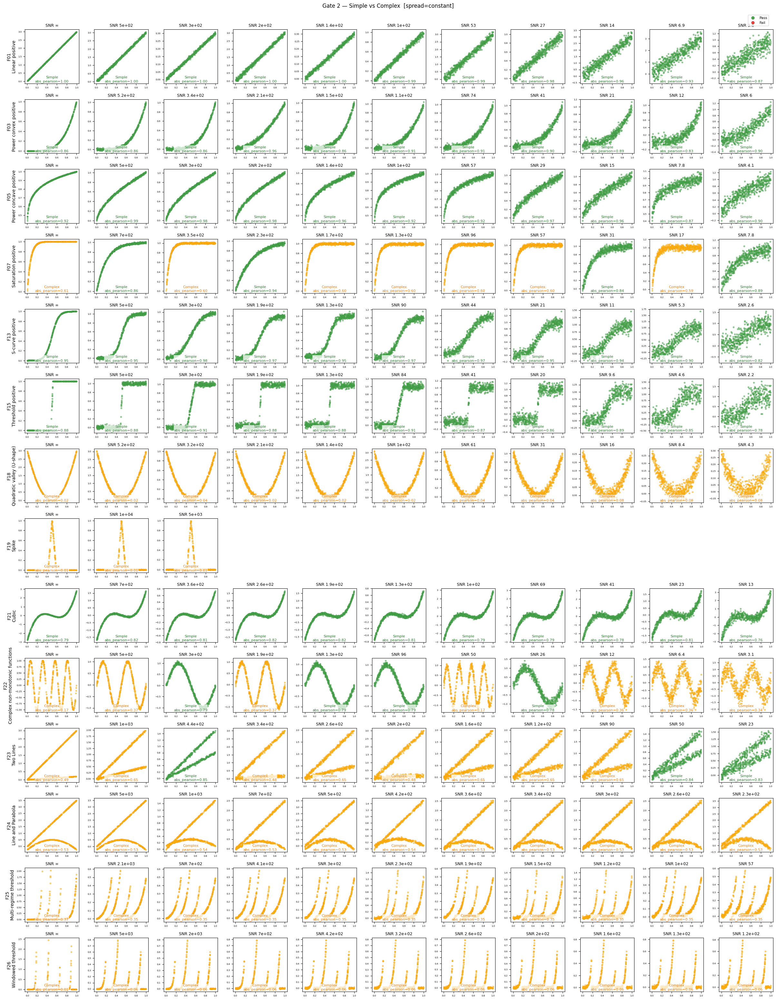

In [1457]:
print('=== Scatter diagnostic: Gate 2 (Simple vs Complex) ===')
gate2_data = data[data['gate1'].isin(MIC_ANALYSIS_GATES)].copy()
gate2_data['abs_pearson'] = gate2_data['pearson_r'].abs()
diag_scatter(gate2_data, 'gate2', 'Gate 2 — Simple vs Complex',
             metric_col='abs_pearson')

## Run Simple path (power-law only)

Rerun the power-law classification to identify which cases enter the Complex path:
- Gate 2 Complex (|Pearson| < 0.7)
- Simple path R² fail (power-law R² < threshold → "Enter next branch")

In [1458]:
# ── Simple path thresholds ──
R2_POWER_THRESHOLD = 0.85
LINEAR_B_TOLERANCE = 0.05

# ── Classification order switch ──
# 'r2_first'     : (default) check R² >= threshold, then check |b-1| for linear
# 'linear_first' : check |b-1| <= tolerance first to extract linear, then R² for concave/convex
CLASSIFICATION_ORDER = 'r2_first'   # switch: 'r2_first' or 'linear_first'

def _power_law(x, a, b, c):
    return a * np.power(np.maximum(x, 1e-10), b) + c


def _fit_power_law(x, y):
    valid = np.isfinite(x) & np.isfinite(y) & (x > 1e-6)
    if valid.sum() < 10:
        return None
    x, y = x[valid], y[valid]
    slope = np.polyfit(x, y, 1)[0]
    a0 = slope
    for b0 in [1.0, 0.5, 2.0, 0.3, 3.0]:
        try:
            popt, _ = curve_fit(
                _power_law, x, y, p0=[a0, b0, np.median(y)],
                maxfev=5000,
                bounds=([-np.inf, 0.05, -np.inf], [np.inf, 8.0, np.inf]),
            )
            y_pred = _power_law(x, *popt)
            ss_res = np.sum((y - y_pred) ** 2)
            ss_tot = np.sum((y - y.mean()) ** 2)
            r2 = 1 - ss_res / ss_tot if ss_tot > 0 else 0
            if r2 >= 0:
                return (*popt, r2)
        except (RuntimeError, ValueError):
            continue
    return None


def classify_power_law_stage(x, y):
    """Return a terminal power-law label, or None for cubic fallthrough.

    Two modes controlled by CLASSIFICATION_ORDER:
      'r2_first'     – R² gate first, then |b-1| for linear  (default)
      'linear_first' – |b-1| gate first for linear, then R² for concave/convex
    """
    pw = _fit_power_law(x, y)
    if pw is None:
        return None

    a, b, c, r2 = pw
    ab = a * b
    direction = 'positive' if ab > 0 else 'negative'
    details = {'step': 'power_law', 'a': a, 'b': b, 'c': c, 'r2': r2}

    if CLASSIFICATION_ORDER == 'linear_first':
        # Mode B: check |b-1| first → linear; then R² for concave/convex
        if abs(b - 1) <= LINEAR_B_TOLERANCE:
            return f'{direction}_line', details
        if r2 >= R2_POWER_THRESHOLD:
            curvature = a * b * (b - 1)
            if curvature < 0:
                return f'{direction}_concave', details
            else:
                return f'{direction}_convex', details
        return None
    else:
        # Mode A (default): R² gate first, then classify
        if r2 >= R2_POWER_THRESHOLD:
            if abs(b - 1) <= LINEAR_B_TOLERANCE:
                return f'{direction}_line', details
            curvature = a * b * (b - 1)
            if curvature < 0:
                return f'{direction}_concave', details
            else:
                return f'{direction}_convex', details
        return None

print(f'Power-law stage helpers defined.  CLASSIFICATION_ORDER = {CLASSIFICATION_ORDER!r}')

Power-law stage helpers defined.  CLASSIFICATION_ORDER = 'r2_first'


In [1459]:
import time

pt_idx = data['_pt_idx'].values
mask_simple = (data['gate2'] == 'Simple').values
idx_simple = np.where(mask_simple)[0]

pw_labels = np.full(len(data), '', dtype=object)
pw_r2_all = np.full(len(data), np.nan)
pw_a_all = np.full(len(data), np.nan)
pw_b_all = np.full(len(data), np.nan)

t0 = time.time()
for i in tqdm(idx_simple, desc='Power-law stage'):
    pi = pt_idx[i]
    x = x_all[pi].astype(np.float64)
    y = y_all[pi].astype(np.float64)
    pw = _fit_power_law(x, y)
    if pw is not None:
        a, b, c, r2 = pw
        pw_r2_all[i] = r2
        pw_a_all[i] = a
        pw_b_all[i] = b
        result = classify_power_law_stage(x, y)
        if result is not None:
            pw_labels[i] = result[0]
            continue
    pw_labels[i] = 'r2_fail'
print(f'Power-law: {len(idx_simple):,} cases in {time.time()-t0:.1f}s')

data['pw_label'] = pw_labels
data['pw_r2'] = pw_r2_all
data['pw_a'] = pw_a_all
data['pw_b'] = pw_b_all

mask_r2_fail = (data['pw_label'] == 'r2_fail') & mask_simple
mask_complex_g2 = (data['gate2'] == 'Complex').values
mask_enter_complex = mask_complex_g2 | mask_r2_fail
data['enters_complex'] = mask_enter_complex

# Build per-gate complex_data dict
complex_datas = {}
for _gate in MIC_ANALYSIS_GATES:
    gate_mask = (data['gate1'] == _gate).values & mask_enter_complex
    cd = data[gate_mask].copy()
    complex_datas[_gate] = cd

    print(f'\n=== Complex path [{_gate}]: {len(cd):,} cases ===')
    _g2_complex = (data['gate1'] == _gate).values & mask_complex_g2
    _g2_r2fail = (data['gate1'] == _gate).values & mask_r2_fail.values
    print(f'  from Gate 2 Complex: {_g2_complex.sum():,}')
    print(f'  from Simple R2 fail: {_g2_r2fail.sum():,}')
    _fc = cd.groupby(['family_id']).size().reset_index(name='n')
    _fc['family_name'] = _fc['family_id'].map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
    display(_fc.set_index('family_id'))

Power-law stage: 100%|██████████| 2355/2355 [00:08<00:00, 265.88it/s]

Power-law: 2,355 cases in 8.9s

=== Complex path [strong_global]: 1,113 cases ===
  from Gate 2 Complex: 529
  from Simple R2 fail: 584


,n,family_name
family_id,,
F01,8,Linear positive
F07,22,Saturation positive
F13,54,S-curve positive
F15,257,Threshold positive
F18,279,Quadratic valley (U)
F21,163,Cubic
F22,295,Oscillation
F23,27,Two Lines
F25,5,Multi-regime threshold



=== Complex path [intermediate_global]: 917 cases ===
  from Gate 2 Complex: 524
  from Simple R2 fail: 393


,n,family_name
family_id,,
F01,47,Linear positive
F03,29,Power convex positive
F05,41,Power concave positive
F07,80,Saturation positive
F13,33,S-curve positive
F15,32,Threshold positive
F18,49,Quadratic valley (U)
F19,3,Spike
F21,109,Cubic


### Scatter diagnostic — Simple path (power-law)

Three sub-steps:
- **A**: R² pass/fail (R² >= threshold?)
- **B**: Linear vs Non-linear (|b-1| <= tolerance?)
- **C**: Concave vs Convex (curvature sign)

=== Scatter diagnostic: Simple path ===

--- Simple Step A: R² >= threshold? ---


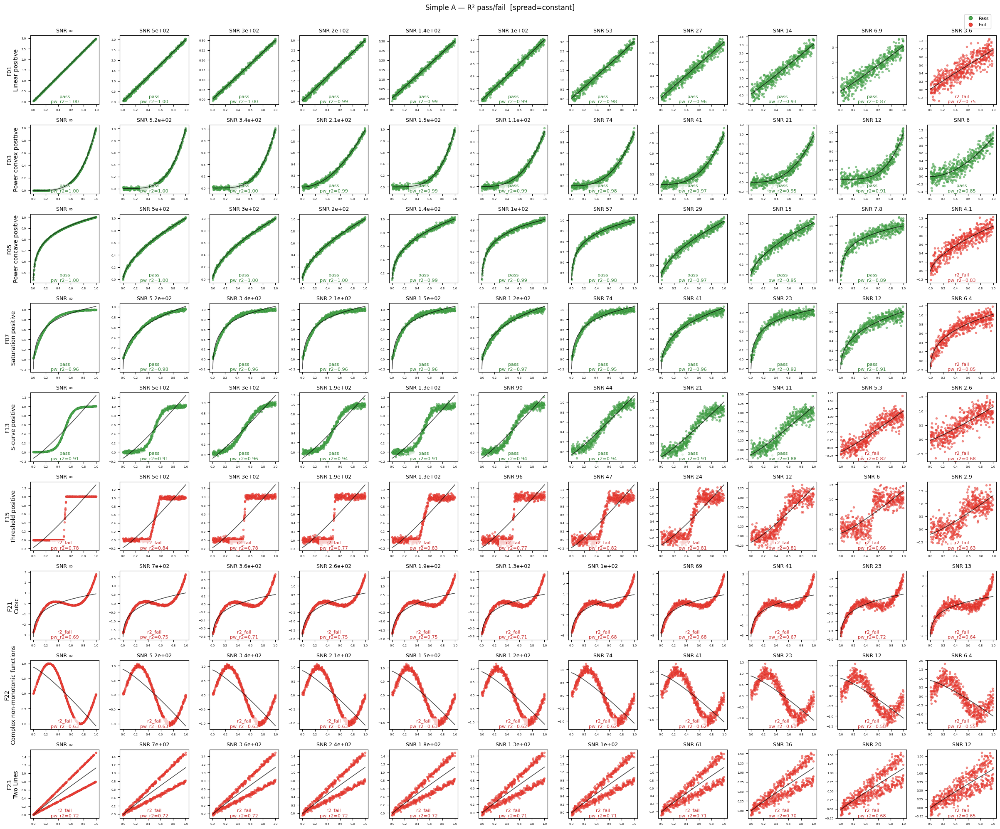


--- Simple Step B: Linear (|b-1| <= tol) vs Non-linear? ---


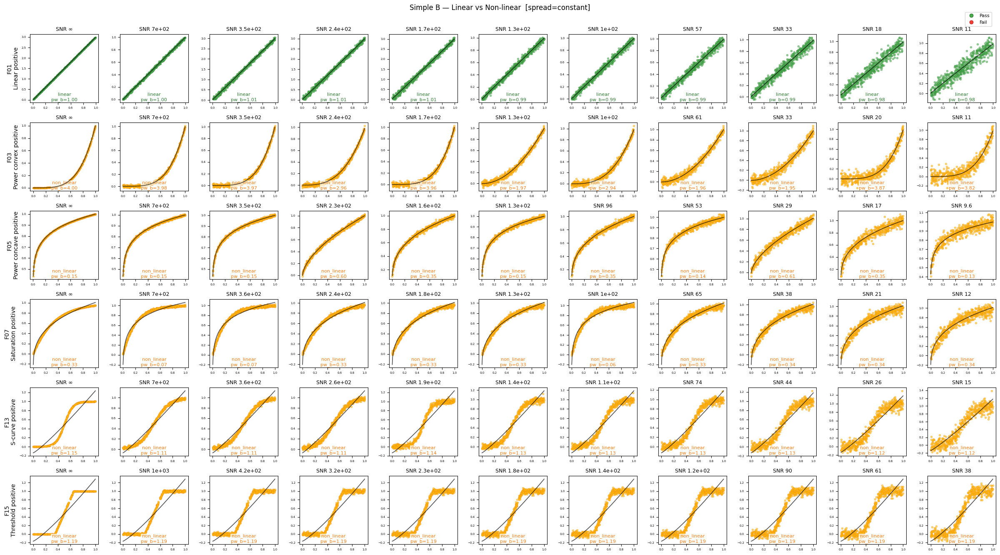


--- Simple Step C: Concave vs Convex? ---


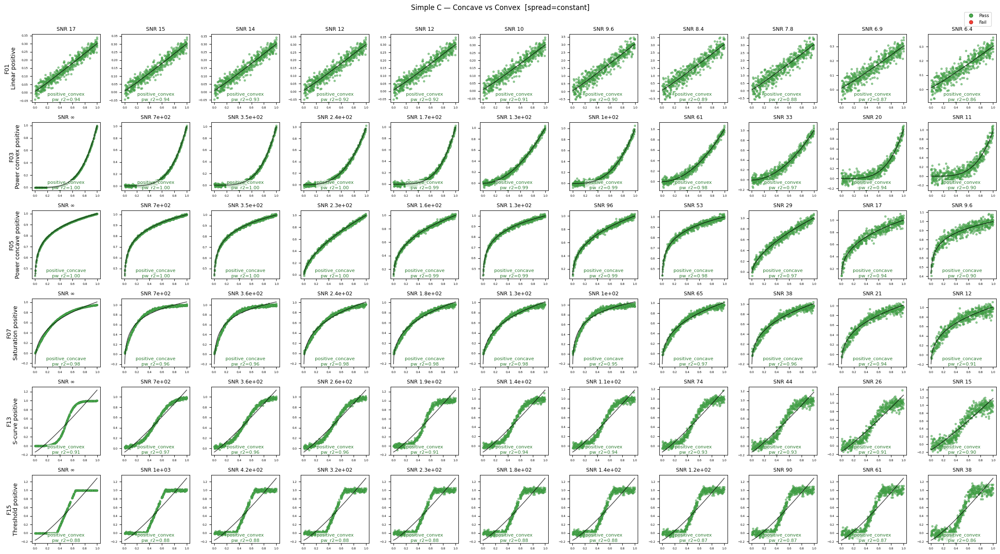

In [1460]:
print('=== Scatter diagnostic: Simple path ===')
simple_data = data[data['gate2'] == 'Simple'].copy()
if len(simple_data) == 0:
    print('No Simple-path cases.')
else:
    # Step A: R² pass vs fail
    simple_data['pw_r2_pass'] = np.where(
        simple_data['pw_label'] == 'r2_fail', 'r2_fail', 'pass')
    print('\n--- Simple Step A: R² >= threshold? ---')
    diag_scatter(simple_data, 'pw_r2_pass',
                 'Simple A — R² pass/fail', metric_col='pw_r2', draw_fit=True)

    # Step B: Linear vs Non-linear (only R² pass cases)
    r2_pass = simple_data[simple_data['pw_r2_pass'] == 'pass'].copy()
    if len(r2_pass) > 0:
        r2_pass['pw_linear'] = np.where(
            r2_pass['pw_label'].str.contains('line'), 'linear', 'non_linear')
        print('\n--- Simple Step B: Linear (|b-1| <= tol) vs Non-linear? ---')
        diag_scatter(r2_pass, 'pw_linear',
                     'Simple B — Linear vs Non-linear', metric_col='pw_b', draw_fit=True)

    # Step C: Concave vs Convex (only non-linear cases)
    non_lin = r2_pass[r2_pass['pw_linear'] == 'non_linear'].copy() if len(r2_pass) > 0 else pd.DataFrame()
    if len(non_lin) > 0:
        non_lin['pw_curvature'] = non_lin['pw_label']
        print('\n--- Simple Step C: Concave vs Convex? ---')
        diag_scatter(non_lin, 'pw_curvature',
                     'Simple C — Concave vs Convex', metric_col='pw_r2', draw_fit=True)

### Simple-path diagnostics (power-law routing)

In [1461]:
if RUN_SIMPLE_ANALYSIS:
    EXPECTED_POWER_ROUTE = {}
    for _fid, _exp in EXPECTED_SHAPE.items():
        if _exp.endswith('_line'):
            EXPECTED_POWER_ROUTE[_fid] = 'Linear'
        elif _exp.endswith('_saturation'):
            EXPECTED_POWER_ROUTE[_fid] = 'Saturation'
        elif _exp.endswith('_acceleration'):
            EXPECTED_POWER_ROUTE[_fid] = 'Acceleration'
        else:
            EXPECTED_POWER_ROUTE[_fid] = 'Enter next branch'

    SHAPE_TO_BROAD = {
        'positive_line': 'line', 'negative_line': 'line',
        'positive_concave': 'saturation', 'negative_concave': 'acceleration',
        'positive_convex': 'acceleration', 'negative_convex': 'saturation',
    }

    for _gate in MIC_ANALYSIS_GATES:
        _mask_gate = (data['gate1'] == _gate).values
        _mask_simple_gate = (data['gate2'] == 'Simple').values & _mask_gate
        _idx_simple_gate = np.where(_mask_simple_gate)[0]
        n_simple = len(_idx_simple_gate)
        if n_simple == 0:
            print(f'[{_gate}] No Simple cases, skipping.')
            continue

        print(f'\n{"="*60}')
        print(f'=== Simple-path diagnostics [{_gate}] ({n_simple:,} cases) ===')
        print(f'{"="*60}')

        _all_simple = data.loc[_mask_simple_gate].copy()
        _all_simple['_step'] = 'power_law'
        _all_simple.loc[_all_simple['pw_label'] == 'r2_fail', '_step'] = 'r2_fail'

        # ── Table 2: R² pass / fail ──
        _all_simple['r2_pass'] = _all_simple['_step'] == 'power_law'
        print(f'\n--- Table 2: Power-law R² >= {R2_POWER_THRESHOLD} ---')
        _t2 = _all_simple.groupby('family_id').agg(
            total_simple=('case_id', 'size'),
            r2_pass=('r2_pass', 'sum'),
        ).assign(r2_fail=lambda d: d['total_simple'] - d['r2_pass'])
        _t2_out = pd.DataFrame(index=_t2.index)
        _t2_out['family_name'] = _t2_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _t2_out['total_simple'] = [count_percent(n, n) for n in _t2['total_simple']]
        _t2_out[f'R²≥{R2_POWER_THRESHOLD}'] = [count_percent(n, t) for n, t in zip(_t2['r2_pass'], _t2['total_simple'])]
        _t2_out[f'R²<{R2_POWER_THRESHOLD}'] = [count_percent(n, t) for n, t in zip(_t2['r2_fail'], _t2['total_simple'])]
        display(_t2_out)

        # ── Table 3: Linear |b-1| (among R² pass) ──
        _pw = _all_simple[_all_simple['r2_pass']].copy()
        if len(_pw) > 0:
            _pw['is_linear'] = (_pw['pw_b'] - 1).abs() <= LINEAR_B_TOLERANCE
            print(f'\n--- Table 3: Linear |b-1| <= {LINEAR_B_TOLERANCE} (among R² pass) ---')
            _t3 = _pw.groupby('family_id').agg(
                r2_pass=('case_id', 'size'),
                linear=('is_linear', 'sum'),
            ).assign(not_linear=lambda d: d['r2_pass'] - d['linear'])
            _t3_out = pd.DataFrame(index=_t3.index)
            _t3_out['family_name'] = _t3_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
            _t3_out['R²_pass'] = [count_percent(n, n) for n in _t3['r2_pass']]
            _t3_out['Linear'] = [count_percent(n, t) for n, t in zip(_t3['linear'], _t3['r2_pass'])]
            _t3_out['Not linear'] = [count_percent(n, t) for n, t in zip(_t3['not_linear'], _t3['r2_pass'])]
            display(_t3_out)

            # ── Table 4: Curvature (among not-linear R² pass) ──
            _curv = _pw[~_pw['is_linear']].copy()
            if len(_curv) > 0:
                _curv['curvature_sign'] = np.sign(_curv['pw_a'] * _curv['pw_b'] * (_curv['pw_b'] - 1))
                _curv['curv_label'] = _curv['curvature_sign'].map({-1.0: 'Concave', 1.0: 'Convex', 0.0: 'Zero'}).fillna('Unknown')
                print(f'\n--- Table 4: Curvature a·b·(b-1) (among not-linear R² pass) ---')
                _t4 = _curv.groupby(['family_id', 'curv_label']).size().unstack(fill_value=0)
                for c in ['Concave', 'Convex']:
                    if c not in _t4.columns:
                        _t4[c] = 0
                _t4['total'] = _t4.sum(axis=1)
                _t4_out = pd.DataFrame(index=_t4.index)
                _t4_out['family_name'] = _t4_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
                _t4_out['total'] = [count_percent(n, n) for n in _t4['total']]
                for c in ['Concave', 'Convex']:
                    _t4_out[c] = [count_percent(n, t) for n, t in zip(_t4[c], _t4['total'])]
                display(_t4_out)

        # ── Table 5: Overall power-law routing + accuracy ──
        POWER_ROUTE_ORDER = ['Linear', 'Saturation', 'Acceleration', 'Enter next branch']
        _all_simple['broad_shape'] = _all_simple['pw_label'].map(SHAPE_TO_BROAD)
        _all_simple['power_route'] = _all_simple['broad_shape'].map({
            'line': 'Linear', 'saturation': 'Saturation', 'acceleration': 'Acceleration',
        }).fillna('Enter next branch')

        power_counts = _all_simple.groupby(['family_id', 'power_route']).size().unstack(fill_value=0)
        power_counts = power_counts.reindex(columns=POWER_ROUTE_ORDER, fill_value=0).sort_index()
        power_totals = power_counts.sum(axis=1)

        power_table = pd.DataFrame(index=power_counts.index)
        power_table['family_name'] = power_table.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        power_table['Total'] = [count_percent(n, n) for n in power_totals]
        for route in POWER_ROUTE_ORDER:
            power_table[route] = [count_percent(n, t) for n, t in zip(power_counts[route], power_totals)]

        _correct = pd.Series(0, index=power_counts.index, dtype=int)
        for fid in power_counts.index:
            expected = EXPECTED_POWER_ROUTE.get(fid, 'Enter next branch')
            if expected in power_counts.columns:
                _correct[fid] = int(power_counts.loc[fid, expected])
        power_table['Accuracy'] = [f'{c:,}/{t:,} ({c/t:.1%})' if t else 'N/A'
                                   for c, t in zip(_correct, power_totals)]

        _overall_counts = power_counts.sum()
        _overall_total = int(power_totals.sum())
        _overall_correct = int(_correct.sum())
        _overall = pd.DataFrame([{
            'family_name': 'All families',
            'Total': count_percent(_overall_total, _overall_total),
            **{r: count_percent(int(_overall_counts[r]), _overall_total) for r in POWER_ROUTE_ORDER},
            'Accuracy': f'{_overall_correct:,}/{_overall_total:,} ({_overall_correct/_overall_total:.1%})'
            if _overall_total else 'N/A',
        }], index=['Overall'])
        power_table = pd.concat([power_table, _overall])

        print(f'\n--- Table 5: Overall power-law routing (R²≥{R2_POWER_THRESHOLD}) ---')
        display(power_table)


=== Simple-path diagnostics [strong_global] (1,888 cases) ===

--- Table 2: Power-law R² >= 0.85 ---


,family_name,total_simple,R²≥0.85,R²<0.85
family_id,,,,
F01,Linear positive,291 (100.0%),283 (97.3%),8 (2.7%)
F03,Power convex positive,254 (100.0%),254 (100.0%),0 (0.0%)
F05,Power concave positive,276 (100.0%),276 (100.0%),0 (0.0%)
F07,Saturation positive,151 (100.0%),151 (100.0%),0 (0.0%)
F13,S-curve positive,321 (100.0%),267 (83.2%),54 (16.8%)
F15,Threshold positive,329 (100.0%),73 (22.2%),256 (77.8%)
F21,Cubic,163 (100.0%),0 (0.0%),163 (100.0%)
F22,Oscillation,103 (100.0%),0 (0.0%),103 (100.0%)



--- Table 3: Linear |b-1| <= 0.05 (among R² pass) ---


,family_name,R²_pass,Linear,Not linear
family_id,,,,
F01,Linear positive,283 (100.0%),251 (88.7%),32 (11.3%)
F03,Power convex positive,254 (100.0%),0 (0.0%),254 (100.0%)
F05,Power concave positive,276 (100.0%),0 (0.0%),276 (100.0%)
F07,Saturation positive,151 (100.0%),0 (0.0%),151 (100.0%)
F13,S-curve positive,267 (100.0%),0 (0.0%),267 (100.0%)
F15,Threshold positive,73 (100.0%),0 (0.0%),73 (100.0%)



--- Table 4: Curvature a·b·(b-1) (among not-linear R² pass) ---


,family_name,total,Concave,Convex
family_id,,,,
F01,Linear positive,32 (100.0%),0 (0.0%),32 (100.0%)
F03,Power convex positive,254 (100.0%),0 (0.0%),254 (100.0%)
F05,Power concave positive,276 (100.0%),276 (100.0%),0 (0.0%)
F07,Saturation positive,151 (100.0%),151 (100.0%),0 (0.0%)
F13,S-curve positive,267 (100.0%),0 (0.0%),267 (100.0%)
F15,Threshold positive,73 (100.0%),0 (0.0%),73 (100.0%)



--- Table 5: Overall power-law routing (R²≥0.85) ---


,family_name,Total,Linear,Saturation,Acceleration,Enter next branch,Accuracy
F01,Linear positive,291 (100.0%),251 (86.3%),0 (0.0%),32 (11.0%),8 (2.7%),251/291 (86.3%)
F03,Power convex positive,254 (100.0%),0 (0.0%),0 (0.0%),254 (100.0%),0 (0.0%),254/254 (100.0%)
F05,Power concave positive,276 (100.0%),0 (0.0%),276 (100.0%),0 (0.0%),0 (0.0%),276/276 (100.0%)
F07,Saturation positive,151 (100.0%),0 (0.0%),151 (100.0%),0 (0.0%),0 (0.0%),151/151 (100.0%)
F13,S-curve positive,321 (100.0%),0 (0.0%),0 (0.0%),267 (83.2%),54 (16.8%),54/321 (16.8%)
F15,Threshold positive,329 (100.0%),0 (0.0%),0 (0.0%),73 (22.2%),256 (77.8%),256/329 (77.8%)
F21,Cubic,163 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),163 (100.0%),163/163 (100.0%)
F22,Oscillation,103 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),103 (100.0%),103/103 (100.0%)
Overall,All families,"1,888 (100.0%)",251 (13.3%),427 (22.6%),626 (33.2%),584 (30.9%),"1,508/1,888 (79.9%)"



=== Simple-path diagnostics [intermediate_global] (467 cases) ===

--- Table 2: Power-law R² >= 0.85 ---


,family_name,total_simple,R²≥0.85,R²<0.85
family_id,,,,
F01,Linear positive,47 (100.0%),0 (0.0%),47 (100.0%)
F03,Power convex positive,57 (100.0%),28 (49.1%),29 (50.9%)
F05,Power concave positive,54 (100.0%),13 (24.1%),41 (75.9%)
F07,Saturation positive,55 (100.0%),33 (60.0%),22 (40.0%)
F13,S-curve positive,33 (100.0%),0 (0.0%),33 (100.0%)
F15,Threshold positive,19 (100.0%),0 (0.0%),19 (100.0%)
F21,Cubic,109 (100.0%),0 (0.0%),109 (100.0%)
F23,Two Lines,93 (100.0%),0 (0.0%),93 (100.0%)



--- Table 3: Linear |b-1| <= 0.05 (among R² pass) ---


,family_name,R²_pass,Linear,Not linear
family_id,,,,
F03,Power convex positive,28 (100.0%),0 (0.0%),28 (100.0%)
F05,Power concave positive,13 (100.0%),0 (0.0%),13 (100.0%)
F07,Saturation positive,33 (100.0%),0 (0.0%),33 (100.0%)



--- Table 4: Curvature a·b·(b-1) (among not-linear R² pass) ---


,family_name,total,Concave,Convex
family_id,,,,
F03,Power convex positive,28 (100.0%),0 (0.0%),28 (100.0%)
F05,Power concave positive,13 (100.0%),13 (100.0%),0 (0.0%)
F07,Saturation positive,33 (100.0%),33 (100.0%),0 (0.0%)



--- Table 5: Overall power-law routing (R²≥0.85) ---


,family_name,Total,Linear,Saturation,Acceleration,Enter next branch,Accuracy
F01,Linear positive,47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),47 (100.0%),0/47 (0.0%)
F03,Power convex positive,57 (100.0%),0 (0.0%),0 (0.0%),28 (49.1%),29 (50.9%),28/57 (49.1%)
F05,Power concave positive,54 (100.0%),0 (0.0%),13 (24.1%),0 (0.0%),41 (75.9%),13/54 (24.1%)
F07,Saturation positive,55 (100.0%),0 (0.0%),33 (60.0%),0 (0.0%),22 (40.0%),33/55 (60.0%)
F13,S-curve positive,33 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),33 (100.0%),33/33 (100.0%)
F15,Threshold positive,19 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),19 (100.0%),19/19 (100.0%)
F21,Cubic,109 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),109 (100.0%),109/109 (100.0%)
F23,Two Lines,93 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),93 (100.0%),93/93 (100.0%)
Overall,All families,467 (100.0%),0 (0.0%),46 (9.9%),28 (6.0%),393 (84.2%),328/467 (70.2%)


In [1462]:
if RUN_SIMPLE_ANALYSIS:
    R2_THRESHOLDS = [0.70, 0.75, 0.80, 0.85, 0.90, 0.95, 0.98]

    def _route_at_threshold(row, threshold):
        if CLASSIFICATION_ORDER == 'linear_first':
            if not np.isnan(row['pw_b']) and abs(row['pw_b'] - 1) <= LINEAR_B_TOLERANCE:
                return 'Linear'
            if np.isnan(row['pw_r2']) or row['pw_r2'] < threshold:
                return 'Enter next branch'
            curv = row['pw_a'] * row['pw_b'] * (row['pw_b'] - 1)
            if (row['pw_a'] > 0 and curv < 0) or (row['pw_a'] < 0 and curv > 0):
                return 'Saturation'
            return 'Acceleration'
        else:
            if np.isnan(row['pw_r2']) or row['pw_r2'] < threshold:
                return 'Enter next branch'
            b = row['pw_b']
            a = row['pw_a']
            if abs(b - 1) <= LINEAR_B_TOLERANCE:
                return 'Linear'
            curv = a * b * (b - 1)
            if (a > 0 and curv < 0) or (a < 0 and curv > 0):
                return 'Saturation'
            return 'Acceleration'

    for _gate in MIC_ANALYSIS_GATES:
        _mask_gate = (data['gate1'] == _gate).values
        _mask_simple_gate = (data['gate2'] == 'Simple').values & _mask_gate
        _simple_data = data.loc[_mask_simple_gate].copy()
        if len(_simple_data) == 0:
            continue

        print(f'\n{"="*60}')
        print(f'=== R² threshold sweep [{_gate}] (mode={CLASSIFICATION_ORDER}) ===')
        print(f'{"="*60}')

        rows = []
        for thr in R2_THRESHOLDS:
            _simple_data['_route'] = _simple_data.apply(lambda r: _route_at_threshold(r, thr), axis=1)
            _simple_data['_expected'] = _simple_data['family_id'].map(EXPECTED_POWER_ROUTE).fillna('Enter next branch')
            _simple_data['_correct'] = _simple_data['_route'] == _simple_data['_expected']

            per_family = _simple_data.groupby('family_id').agg(
                total=('case_id', 'size'),
                correct=('_correct', 'sum'),
            )

            row_data = {'R² threshold': thr}
            for fid in sorted(per_family.index):
                fname = FAMILY_CATALOGUE.get(fid, {}).get('name', fid)
                n_correct = int(per_family.loc[fid, 'correct'])
                n_total = int(per_family.loc[fid, 'total'])
                row_data[fname] = f'{n_correct}/{n_total} ({n_correct/n_total:.1%})'
            overall_correct = int(per_family['correct'].sum())
            overall_total = int(per_family['total'].sum())
            row_data['Overall'] = f'{overall_correct}/{overall_total} ({overall_correct/overall_total:.1%})'
            rows.append(row_data)

        sweep_df = pd.DataFrame(rows).set_index('R² threshold')
        display(sweep_df.T)


=== R² threshold sweep [strong_global] (mode=r2_first) ===


R² threshold,0.70,0.75,0.80,0.85,0.90,0.95,0.98
Linear positive,251/291 (86.3%),251/291 (86.3%),251/291 (86.3%),251/291 (86.3%),244/291 (83.8%),228/291 (78.4%),186/291 (63.9%)
Power convex positive,254/254 (100.0%),254/254 (100.0%),254/254 (100.0%),254/254 (100.0%),250/254 (98.4%),226/254 (89.0%),182/254 (71.7%)
Power concave positive,276/276 (100.0%),276/276 (100.0%),276/276 (100.0%),276/276 (100.0%),265/276 (96.0%),234/276 (84.8%),190/276 (68.8%)
Saturation positive,151/151 (100.0%),151/151 (100.0%),151/151 (100.0%),151/151 (100.0%),151/151 (100.0%),128/151 (84.8%),18/151 (11.9%)
S-curve positive,6/321 (1.9%),15/321 (4.7%),31/321 (9.7%),54/321 (16.8%),97/321 (30.2%),262/321 (81.6%),321/321 (100.0%)
Threshold positive,42/329 (12.8%),73/329 (22.2%),164/329 (49.8%),256/329 (77.8%),329/329 (100.0%),329/329 (100.0%),329/329 (100.0%)
Cubic,51/163 (31.3%),131/163 (80.4%),163/163 (100.0%),163/163 (100.0%),163/163 (100.0%),163/163 (100.0%),163/163 (100.0%)
Oscillation,103/103 (100.0%),103/103 (100.0%),103/103 (100.0%),103/103 (100.0%),103/103 (100.0%),103/103 (100.0%),103/103 (100.0%)
Overall,1134/1888 (60.1%),1254/1888 (66.4%),1393/1888 (73.8%),1508/1888 (79.9%),1602/1888 (84.9%),1673/1888 (88.6%),1492/1888 (79.0%)



=== R² threshold sweep [intermediate_global] (mode=r2_first) ===


R² threshold,0.70,0.75,0.80,0.85,0.90,0.95,0.98
Linear positive,13/47 (27.7%),10/47 (21.3%),5/47 (10.6%),0/47 (0.0%),0/47 (0.0%),0/47 (0.0%),0/47 (0.0%)
Power convex positive,57/57 (100.0%),52/57 (91.2%),43/57 (75.4%),28/57 (49.1%),9/57 (15.8%),0/57 (0.0%),0/57 (0.0%)
Power concave positive,50/54 (92.6%),42/54 (77.8%),28/54 (51.9%),13/54 (24.1%),2/54 (3.7%),0/54 (0.0%),0/54 (0.0%)
Saturation positive,55/55 (100.0%),52/55 (94.5%),45/55 (81.8%),33/55 (60.0%),16/55 (29.1%),0/55 (0.0%),0/55 (0.0%)
S-curve positive,28/33 (84.8%),32/33 (97.0%),33/33 (100.0%),33/33 (100.0%),33/33 (100.0%),33/33 (100.0%),33/33 (100.0%)
Threshold positive,19/19 (100.0%),19/19 (100.0%),19/19 (100.0%),19/19 (100.0%),19/19 (100.0%),19/19 (100.0%),19/19 (100.0%)
Cubic,68/109 (62.4%),109/109 (100.0%),109/109 (100.0%),109/109 (100.0%),109/109 (100.0%),109/109 (100.0%),109/109 (100.0%)
Two Lines,27/93 (29.0%),93/93 (100.0%),93/93 (100.0%),93/93 (100.0%),93/93 (100.0%),93/93 (100.0%),93/93 (100.0%)
Overall,317/467 (67.9%),409/467 (87.6%),375/467 (80.3%),328/467 (70.2%),281/467 (60.2%),254/467 (54.4%),254/467 (54.4%)


## Step 1 — Branch Detection (Conditional Dip Test)

For each x-bin, test whether Y|X is multimodal using Hartigan's dip test.
Persistent bimodality across bins → branching signal (e.g. F23 Two Lines).
Also counts the number of modes per bin via KDE peak detection.

In [1463]:
if RUN_METHOD_C:
    from scipy.signal import argrelextrema
    from scipy.stats import gaussian_kde
    try:
        from diptest import diptest as diptest_func
    except ImportError:
        diptest_func = None
        print('WARNING: diptest not installed')

    def conditional_dip_analysis(x, y, n_bins=8, kde_bw='silverman'):
        """Per-bin dip test + KDE mode count on Y|X."""
        valid = np.isfinite(x) & np.isfinite(y)
        x, y = x[valid], y[valid]
        n = len(x)
        if n < 30 or diptest_func is None:
            return None

        bin_edges = np.quantile(x, np.linspace(0, 1, n_bins + 1))
        bin_edges[0] -= 1e-10
        bin_idx = np.digitize(x, bin_edges[1:-1])

        bin_results = []
        for b in range(n_bins):
            y_bin = y[bin_idx == b]
            n_bin = len(y_bin)
            if n_bin < 10:
                bin_results.append({
                    'bin': b, 'n': n_bin,
                    'dip_stat': np.nan, 'dip_p': np.nan, 'dip_sig': False,
                    'n_modes': np.nan,
                })
                continue

            dip_stat, dip_p = diptest_func(y_bin)
            dip_sig = dip_p < 0.05

            # KDE mode count
            try:
                kde = gaussian_kde(y_bin, bw_method=kde_bw)
                y_grid = np.linspace(y_bin.min(), y_bin.max(), 200)
                density = kde(y_grid)
                peaks = argrelextrema(density, np.greater, order=5)[0]
                n_modes = max(len(peaks), 1)
            except Exception:
                n_modes = np.nan

            bin_results.append({
                'bin': b, 'n': n_bin,
                'dip_stat': float(dip_stat), 'dip_p': float(dip_p),
                'dip_sig': bool(dip_sig), 'n_modes': int(n_modes) if not np.isnan(n_modes) else np.nan,
            })

        n_sig = sum(1 for r in bin_results if r['dip_sig'])
        frac_sig = n_sig / n_bins
        mode_counts = [r['n_modes'] for r in bin_results if not np.isnan(r['n_modes'])]
        median_modes = float(np.median(mode_counts)) if mode_counts else np.nan

        return {
            'bin_results': bin_results,
            'n_bins': n_bins,
            'n_sig_bins': n_sig,
            'frac_sig': frac_sig,
            'median_modes': median_modes,
        }

    print('Conditional dip test helpers defined.')

Conditional dip test helpers defined.


In [1464]:
if RUN_METHOD_C:
    import time as _time
    cond_dip_dfs = {}

    for _gate in MIC_ANALYSIS_GATES:
        complex_data = complex_datas.get(_gate)
        if complex_data is None or len(complex_data) == 0:
            print(f'[{_gate}] No complex cases, skipping Method C.')
            continue

        print(f'\n{"="*60}')
        print(f'=== Conditional Dip Test [{_gate}] — {len(complex_data):,} cases ===')
        print(f'{"="*60}')

        cond_dip_results = []
        t0 = _time.time()

        for idx, row in tqdm(complex_data.iterrows(), total=len(complex_data), desc=f'Cond. dip [{_gate}]'):
            pi = int(row['_pt_idx'])
            x = x_all[pi].astype(np.float64)
            y = y_all[pi].astype(np.float64)
            result = conditional_dip_analysis(x, y)

            cid = row['case_id']
            fid = row['family_id']

            if result is not None:
                cond_dip_results.append({
                    'case_id': cid, 'family_id': fid,
                    'n_sig_bins': result['n_sig_bins'],
                    'frac_sig': result['frac_sig'],
                    'median_modes': result['median_modes'],
                    'is_branch': result['frac_sig'] >= 0.5,
                })
            else:
                cond_dip_results.append({
                    'case_id': cid, 'family_id': fid,
                    'n_sig_bins': 0, 'frac_sig': 0.0,
                    'median_modes': np.nan, 'is_branch': False,
                })

        print(f'Conditional dip test: {len(cond_dip_results):,} cases in {_time.time()-t0:.1f}s')

        cond_dip_df = pd.DataFrame(cond_dip_results)
        cond_dip_df['family_name'] = cond_dip_df['family_id'].map(
            lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', '')
        )
        cond_dip_dfs[_gate] = cond_dip_df


=== Conditional Dip Test [strong_global] — 1,113 cases ===


Cond. dip [strong_global]: 100%|██████████| 1113/1113 [00:05<00:00, 220.39it/s]


Conditional dip test: 1,113 cases in 5.1s

=== Conditional Dip Test [intermediate_global] — 917 cases ===


Cond. dip [intermediate_global]: 100%|██████████| 917/917 [00:04<00:00, 220.79it/s]

Conditional dip test: 917 cases in 4.2s



=== Method C: Branch Detection [strong_global] ===
Rule: >= 50% of x-bins with dip p<0.05 -> Branch
Also reports median KDE mode count per case



,,n,frac_sig_mean,frac_sig_std,median_modes_mean,n_branch,branch_rate
family_id,family_name,,,,,,
F01,Linear positive,8,0.000,0.000,1.000,0,0 (0.0%)
F07,Saturation positive,22,0.000,0.000,1.023,0,0 (0.0%)
F13,S-curve positive,54,0.000,0.000,1.000,0,0 (0.0%)
F15,Threshold positive,257,0.000,0.000,1.006,0,0 (0.0%)
F18,Quadratic valley (U),279,0.004,0.022,1.163,0,0 (0.0%)
F21,Cubic,163,0.002,0.014,1.028,0,0 (0.0%)
F22,Oscillation,295,0.000,0.000,1.314,0,0 (0.0%)
F23,Two Lines,27,0.829,0.062,2.000,27,27 (100.0%)
F25,Multi-regime threshold,5,0.150,0.137,2.000,0,0 (0.0%)


,family_name,Expected,Total,Non-branch,Branch,Accuracy
family_id,,,,,,
F01,Linear positive,Non-branch,8 (100.0%),8 (100.0%),0 (0.0%),8/8 (100.0%)
F07,Saturation positive,Non-branch,22 (100.0%),22 (100.0%),0 (0.0%),22/22 (100.0%)
F13,S-curve positive,Non-branch,54 (100.0%),54 (100.0%),0 (0.0%),54/54 (100.0%)
F15,Threshold positive,Non-branch,257 (100.0%),257 (100.0%),0 (0.0%),257/257 (100.0%)
F18,Quadratic valley (U),Non-branch,279 (100.0%),279 (100.0%),0 (0.0%),279/279 (100.0%)
F21,Cubic,Non-branch,163 (100.0%),163 (100.0%),0 (0.0%),163/163 (100.0%)
F22,Oscillation,Non-branch,295 (100.0%),295 (100.0%),0 (0.0%),295/295 (100.0%)
F23,Two Lines,Branch,27 (100.0%),0 (0.0%),27 (100.0%),27/27 (100.0%)
F25,Multi-regime threshold,Branch,5 (100.0%),5 (100.0%),0 (0.0%),0/5 (0.0%)



Overall accuracy: 1108/1113 (99.6%)


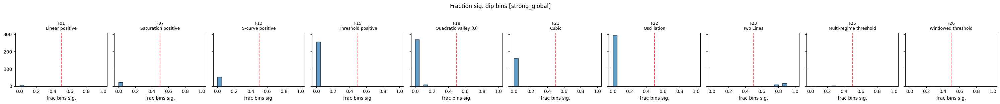


=== Method C: Branch Detection [intermediate_global] ===
Rule: >= 50% of x-bins with dip p<0.05 -> Branch
Also reports median KDE mode count per case



,,n,frac_sig_mean,frac_sig_std,median_modes_mean,n_branch,branch_rate
family_id,family_name,,,,,,
F01,Linear positive,47,0.000,0.000,1.000,0,0 (0.0%)
F03,Power convex positive,29,0.000,0.000,1.000,0,0 (0.0%)
F05,Power concave positive,41,0.000,0.000,1.000,0,0 (0.0%)
F07,Saturation positive,80,0.000,0.000,1.000,0,0 (0.0%)
F13,S-curve positive,33,0.000,0.000,1.000,0,0 (0.0%)
F15,Threshold positive,32,0.000,0.000,1.000,0,0 (0.0%)
F18,Quadratic valley (U),49,0.000,0.000,1.000,0,0 (0.0%)
F19,Spike,3,0.250,0.000,1.333,0,0 (0.0%)
F21,Cubic,109,0.000,0.000,1.000,0,0 (0.0%)


,family_name,Expected,Total,Non-branch,Branch,Accuracy
family_id,,,,,,
F01,Linear positive,Non-branch,47 (100.0%),47 (100.0%),0 (0.0%),47/47 (100.0%)
F03,Power convex positive,Non-branch,29 (100.0%),29 (100.0%),0 (0.0%),29/29 (100.0%)
F05,Power concave positive,Non-branch,41 (100.0%),41 (100.0%),0 (0.0%),41/41 (100.0%)
F07,Saturation positive,Non-branch,80 (100.0%),80 (100.0%),0 (0.0%),80/80 (100.0%)
F13,S-curve positive,Non-branch,33 (100.0%),33 (100.0%),0 (0.0%),33/33 (100.0%)
F15,Threshold positive,Non-branch,32 (100.0%),32 (100.0%),0 (0.0%),32/32 (100.0%)
F18,Quadratic valley (U),Non-branch,49 (100.0%),49 (100.0%),0 (0.0%),49/49 (100.0%)
F19,Spike,Non-branch,3 (100.0%),3 (100.0%),0 (0.0%),3/3 (100.0%)
F21,Cubic,Non-branch,109 (100.0%),109 (100.0%),0 (0.0%),109/109 (100.0%)



Overall accuracy: 775/917 (84.5%)


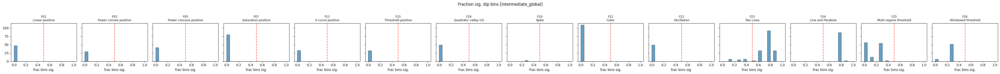

[strong_global] Non-branch: 1,086 / 1,113
[intermediate_global] Non-branch: 671 / 917


In [1465]:
if RUN_METHOD_C:
    import matplotlib.pyplot as plt
    BRANCH_FRAC_THRESHOLD = 0.5

    EXPECTED_BRANCH = {}
    for fid, props in FAMILY_CATALOGUE.items():
        if props.get('monotonicity', '') == 'multi-branch':
            EXPECTED_BRANCH[fid] = 'Branch'
        else:
            EXPECTED_BRANCH[fid] = 'Non-branch'

    for _gate in MIC_ANALYSIS_GATES:
        cond_dip_df = cond_dip_dfs.get(_gate)
        if cond_dip_df is None or len(cond_dip_df) == 0:
            continue

        print(f'\n{"="*60}')
        print(f'=== Method C: Branch Detection [{_gate}] ===')
        print(f'{"="*60}')
        print(f'Rule: >= {BRANCH_FRAC_THRESHOLD:.0%} of x-bins with dip p<0.05 -> Branch')
        print(f'Also reports median KDE mode count per case\n')

        _cd_summary = cond_dip_df.groupby(['family_id', 'family_name']).agg(
            n=('case_id', 'size'),
            frac_sig_mean=('frac_sig', 'mean'),
            frac_sig_std=('frac_sig', 'std'),
            median_modes_mean=('median_modes', 'mean'),
            n_branch=('is_branch', 'sum'),
        )
        _cd_summary['branch_rate'] = _cd_summary.apply(
            lambda r: count_percent(int(r['n_branch']), int(r['n'])), axis=1
        )
        _cd_summary = _cd_summary.round(3)
        display(_cd_summary)

        cond_dip_df['cond_dip_label'] = np.where(cond_dip_df['is_branch'], 'Branch', 'Non-branch')
        cond_dip_dfs[_gate] = cond_dip_df

        _cd_ct = cond_dip_df.groupby(['family_id', 'cond_dip_label']).size().unstack(fill_value=0)
        _cd_ct['total'] = _cd_ct.sum(axis=1)
        _cd_col_order = ['Non-branch', 'Branch']
        _cd_display = [c for c in _cd_col_order if c in _cd_ct.columns]

        _cd_out = pd.DataFrame(index=_cd_ct.index)
        _cd_out['family_name'] = _cd_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _cd_out['Expected'] = _cd_out.index.map(lambda f: EXPECTED_BRANCH.get(f, 'N/A'))
        _cd_out['Total'] = [count_percent(n, n) for n in _cd_ct['total']]
        for col in _cd_display:
            _cd_out[col] = [count_percent(int(n), int(t)) for n, t in zip(_cd_ct[col], _cd_ct['total'])]

        accuracy = []
        for fid in _cd_out.index:
            exp = EXPECTED_BRANCH.get(fid)
            total = int(_cd_ct.loc[fid, 'total'])
            if exp is None or exp not in _cd_ct.columns:
                accuracy.append('N/A')
            else:
                n_correct = int(_cd_ct.loc[fid, exp])
                accuracy.append(f'{n_correct}/{total} ({n_correct/total:.1%})')
        _cd_out['Accuracy'] = accuracy
        display(_cd_out)

        cond_dip_df['_expected'] = cond_dip_df['family_id'].map(EXPECTED_BRANCH)
        _eval_c = cond_dip_df[cond_dip_df['_expected'].notna()].copy()
        if len(_eval_c) > 0:
            _eval_c['_correct'] = _eval_c['cond_dip_label'] == _eval_c['_expected']
            n_tc = len(_eval_c)
            n_cc = int(_eval_c['_correct'].sum())
            print(f'\nOverall accuracy: {n_cc}/{n_tc} ({n_cc/n_tc:.1%})')

        families_c = sorted(cond_dip_df['family_id'].unique())
        n_fam = len(families_c)
        if n_fam > 0:
            fig, axes = plt.subplots(1, n_fam, figsize=(3*n_fam, 3), sharey=True)
            if n_fam == 1:
                axes = [axes]
            for ax, fid in zip(axes, families_c):
                subset = cond_dip_df[cond_dip_df['family_id'] == fid]
                fname = subset['family_name'].iloc[0] if len(subset) > 0 else fid
                ax.hist(subset['frac_sig'].dropna(), bins=20, range=(0, 1),
                        alpha=0.7, edgecolor='black')
                ax.set_title(f'{fid}\n{fname}', fontsize=9)
                ax.set_xlabel('frac bins sig.')
                ax.axvline(BRANCH_FRAC_THRESHOLD, color='red', ls='--', alpha=0.7)
            fig.suptitle(f'Fraction sig. dip bins [{_gate}]', y=1.02)
            plt.tight_layout()
            plt.show()

# ── Create non-branch subset for downstream steps ──
non_branch_datas = {}
for _gate in MIC_ANALYSIS_GATES:
    _cd = complex_datas.get(_gate)
    if _cd is None:
        continue
    if RUN_METHOD_C:
        _cdd = cond_dip_dfs.get(_gate)
        if _cdd is not None:
            _nb_ids = set(_cdd[~_cdd['is_branch']]['case_id'])
            non_branch_datas[_gate] = _cd[_cd['case_id'].isin(_nb_ids)].copy()
        else:
            non_branch_datas[_gate] = _cd.copy()
    else:
        non_branch_datas[_gate] = _cd.copy()
    print(f'[{_gate}] Non-branch: {len(non_branch_datas[_gate]):,} / {len(_cd):,}')

### Scatter diagnostic — Step 1: Branch detection

Cases classified as Branch vs Non-branch by conditional dip test.


=== Scatter diagnostic: Branch detection [strong_global] ===


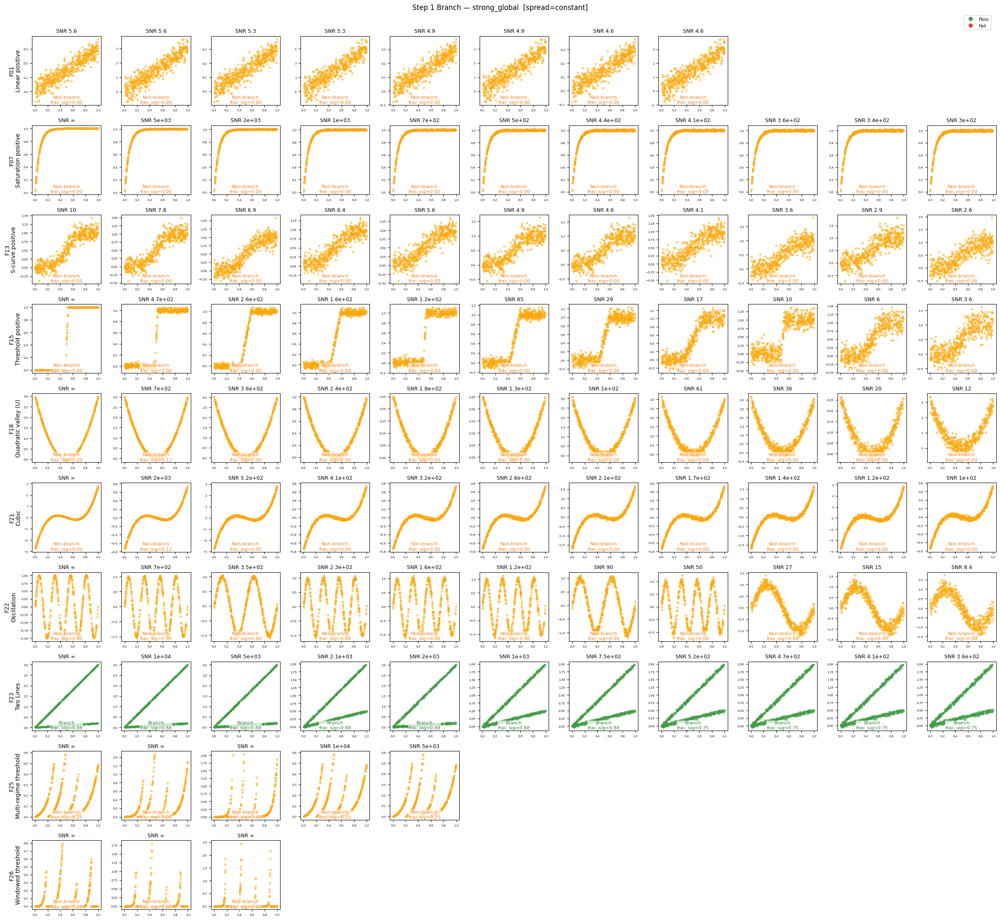


=== Scatter diagnostic: Branch detection [intermediate_global] ===


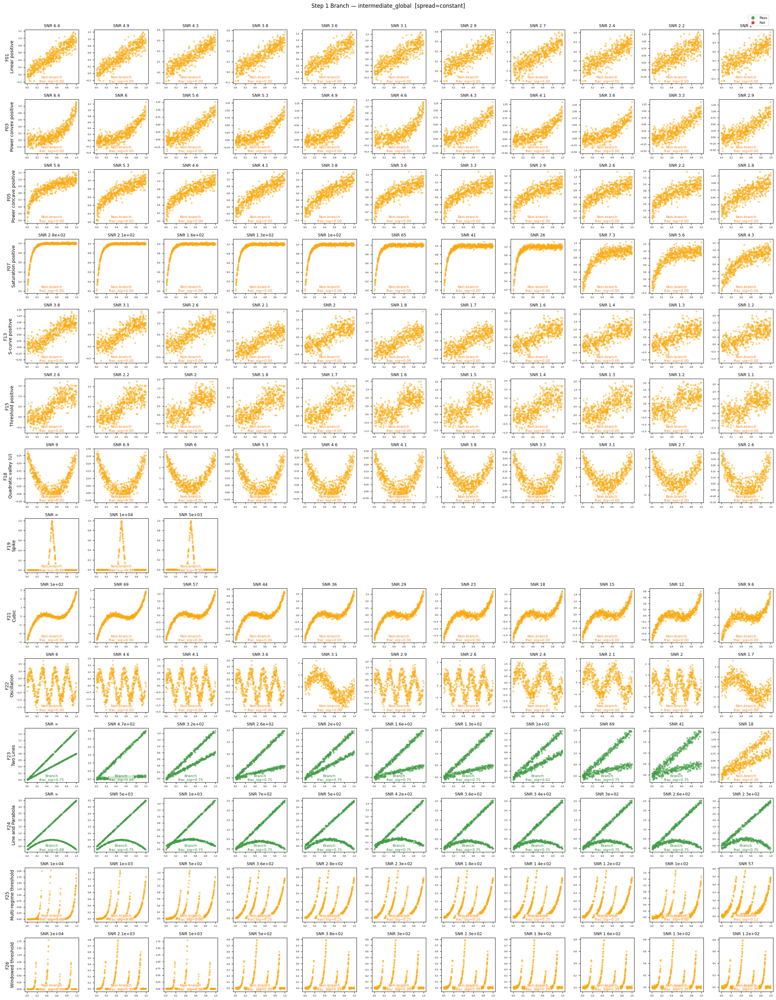

In [1466]:
if RUN_METHOD_C:
    for _gate in MIC_ANALYSIS_GATES:
        cond_dip_df = cond_dip_dfs.get(_gate)
        if cond_dip_df is None or len(cond_dip_df) == 0:
            continue
        print(f'\n=== Scatter diagnostic: Branch detection [{_gate}] ===')
        diag_scatter_from_sub(cond_dip_df, 'cond_dip_label',
                              f'Step 1 Branch — {_gate}',
                              metric_col='frac_sig')

In [1467]:
# if RUN_METHOD_C:
#     # ── Branch detection sensitivity analysis: threshold sweep ──
#     _thresholds = [0.30, 0.35, 0.40, 0.45, 0.50]

#     for _gate in MIC_ANALYSIS_GATES:
#         cond_dip_df = cond_dip_dfs.get(_gate)
#         if cond_dip_df is None or len(cond_dip_df) == 0:
#             continue

#         print(f'\n{"="*60}')
#         print(f'=== Branch threshold sensitivity [{_gate}] ===')
#         print(f'{"="*60}')
#         print(f'Thresholds: {_thresholds}\n')

#         # Families present in this gate's branch data
#         all_fids = sorted(cond_dip_df['family_id'].unique(),
#                           key=lambda x: (int(x[1:]) if x[1:].isdigit() else 999))
#         families = [f for f in all_fids if f != 'Null']

#         # Classify at each threshold
#         combo_results = {}
#         for thr in _thresholds:
#             labels = np.where(cond_dip_df['frac_sig'] >= thr, 'Branch', 'Non-branch')
#             per_fam = {}
#             n_correct_all = 0
#             n_total_all = 0
#             for fid in families:
#                 mask = cond_dip_df['family_id'] == fid
#                 fam_labels = labels[mask.values]
#                 exp = EXPECTED_BRANCH.get(fid)
#                 if exp is None:
#                     per_fam[fid] = None
#                     continue
#                 n_total = len(fam_labels)
#                 n_correct = int((fam_labels == exp).sum())
#                 per_fam[fid] = (n_correct, n_total)
#                 n_correct_all += n_correct
#                 n_total_all += n_total
#             combo_results[thr] = (per_fam, n_correct_all, n_total_all)

#         # Build table
#         col_idx = [f'{int(t*100)}%' for t in _thresholds]
#         rows = []
#         for fid in families:
#             row_data = []
#             for thr in _thresholds:
#                 result = combo_results[thr][0].get(fid)
#                 if result is None:
#                     row_data.append('N/A')
#                 else:
#                     nc, nt = result
#                     row_data.append(f'{nc}/{nt} ({nc/nt:.0%})')
#             rows.append(row_data)

#         # Overall row
#         overall_row = []
#         for thr in _thresholds:
#             _, nc, nt = combo_results[thr]
#             overall_row.append(f'{nc}/{nt} ({nc/nt:.0%})' if nt > 0 else '-')
#         rows.append(overall_row)

#         row_idx = pd.MultiIndex.from_tuples(
#             [(fid, FAMILY_CATALOGUE.get(fid, {}).get('name', ''),
#               EXPECTED_BRANCH.get(fid, 'N/A'))
#              for fid in families] + [('', 'Overall', '')],
#             names=['family_id', 'family_name', 'Expected'])

#         branch_sa = pd.DataFrame(rows, index=row_idx, columns=col_idx)
#         with pd.option_context('display.max_columns', None, 'display.width', None):
#             display(branch_sa)

## Step 2 — Turning-point Detection (SiZer, non-branch cases)

Local-linear derivative with multiscale turning-point consensus.
Runs on **non-branch** cases only (branch cases removed in Step 1).
SiZer (SIgnificant ZERo crossings of derivatives) fits local linear regressions with Gaussian kernel weights at multiple bandwidths to estimate the first derivative across the domain, then counts zero crossings (sign changes) that persist across scales as stable turning points.

In [1468]:
if RUN_METHOD_A:
    # ── Local-linear derivative with multiscale TP consensus ──
    
    
    def multiscale_tp_analysis(x, y, n_bandwidths=4, n_grid=200,
                               h_min=0.04, h_max=0.18,
                               interior=(0.05, 0.95),
                               min_run_frac=0.05,
                               flat_frac=FLAT_FRAC):
        """Compute local-linear derivative at multiple bandwidths, count turning points.
        
        Also computes width_ratio: fraction of interior with |β₁| > eps.
        """
        valid = np.isfinite(x) & np.isfinite(y)
        x, y = x[valid], y[valid]
        n = len(x)
        if n < 20:
            return None
        
        x_min, x_max = x.min(), x.max()
        x_range = x_max - x_min
        if x_range < 1e-10:
            return None
        x_norm = (x - x_min) / x_range
        
        x_grid = np.linspace(0, 1, n_grid)
        bandwidths = np.geomspace(h_min, h_max, n_bandwidths)
        
        interior_mask = (x_grid >= interior[0]) & (x_grid <= interior[1])
        n_interior = interior_mask.sum()
        min_run_len = max(int(min_run_frac * n_interior), 3)
        
        per_bw = []
        deriv_matrix = np.zeros((n_bandwidths, n_grid))
        
        for bw_idx, h in enumerate(bandwidths):
            beta1_row = np.full(n_grid, np.nan)
            
            for gi, xg in enumerate(x_grid):
                w = np.exp(-0.5 * ((x_norm - xg) / h) ** 2)
                w_sum = w.sum()
                if w_sum < 1e-10:
                    continue
                
                dx = x_norm - xg
                s0 = w_sum
                s1 = (w * dx).sum()
                s2 = (w * dx ** 2).sum()
                denom = s0 * s2 - s1 ** 2
                if abs(denom) < 1e-20:
                    continue
                
                beta1 = (s0 * (w * dx * y).sum() - s1 * (w * y).sum()) / denom
                beta1_row[gi] = beta1
            
            deriv_matrix[bw_idx] = beta1_row
            
            interior_deriv = beta1_row[interior_mask]
            if np.any(np.isfinite(interior_deriv)):
                abs_deriv = np.abs(interior_deriv)
                ref_val = np.nanmax(abs_deriv) if FLAT_REF == 'max' else np.nanmedian(abs_deriv)
                eps = flat_frac * ref_val
            else:
                eps = 0.0
            
            # TP count
            tp_count, tp_positions = _count_stable_tps(
                interior_deriv, x_grid[interior_mask], min_run_len, eps
            )
            
            # Width ratio: fraction of interior with |β₁| > eps
            n_significant = np.sum(np.abs(interior_deriv) > eps)
            width_ratio = float(n_significant / n_interior) if n_interior > 0 else 0.0
            
            per_bw.append({
                'bw_index': bw_idx + 1,
                'bandwidth': float(h),
                'tp_count': int(tp_count),
                'tp_positions': tp_positions,
                'width_ratio': width_ratio,
            })
        
        n_2tp = sum(1 for bw in per_bw if bw['tp_count'] == 2)
        tp_stable = _check_tp_stability(per_bw)
        
        return {
            'per_bw': per_bw,
            'p_2tp': n_2tp / n_bandwidths,
            'n_2tp_bw': n_2tp,
            'n_bandwidths': n_bandwidths,
            'tp_stable': tp_stable,
            'deriv_matrix': deriv_matrix,
            'x_grid': x_grid,
        }
    
    
    def _count_stable_tps(deriv, x_positions, min_run_len, eps=0.0):
        """Count turning points from stable sign runs in the derivative."""
        n = len(deriv)
        if n < 2:
            return 0, []
        
        runs = []
        current_sign = 0
        current_start = 0
        
        for i in range(n):
            if np.isnan(deriv[i]) or abs(deriv[i]) < eps:
                if current_sign != 0 and (i - current_start) >= min_run_len:
                    runs.append((current_sign, current_start, i - 1))
                current_sign = 0
                continue
            
            s = 1 if deriv[i] > 0 else -1
            if s != current_sign:
                if current_sign != 0 and (i - current_start) >= min_run_len:
                    runs.append((current_sign, current_start, i - 1))
                current_sign = s
                current_start = i
        
        if current_sign != 0 and (n - current_start) >= min_run_len:
            runs.append((current_sign, current_start, n - 1))
        
        tp_count = 0
        tp_positions = []
        for i in range(1, len(runs)):
            if runs[i][0] != runs[i - 1][0]:
                tp_count += 1
                idx_mid = (runs[i - 1][2] + runs[i][1]) // 2
                if idx_mid < len(x_positions):
                    tp_positions.append(float(x_positions[idx_mid]))
        
        return tp_count, tp_positions
    
    
    def _check_tp_stability(per_bw):
        """Check if TP positions are stable across bandwidths that have 2 TPs."""
        bws_with_2tp = [bw for bw in per_bw if bw['tp_count'] == 2]
        if len(bws_with_2tp) < 2:
            return len(bws_with_2tp) == 1
        
        tp1_positions = [bw['tp_positions'][0] for bw in bws_with_2tp]
        tp2_positions = [bw['tp_positions'][1] for bw in bws_with_2tp]
        
        tp1_range = max(tp1_positions) - min(tp1_positions)
        tp2_range = max(tp2_positions) - min(tp2_positions)
        
        return tp1_range < 0.15 and tp2_range < 0.15
    
    print(f'Multiscale TP helpers defined.  FLAT_FRAC = {FLAT_FRAC}, FLAT_REF = {FLAT_REF!r}')

Multiscale TP helpers defined.  FLAT_FRAC = 0.05, FLAT_REF = 'max'


In [1469]:
if RUN_METHOD_A:
    sizer_dfs = {}
    sizer_bw_dfs = {}

    for _gate in MIC_ANALYSIS_GATES:
        complex_data = non_branch_datas.get(_gate)
        if complex_data is None or len(complex_data) == 0:
            print(f'[{_gate}] No non-branch cases, skipping Method A.')
            continue

        print(f'\n{"="*60}')
        print(f'=== Multiscale TP [{_gate}] — {len(complex_data):,} non-branch cases ===')
        print(f'{"="*60}')

        sizer_results = []
        sizer_per_bw_records = []

        t0 = time.time()
        for idx, row in tqdm(complex_data.iterrows(), total=len(complex_data), desc=f'Multiscale TP [{_gate}]'):
            pi = int(row['_pt_idx'])
            x = x_all[pi].astype(np.float64)
            y = y_all[pi].astype(np.float64)
            result = multiscale_tp_analysis(x, y)

            cid = row['case_id']
            fid = row['family_id']

            if result is not None:
                tp_counts = [bw['tp_count'] for bw in result['per_bw']]
                w_ratios = [bw['width_ratio'] for bw in result['per_bw']]
                sizer_results.append({
                    'case_id': cid, 'family_id': fid,
                    'n_0tp_bw': sum(1 for t in tp_counts if t == 0),
                    'n_1tp_bw': sum(1 for t in tp_counts if t == 1),
                    'n_2tp_bw': sum(1 for t in tp_counts if t == 2),
                    'n_3tp_bw': sum(1 for t in tp_counts if t == 3),
                    'n_gt3tp_bw': sum(1 for t in tp_counts if t > 3),
                    'tp_stable': result['tp_stable'],
                    'width_ratio_fine': w_ratios[0],
                    'width_ratio_mean': float(np.mean(w_ratios)),
                })
                for bw_info in result['per_bw']:
                    sizer_per_bw_records.append({
                        'case_id': cid, 'family_id': fid,
                        'bw_index': bw_info['bw_index'],
                        'bandwidth': bw_info['bandwidth'],
                        'tp_count': bw_info['tp_count'],
                        'width_ratio': bw_info['width_ratio'],
                        'tp_positions': bw_info['tp_positions'],
                    })
            else:
                sizer_results.append({
                    'case_id': cid, 'family_id': fid,
                    'n_0tp_bw': 0, 'n_1tp_bw': 0, 'n_2tp_bw': 0,
                    'n_3tp_bw': 0, 'n_gt3tp_bw': 0, 'tp_stable': False,
                    'width_ratio_fine': np.nan, 'width_ratio_mean': np.nan,
                })

        print(f'Multiscale TP: {len(sizer_results):,} cases in {time.time()-t0:.1f}s')

        sizer_df = pd.DataFrame(sizer_results)
        sizer_df['family_name'] = sizer_df['family_id'].map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        sizer_bw_df = pd.DataFrame(sizer_per_bw_records)

        sizer_dfs[_gate] = sizer_df
        sizer_bw_dfs[_gate] = sizer_bw_df

        print(f'\nSummary per family (mean # bandwidths supporting each TP count):')
        display(sizer_df.groupby(['family_id', 'family_name']).agg(
            n=('case_id', 'size'),
            tp0=('n_0tp_bw', 'mean'),
            tp1=('n_1tp_bw', 'mean'),
            tp2=('n_2tp_bw', 'mean'),
            tp3=('n_3tp_bw', 'mean'),
            tp_gt3=('n_gt3tp_bw', 'mean'),
            wr_fine=('width_ratio_fine', 'mean'),
            wr_mean=('width_ratio_mean', 'mean'),
        ).round(2))


=== Multiscale TP [strong_global] — 1,086 non-branch cases ===


Multiscale TP [strong_global]: 100%|██████████| 1086/1086 [00:10<00:00, 108.10it/s]

Multiscale TP: 1,086 cases in 10.1s

Summary per family (mean # bandwidths supporting each TP count):


,,n,tp0,tp1,tp2,tp3,tp_gt3,wr_fine,wr_mean
family_id,family_name,,,,,,,,
F01,Linear positive,8,4.00,0.0,0.00,0.0,0.00,1.00,1.00
F07,Saturation positive,22,4.00,0.0,0.00,0.0,0.00,0.26,0.38
F13,S-curve positive,54,3.81,0.0,0.19,0.0,0.00,0.87,0.97
F15,Threshold positive,257,3.22,0.3,0.31,0.0,0.17,0.45,0.65
F18,Quadratic valley (U),279,0.00,4.0,0.00,0.0,0.00,0.95,0.96
F21,Cubic,163,1.00,0.0,3.00,0.0,0.00,0.88,0.90
F22,Oscillation,295,0.32,0.0,2.06,0.0,1.62,0.97,0.95
F25,Multi-regime threshold,5,0.20,0.0,2.80,0.0,1.00,0.88,0.82
F26,Windowed threshold,3,0.00,0.0,2.00,0.0,2.00,0.91,0.93



=== Multiscale TP [intermediate_global] — 671 non-branch cases ===


Multiscale TP [intermediate_global]: 100%|██████████| 671/671 [00:06<00:00, 109.05it/s]

Multiscale TP: 671 cases in 6.2s

Summary per family (mean # bandwidths supporting each TP count):


,,n,tp0,tp1,tp2,tp3,tp_gt3,wr_fine,wr_mean
family_id,family_name,,,,,,,,
F01,Linear positive,47,4.00,0.00,0.00,0.00,0.00,0.99,1.00
F03,Power convex positive,29,4.00,0.00,0.00,0.00,0.00,0.87,0.93
F05,Power concave positive,41,4.00,0.00,0.00,0.00,0.00,0.97,0.99
F07,Saturation positive,80,4.00,0.00,0.00,0.00,0.00,0.44,0.54
F13,S-curve positive,33,3.06,0.30,0.30,0.33,0.00,0.91,0.96
F15,Threshold positive,32,1.72,0.56,0.78,0.00,0.94,0.85,0.87
F18,Quadratic valley (U),49,0.00,4.00,0.00,0.00,0.00,0.93,0.95
F19,Spike,3,0.00,4.00,0.00,0.00,0.00,0.34,0.65
F21,Cubic,109,1.00,0.00,3.00,0.00,0.00,0.88,0.90



=== TP support diagnostic [strong_global] ===

=== Per-bandwidth mean TP count by family ===


,family_name,bw_1,bw_2,bw_3,bw_4
family_id,,,,,
F01,Linear positive,0.00,0.00,0.00,0.00
F07,Saturation positive,0.00,0.00,0.00,0.00
F13,S-curve positive,0.37,0.00,0.00,0.00
F15,Threshold positive,1.11,0.44,0.06,0.00
F18,Quadratic valley (U),1.00,1.00,1.00,1.00
F21,Cubic,2.00,2.00,2.00,0.00
F22,Oscillation,3.94,3.94,2.64,1.36
F25,Multi-regime threshold,6.00,2.00,2.00,1.60
F26,Windowed threshold,7.00,6.33,2.00,2.00



=== TP = 0 support distribution — Monotonic (Transition/Saturation/Acceleration…) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,8,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),8 (100.0%),0 (0.0%)
F07,Saturation positive,22,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),22 (100.0%),0 (0.0%)
F13,S-curve positive,54,0 (0.0%),0 (0.0%),0 (0.0%),10 (18.5%),44 (81.5%),0 (0.0%)
F15,Threshold positive,257,0 (0.0%),15 (5.8%),57 (22.2%),42 (16.3%),143 (55.6%),0 (0.0%)
F18,Quadratic valley (U),279,279 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,163,0 (0.0%),163 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F22,Oscillation,295,201 (68.1%),94 (31.9%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F25,Multi-regime threshold,5,4 (80.0%),1 (20.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F26,Windowed threshold,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP = 1 support distribution — U-shape / Spike (F18/F19/F20) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,8,8 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,22,22 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,54,54 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,257,188 (73.2%),61 (23.7%),8 (3.1%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),279,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),279 (100.0%),0 (0.0%)
F21,Cubic,163,163 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F22,Oscillation,295,295 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F25,Multi-regime threshold,5,5 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F26,Windowed threshold,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP = 2 support distribution — Cubic (F21) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,8,8 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,22,22 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,54,44 (81.5%),10 (18.5%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,257,187 (72.8%),60 (23.3%),10 (3.9%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),279,279 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,163,0 (0.0%),0 (0.0%),0 (0.0%),163 (100.0%),0 (0.0%),0 (0.0%)
F22,Oscillation,295,94 (31.9%),0 (0.0%),98 (33.2%),0 (0.0%),103 (34.9%),0 (0.0%)
F25,Multi-regime threshold,5,0 (0.0%),0 (0.0%),1 (20.0%),4 (80.0%),0 (0.0%),0 (0.0%)
F26,Windowed threshold,3,0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP = 3 support distribution — Oscillation / Multi-regime ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,8,8 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,22,22 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,54,54 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,257,257 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),279,279 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,163,163 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F22,Oscillation,295,295 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F25,Multi-regime threshold,5,5 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F26,Windowed threshold,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP > 3 support distribution — High-frequency oscillation ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,8,8 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,22,22 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,54,54 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,257,218 (84.8%),34 (13.2%),5 (1.9%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),279,279 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,163,163 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F22,Oscillation,295,103 (34.9%),0 (0.0%),98 (33.2%),94 (31.9%),0 (0.0%),0 (0.0%)
F25,Multi-regime threshold,5,0 (0.0%),5 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F26,Windowed threshold,3,0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)


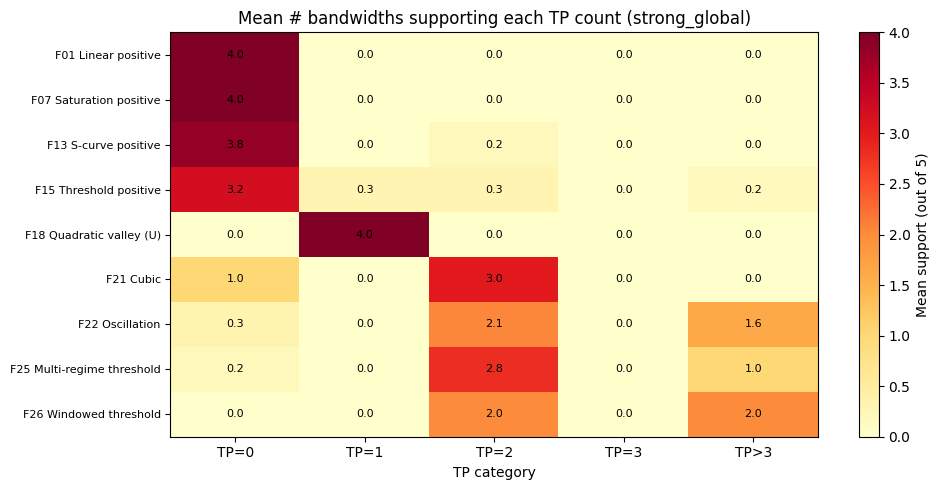


=== Uncertain cases (max support < 3/5): 174/1086 (16.0%) ===
family_id            family_name       frac_str
      F15     Threshold positive 72/257 (28.0%)
      F22            Oscillation 98/295 (33.2%)
      F25 Multi-regime threshold    1/5 (20.0%)
      F26     Windowed threshold   3/3 (100.0%)

TP support vectors (uncertain cases, first 20):


,case_id,family_id,TP0,TP1,TP2,TP3,TP>3,family_name
84,S034171,F15,2,1,1,0,0,Threshold positive
85,S034172,F15,2,1,1,0,0,Threshold positive
86,S034173,F15,2,1,1,0,0,Threshold positive
87,S034174,F15,2,1,1,0,0,Threshold positive
88,S034175,F15,2,1,1,0,0,Threshold positive
89,S034176,F15,2,1,1,0,0,Threshold positive
90,S034177,F15,2,1,1,0,0,Threshold positive
91,S034178,F15,2,1,1,0,0,Threshold positive
92,S034179,F15,2,1,1,0,0,Threshold positive
93,S034180,F15,2,1,1,0,0,Threshold positive


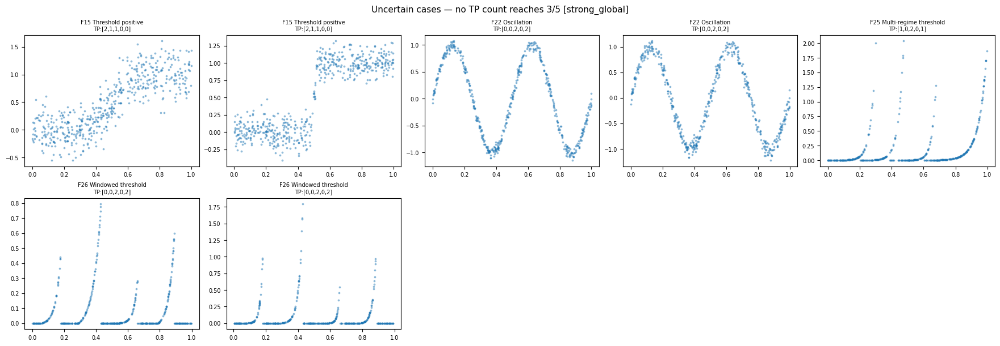


=== TP support diagnostic [intermediate_global] ===

=== Per-bandwidth mean TP count by family ===


,family_name,bw_1,bw_2,bw_3,bw_4
family_id,,,,,
F01,Linear positive,0.00,0.00,0.00,0.00
F03,Power convex positive,0.00,0.00,0.00,0.00
F05,Power concave positive,0.00,0.00,0.00,0.00
F07,Saturation positive,0.00,0.00,0.00,0.00
F13,S-curve positive,1.91,0.00,0.00,0.00
F15,Threshold positive,3.31,2.28,0.28,0.00
F18,Quadratic valley (U),1.00,1.00,1.00,1.00
F19,Spike,1.00,1.00,1.00,1.00
F21,Cubic,2.00,2.00,2.00,0.00



=== TP = 0 support distribution — Monotonic (Transition/Saturation/Acceleration…) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,47,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),47 (100.0%),0 (0.0%)
F03,Power convex positive,29,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),29 (100.0%),0 (0.0%)
F05,Power concave positive,41,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),41 (100.0%),0 (0.0%)
F07,Saturation positive,80,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),80 (100.0%),0 (0.0%)
F13,S-curve positive,33,0 (0.0%),0 (0.0%),0 (0.0%),31 (93.9%),2 (6.1%),0 (0.0%)
F15,Threshold positive,32,0 (0.0%),9 (28.1%),23 (71.9%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),49,49 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F19,Spike,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,109,0 (0.0%),109 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP = 1 support distribution — U-shape / Spike (F18/F19/F20) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,47,47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F03,Power convex positive,29,29 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F05,Power concave positive,41,41 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,80,80 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,33,23 (69.7%),10 (30.3%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,32,14 (43.8%),18 (56.2%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),49,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),49 (100.0%),0 (0.0%)
F19,Spike,3,0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%)
F21,Cubic,109,109 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP = 2 support distribution — Cubic (F21) ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,47,47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F03,Power convex positive,29,29 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F05,Power concave positive,41,41 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,80,80 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,33,23 (69.7%),10 (30.3%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,32,9 (28.1%),21 (65.6%),2 (6.2%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),49,49 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F19,Spike,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,109,0 (0.0%),0 (0.0%),0 (0.0%),109 (100.0%),0 (0.0%),0 (0.0%)



=== TP = 3 support distribution — Oscillation / Multi-regime ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,47,47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F03,Power convex positive,29,29 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F05,Power concave positive,41,41 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,80,80 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,33,22 (66.7%),11 (33.3%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,32,32 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),49,49 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F19,Spike,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,109,109 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)



=== TP > 3 support distribution — High-frequency oscillation ===


,family_name,n,0/5,1/5,2/5,3/5,4/5,5/5
family_id,,,,,,,,
F01,Linear positive,47,47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F03,Power convex positive,29,29 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F05,Power concave positive,41,41 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,80,80 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,33,33 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,32,11 (34.4%),12 (37.5%),9 (28.1%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),49,49 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F19,Spike,3,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F21,Cubic,109,109 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%)


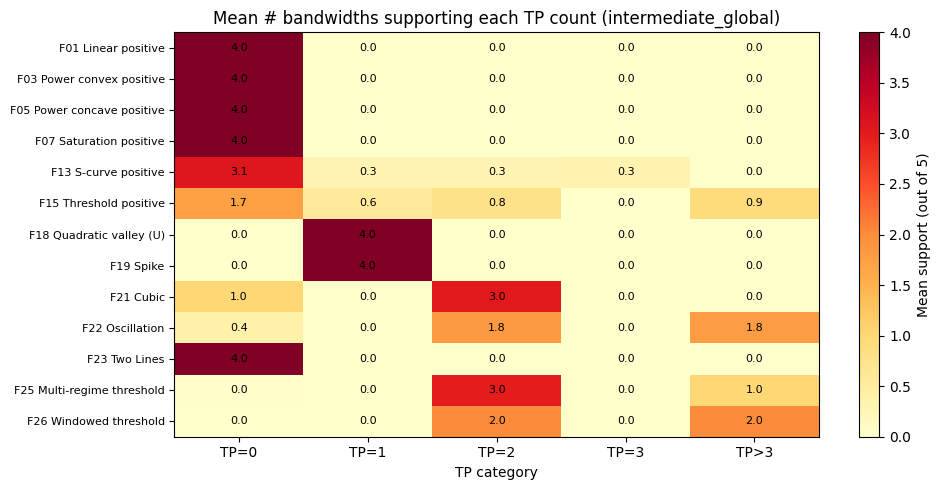


=== Uncertain cases (max support < 3/5): 109/671 (16.2%) ===
family_id            family_name       frac_str
      F15     Threshold positive 32/32 (100.0%)
      F22            Oscillation  15/49 (30.6%)
      F25 Multi-regime threshold   5/125 (4.0%)
      F26     Windowed threshold 57/57 (100.0%)

TP support vectors (uncertain cases, first 20):


,case_id,family_id,TP0,TP1,TP2,TP3,TP>3,family_name
230,S034160,F15,2,0,2,0,0,Threshold positive
231,S034161,F15,2,0,2,0,0,Threshold positive
232,S034162,F15,2,1,1,0,0,Threshold positive
233,S034163,F15,2,1,1,0,0,Threshold positive
234,S034164,F15,2,1,1,0,0,Threshold positive
235,S034165,F15,2,1,1,0,0,Threshold positive
236,S034166,F15,2,1,1,0,0,Threshold positive
237,S034167,F15,2,1,1,0,0,Threshold positive
238,S034168,F15,2,1,1,0,0,Threshold positive
239,S034169,F15,2,1,1,0,0,Threshold positive


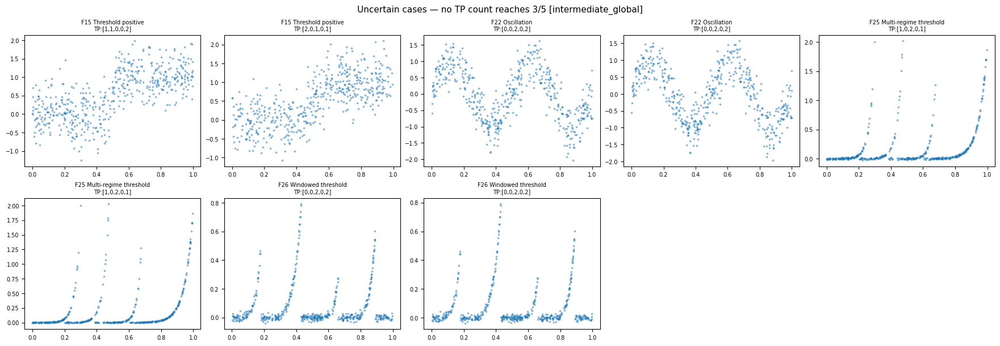

In [1470]:
if RUN_METHOD_A:
    import matplotlib.pyplot as plt

    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        sizer_bw_df = sizer_bw_dfs.get(_gate)
        if sizer_df is None or len(sizer_df) == 0:
            continue

        print(f'\n{"="*60}')
        print(f'=== TP support diagnostic [{_gate}] ===')
        print(f'{"="*60}')

        print('\n=== Per-bandwidth mean TP count by family ===')
        if len(sizer_bw_df) > 0:
            _bw_tp = sizer_bw_df.pivot_table(
                index='family_id', columns='bw_index', values='tp_count', aggfunc='mean'
            ).round(2)
            _bw_tp.columns = [f'bw_{int(c)}' for c in _bw_tp.columns]
            _bw_tp.insert(0, 'family_name', _bw_tp.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', '')))
            display(_bw_tp)

        TP_CATEGORIES = [
            ('n_0tp_bw', 'TP = 0', 'Monotonic (Transition/Saturation/Acceleration…)'),
            ('n_1tp_bw', 'TP = 1', 'U-shape / Spike (F18/F19/F20)'),
            ('n_2tp_bw', 'TP = 2', 'Cubic (F21)'),
            ('n_3tp_bw', 'TP = 3', 'Oscillation / Multi-regime'),
            ('n_gt3tp_bw', 'TP > 3', 'High-frequency oscillation'),
        ]

        for col, tp_label, description in TP_CATEGORIES:
            print(f'\n=== {tp_label} support distribution — {description} ===')
            _support = sizer_df.copy()
            _support[col] = _support[col].fillna(0).astype(int)
            _sup_table = _support.groupby('family_id')[col].value_counts().unstack(fill_value=0)
            _sup_table = _sup_table.reindex(columns=range(6), fill_value=0)
            _sup_totals = _sup_table.sum(axis=1)
            _sup_out = pd.DataFrame(index=_sup_table.index)
            _sup_out['family_name'] = _sup_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
            _sup_out['n'] = _sup_totals
            for c in _sup_table.columns:
                _sup_out[f'{c}/5'] = [count_percent(int(n), int(t)) for n, t in zip(_sup_table[c], _sup_totals)]
            display(_sup_out)

        fig, ax = plt.subplots(figsize=(10, 5))
        tp_cols = ['n_0tp_bw', 'n_1tp_bw', 'n_2tp_bw', 'n_3tp_bw', 'n_gt3tp_bw']
        tp_labels = ['TP=0', 'TP=1', 'TP=2', 'TP=3', 'TP>3']
        _heat = sizer_df.groupby('family_id')[tp_cols].mean()
        _heat.columns = tp_labels
        _heat = _heat.loc[sorted(_heat.index)]

        im = ax.imshow(_heat.values, aspect='auto', cmap='YlOrRd')
        ax.set_xticks(range(len(tp_labels)))
        ax.set_xticklabels(tp_labels)
        ax.set_yticks(range(len(_heat.index)))
        fnames = [f'{fid} {FAMILY_CATALOGUE.get(fid, {}).get("name", "")}' for fid in _heat.index]
        ax.set_yticklabels(fnames, fontsize=8)
        for i in range(len(_heat.index)):
            for j in range(len(tp_labels)):
                ax.text(j, i, f'{_heat.values[i, j]:.1f}', ha='center', va='center', fontsize=8)
        ax.set_title(f'Mean # bandwidths supporting each TP count ({_gate})')
        ax.set_xlabel('TP category')
        fig.colorbar(im, ax=ax, label='Mean support (out of 5)')
        plt.tight_layout()
        plt.show()

        # ── Uncertain cases: no TP count reaches 3/5 support ──
        _unc = sizer_df.copy()
        _unc['_max_support'] = _unc[['n_0tp_bw', 'n_1tp_bw', 'n_2tp_bw', 'n_3tp_bw', 'n_gt3tp_bw']].max(axis=1)
        _unc = _unc[_unc['_max_support'] < 3]
        n_unc = len(_unc)
        n_total = len(sizer_df)
        print(f'\n=== Uncertain cases (max support < 3/5): {n_unc}/{n_total} ({n_unc/n_total:.1%}) ===')

        if n_unc > 0:
            _unc_by_fam = _unc.groupby('family_id').size().reset_index(name='count')
            _unc_by_fam['family_name'] = _unc_by_fam['family_id'].map(
                lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
            _unc_by_fam['frac'] = _unc_by_fam['count'] / _unc_by_fam['family_id'].map(
                lambda f: len(sizer_df[sizer_df['family_id'] == f]))
            _unc_by_fam['frac_str'] = _unc_by_fam.apply(
                lambda r: f'{int(r["count"])}/{int(r["count"]/r["frac"])} ({r["frac"]:.1%})', axis=1)
            print(_unc_by_fam[['family_id', 'family_name', 'frac_str']].to_string(index=False))

            # TP support vector for uncertain cases
            print(f'\nTP support vectors (uncertain cases, first 20):')
            _show = _unc.head(20)[['case_id', 'family_id',
                'n_0tp_bw', 'n_1tp_bw', 'n_2tp_bw', 'n_3tp_bw', 'n_gt3tp_bw']].copy()
            _show.columns = ['case_id', 'family_id', 'TP0', 'TP1', 'TP2', 'TP3', 'TP>3']
            _show['family_name'] = _show['family_id'].map(
                lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
            display(_show)

            # Scatter plots: up to 2 samples per family
            _unc_fams = sorted(_unc['family_id'].unique())
            _samples = []
            for _ufid in _unc_fams:
                _uf_cases = _unc[_unc['family_id'] == _ufid]
                _picks = _uf_cases.sample(n=min(2, len(_uf_cases)), random_state=42)
                for _, _pick in _picks.iterrows():
                    _samples.append(_pick)

            if len(_samples) > 0:
                ncols = min(len(_samples), 5)
                nrows = math.ceil(len(_samples) / ncols)
                fig, axes = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3*nrows), constrained_layout=True)
                axes = np.array(axes).flatten() if len(_samples) > 1 else [axes]
                for ax, _pick in zip(axes, _samples):
                    _cd = non_branch_datas[_gate]
                    _pi = int(_cd.loc[_cd['case_id'] == _pick['case_id'], '_pt_idx'].iloc[0])
                    _x = x_all[_pi].astype(np.float64)
                    _y = y_all[_pi].astype(np.float64)
                    _fname = FAMILY_CATALOGUE.get(_pick['family_id'], {}).get('name', '')
                    _tp_vec = f"[{int(_pick['n_0tp_bw'])},{int(_pick['n_1tp_bw'])},{int(_pick['n_2tp_bw'])},{int(_pick['n_3tp_bw'])},{int(_pick['n_gt3tp_bw'])}]"
                    ax.scatter(_x, _y, s=3, alpha=0.4)
                    ax.set_title(f'{_pick["family_id"]} {_fname}\nTP:{_tp_vec}', fontsize=7)
                    ax.tick_params(labelsize=7)
                for ax in axes[len(_samples):]:
                    ax.set_visible(False)
                fig.suptitle(f'Uncertain cases — no TP count reaches 3/5 [{_gate}]', fontsize=11)
                plt.show()
        else:
            print('No uncertain cases.')

In [1471]:
# if RUN_METHOD_A:
#     for _gate in MIC_ANALYSIS_GATES:
#         sizer_df = sizer_dfs.get(_gate)
#         if sizer_df is None or len(sizer_df) == 0:
#             continue

#         print(f'\n{"="*60}')
#         print(f'=== Width Ratio Distribution [{_gate}] ===')
#         print(f'{"="*60}')
#         print('width_ratio_fine = finest bandwidth; width_ratio_mean = mean across all bandwidths\n')

#         wr_summary = sizer_df.groupby(['family_id', 'family_name']).agg(
#             n=('case_id', 'size'),
#             wr_fine_mean=('width_ratio_fine', 'mean'),
#             wr_fine_std=('width_ratio_fine', 'std'),
#             wr_fine_min=('width_ratio_fine', 'min'),
#             wr_fine_max=('width_ratio_fine', 'max'),
#             wr_mean_mean=('width_ratio_mean', 'mean'),
#             wr_mean_std=('width_ratio_mean', 'std'),
#         ).round(3)
#         display(wr_summary)

#         families = sorted(sizer_df['family_id'].unique())
#         n_fam = len(families)
#         fig, axes = plt.subplots(1, n_fam, figsize=(3*n_fam, 3), sharey=True)
#         if n_fam == 1:
#             axes = [axes]
#         for ax, fid in zip(axes, families):
#             subset = sizer_df[sizer_df['family_id'] == fid]
#             fname = subset['family_name'].iloc[0] if len(subset) > 0 else fid
#             ax.hist(subset['width_ratio_fine'].dropna(), bins=20, range=(0, 1), alpha=0.7, edgecolor='black')
#             ax.set_title(f'{fid}\n{fname}', fontsize=9)
#             ax.set_xlabel('width_ratio (fine)')
#             ax.axvline(0.5, color='red', ls='--', alpha=0.5, label='0.5 threshold')
#         fig.suptitle(f'Width Ratio (finest bandwidth) per Family [{_gate}]', y=1.02)
#         plt.tight_layout()
#         plt.show()

In [1472]:
if RUN_METHOD_A:
    TP_SUPPORT_MIN = 2

    EXPECTED_TP_LABEL = {}
    for fid, props in FAMILY_CATALOGUE.items():
        tp = props.get('tp', 'N/A')
        mono = props.get('monotonicity', '')
        if tp == 0 and mono == 'monotonic':
            EXPECTED_TP_LABEL[fid] = 'TP=0'
        elif tp == 1:
            EXPECTED_TP_LABEL[fid] = 'TP=1'
        elif tp == 2:
            EXPECTED_TP_LABEL[fid] = 'TP=2'
        elif tp == 'multiple' or (isinstance(tp, int) and tp > 2):
            if fid in ('F25', 'F26'):
                EXPECTED_TP_LABEL[fid] = 'Uncertain'
            else:
                EXPECTED_TP_LABEL[fid] = 'TP≥3'
        else:
            EXPECTED_TP_LABEL[fid] = None

    if 'mild' in E_VARIANT_FILTER:
        EXPECTED_TP_LABEL['F22'] = 'TP=2'

    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        sizer_bw_df = sizer_bw_dfs.get(_gate)
        if sizer_df is None or len(sizer_df) == 0:
            continue

        n_bw = len(sizer_bw_df['bw_index'].unique()) if len(sizer_bw_df) > 0 else 4

        fine_tp = {}
        if sizer_bw_df is not None and len(sizer_bw_df) > 0:
            for cid, grp in sizer_bw_df.groupby('case_id'):
                finest = grp.loc[grp['bw_index'].idxmin()]
                t = finest['tp_count']
                fine_tp[cid] = 'ge3' if t >= 3 else t

        def tp_classify(row):
            counts = {
                0: int(row['n_0tp_bw']),
                1: int(row['n_1tp_bw']),
                2: int(row['n_2tp_bw']),
                'ge3': int(row['n_3tp_bw'] + row['n_gt3tp_bw']),
            }
            max_n = max(counts.values())
            if max_n < TP_SUPPORT_MIN:
                return 'Uncertain'
            winners = [k for k, v in counts.items() if v == max_n]
            if len(winners) == 1:
                dominant = winners[0]
            else:
                fb = fine_tp.get(row['case_id'])
                if fb in winners:
                    dominant = fb
                else:
                    dominant = max(winners, key=lambda k: k if isinstance(k, int) else 999)
            if dominant == 0:
                return 'TP=0'
            elif dominant == 1:
                return 'TP=1'
            elif dominant == 2:
                return 'TP=2'
            else:
                return 'TP≥3'

        sizer_df['sizer_label'] = sizer_df.apply(tp_classify, axis=1)
        sizer_dfs[_gate] = sizer_df

        print(f'\n{"="*60}')
        print(f'=== Multiscale TP classification [{_gate}] (≥{TP_SUPPORT_MIN}/{n_bw}, fine-bw tiebreak) ===')
        print(f'{"="*60}')
        print(f'Rule: majority vote (≥{TP_SUPPORT_MIN}/{n_bw}), ties broken by finest bandwidth\n')

        _sc = sizer_df.groupby(['family_id', 'sizer_label']).size().unstack(fill_value=0)
        _sc['total'] = _sc.sum(axis=1)
        _col_order = ['TP=0', 'TP=1', 'TP=2', 'TP≥3', 'Uncertain']
        _display_cols = [c for c in _col_order if c in _sc.columns]
        _sc_out = pd.DataFrame(index=_sc.index)
        _sc_out['family_name'] = _sc_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _sc_out['Expected'] = _sc_out.index.map(lambda f: EXPECTED_TP_LABEL.get(f, 'N/A'))
        _sc_out['Total'] = [count_percent(n, n) for n in _sc['total']]
        for col in _display_cols:
            _sc_out[col] = [count_percent(int(n), int(t)) for n, t in zip(_sc[col], _sc['total'])]

        accuracy = []
        for fid in _sc_out.index:
            exp = EXPECTED_TP_LABEL.get(fid)
            total = int(_sc.loc[fid, 'total'])
            if exp is None:
                accuracy.append('N/A')
            elif exp in _sc.columns:
                n_correct = int(_sc.loc[fid, exp])
                accuracy.append(f'{n_correct}/{total} ({n_correct/total:.1%})')
            else:
                accuracy.append(f'0/{total} (0.0%)')
        _sc_out['Accuracy'] = accuracy
        display(_sc_out)

        _all = sizer_df.copy()
        _all['_expected'] = _all['family_id'].map(EXPECTED_TP_LABEL)
        _eval = _all[_all['_expected'].notna()].copy()
        if len(_eval) > 0:
            _eval['_correct'] = _eval['sizer_label'] == _eval['_expected']
            n_t = len(_eval)
            n_c = int(_eval['_correct'].sum())
            print(f'\nOverall accuracy: {n_c}/{n_t} ({n_c/n_t:.1%})')



=== Multiscale TP classification [strong_global] (≥2/4, fine-bw tiebreak) ===
Rule: majority vote (≥2/4), ties broken by finest bandwidth



,family_name,Expected,Total,TP=0,TP=1,TP=2,TP≥3,Uncertain,Accuracy
family_id,,,,,,,,,
F01,Linear positive,TP=0,8 (100.0%),8 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),8/8 (100.0%)
F07,Saturation positive,TP=0,22 (100.0%),22 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),22/22 (100.0%)
F13,S-curve positive,TP=0,54 (100.0%),54 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),54/54 (100.0%)
F15,Threshold positive,TP=0,257 (100.0%),224 (87.2%),8 (3.1%),10 (3.9%),5 (1.9%),10 (3.9%),224/257 (87.2%)
F18,Quadratic valley (U),TP=1,279 (100.0%),0 (0.0%),279 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),279/279 (100.0%)
F21,Cubic,TP=2,163 (100.0%),0 (0.0%),0 (0.0%),163 (100.0%),0 (0.0%),0 (0.0%),163/163 (100.0%)
F22,Oscillation,TP=2,295 (100.0%),0 (0.0%),0 (0.0%),103 (34.9%),192 (65.1%),0 (0.0%),103/295 (34.9%)
F25,Multi-regime threshold,Uncertain,5 (100.0%),0 (0.0%),0 (0.0%),5 (100.0%),0 (0.0%),0 (0.0%),0/5 (0.0%)
F26,Windowed threshold,Uncertain,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%),0/3 (0.0%)



Overall accuracy: 853/1086 (78.5%)

=== Multiscale TP classification [intermediate_global] (≥2/4, fine-bw tiebreak) ===
Rule: majority vote (≥2/4), ties broken by finest bandwidth



,family_name,Expected,Total,TP=0,TP=1,TP=2,TP≥3,Accuracy
family_id,,,,,,,,
F01,Linear positive,TP=0,47 (100.0%),47 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),47/47 (100.0%)
F03,Power convex positive,TP=0,29 (100.0%),29 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),29/29 (100.0%)
F05,Power concave positive,TP=0,41 (100.0%),41 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),41/41 (100.0%)
F07,Saturation positive,TP=0,80 (100.0%),80 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),80/80 (100.0%)
F13,S-curve positive,TP=0,33 (100.0%),33 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),33/33 (100.0%)
F15,Threshold positive,TP=0,32 (100.0%),21 (65.6%),0 (0.0%),2 (6.2%),9 (28.1%),21/32 (65.6%)
F18,Quadratic valley (U),TP=1,49 (100.0%),0 (0.0%),49 (100.0%),0 (0.0%),0 (0.0%),49/49 (100.0%)
F19,Spike,TP=1,3 (100.0%),0 (0.0%),3 (100.0%),0 (0.0%),0 (0.0%),3/3 (100.0%)
F21,Cubic,TP=2,109 (100.0%),0 (0.0%),0 (0.0%),109 (100.0%),0 (0.0%),109/109 (100.0%)



Overall accuracy: 427/654 (65.3%)


In [ ]:
if RUN_METHOD_A:
    # ── Polynomial R² verification for TP=1 and TP=2 ──
    # TP=1 → fit quadratic (degree 2), R² ≥ threshold → confirmed U-shape
    # TP=2 → fit cubic (degree 3), R² ≥ threshold → confirmed Cubic
    # Otherwise → downgrade to Uncertain

    POLY_R2_THRESHOLD = 0.85

    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        if sizer_df is None or len(sizer_df) == 0:
            continue

        n_verified = 0
        n_downgraded = 0
        downgrade_details = []

        for idx, row in sizer_df.iterrows():
            label = row['sizer_label']
            if label not in ('TP=1', 'TP=2'):
                continue

            degree = 2 if label == 'TP=1' else 3
            pi = int(data.loc[data['case_id'] == row['case_id'], '_pt_idx'].iloc[0])
            x = x_all[pi].astype(np.float64)
            y = y_all[pi].astype(np.float64)
            valid = np.isfinite(x) & np.isfinite(y)
            x, y = x[valid], y[valid]

            if len(x) < degree + 1:
                continue

            coeffs = np.polyfit(x, y, degree)
            y_pred = np.polyval(coeffs, x)
            ss_res = np.sum((y - y_pred) ** 2)
            ss_tot = np.sum((y - np.mean(y)) ** 2)
            r2 = 1 - ss_res / ss_tot if ss_tot > 0 else 0.0

            sizer_df.at[idx, 'poly_r2'] = r2
            sizer_df.at[idx, 'poly_degree'] = degree

            if r2 >= POLY_R2_THRESHOLD:
                n_verified += 1
            else:
                sizer_df.at[idx, 'sizer_label'] = 'Uncertain'
                n_downgraded += 1
                downgrade_details.append({
                    'case_id': row['case_id'],
                    'family_id': row['family_id'],
                    'original': label,
                    'degree': degree,
                    'r2': r2,
                })

        sizer_dfs[_gate] = sizer_df

        print(f'\n{"="*60}')
        print(f'=== Polynomial R² verification [{_gate}] ===')
        print(f'{"="*60}')
        print(f'Threshold: R² ≥ {POLY_R2_THRESHOLD}')
        print(f'TP=1 → quadratic (degree 2), TP=2 → cubic (degree 3)')
        print(f'Verified: {n_verified}, Downgraded to Uncertain: {n_downgraded}\n')

        if downgrade_details:
            dg_df = pd.DataFrame(downgrade_details)
            print('Downgraded cases by family:')
            dg_summary = dg_df.groupby(['family_id', 'original']).agg(
                count=('case_id', 'size'),
                mean_r2=('r2', 'mean'),
                min_r2=('r2', 'min'),
                max_r2=('r2', 'max'),
            ).round(3)
            display(dg_summary)

        # Re-display classification table with updated labels
        _sc = sizer_df.groupby(['family_id', 'sizer_label']).size().unstack(fill_value=0)
        _sc['total'] = _sc.sum(axis=1)
        _col_order = ['TP=0', 'TP=1', 'TP=2', 'TP≥3', 'Uncertain']
        _display_cols = [c for c in _col_order if c in _sc.columns]
        _sc_out = pd.DataFrame(index=_sc.index)
        _sc_out['family_name'] = _sc_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _sc_out['Expected'] = _sc_out.index.map(lambda f: EXPECTED_TP_LABEL.get(f, 'N/A'))
        _sc_out['Total'] = [count_percent(n, n) for n in _sc['total']]
        for col in _display_cols:
            _sc_out[col] = [count_percent(int(n), int(t)) for n, t in zip(_sc[col], _sc['total'])]

        accuracy = []
        for fid in _sc_out.index:
            exp = EXPECTED_TP_LABEL.get(fid)
            total = int(_sc.loc[fid, 'total'])
            if exp is None:
                accuracy.append('N/A')
            elif exp in _sc.columns:
                n_correct = int(_sc.loc[fid, exp])
                accuracy.append(f'{n_correct}/{total} ({n_correct/total:.1%})')
            else:
                accuracy.append(f'0/{total} (0.0%)')
        _sc_out['Accuracy'] = accuracy
        display(_sc_out)

        _all = sizer_df.copy()
        _all['_expected'] = _all['family_id'].map(EXPECTED_TP_LABEL)
        _eval = _all[_all['_expected'].notna()].copy()
        if len(_eval) > 0:
            _eval['_correct'] = _eval['sizer_label'] == _eval['_expected']
            n_t = len(_eval)
            n_c = int(_eval['_correct'].sum())
            print(f'\nOverall accuracy (after R² verification): {n_c}/{n_t} ({n_c/n_t:.1%})')


In [1473]:
if RUN_METHOD_A:
    import math, time

    # ── Sensitivity analysis: n_bandwidths × voting threshold ──
    N_BW_LIST = [3, 4, 5, 6, 7, 8, 9]

    for _gate in MIC_ANALYSIS_GATES:
        complex_data = non_branch_datas.get(_gate)
        if complex_data is None or len(complex_data) == 0:
            continue

        print(f'\n{"="*60}')
        print(f'=== SiZer sensitivity analysis [{_gate}] ===')
        print(f'{"="*60}')
        print(f'n_bandwidths: {N_BW_LIST}')
        print(f'Cases: {len(complex_data):,}\n')

        bw_results = {}
        for n_bw in N_BW_LIST:
            t0 = time.time()
            records = []
            fine_map = {}
            for idx, row in complex_data.iterrows():
                pi = int(row['_pt_idx'])
                x = x_all[pi].astype(np.float64)
                y = y_all[pi].astype(np.float64)
                result = multiscale_tp_analysis(x, y, n_bandwidths=n_bw)
                cid = row['case_id']
                fid = row['family_id']
                if result is not None:
                    tp_counts = [bw['tp_count'] for bw in result['per_bw']]
                    records.append({
                        'case_id': cid, 'family_id': fid,
                        'n_0tp_bw': sum(1 for t in tp_counts if t == 0),
                        'n_1tp_bw': sum(1 for t in tp_counts if t == 1),
                        'n_2tp_bw': sum(1 for t in tp_counts if t == 2),
                        'n_3tp_bw': sum(1 for t in tp_counts if t == 3),
                        'n_gt3tp_bw': sum(1 for t in tp_counts if t > 3),
                    })
                    fine_map[cid] = result['per_bw'][0]['tp_count']
                else:
                    records.append({
                        'case_id': cid, 'family_id': fid,
                        'n_0tp_bw': 0, 'n_1tp_bw': 0, 'n_2tp_bw': 0,
                        'n_3tp_bw': 0, 'n_gt3tp_bw': 0,
                    })
                    fine_map[cid] = 0
            bw_results[n_bw] = (pd.DataFrame(records), fine_map)
            print(f'  n_bw={n_bw}: {time.time()-t0:.1f}s')

        combos = []
        for n_bw in N_BW_LIST:
            t_min = max(2, math.ceil(n_bw * 0.4))
            t_max = n_bw - 1
            for t in range(t_min, t_max + 1):
                combos.append((n_bw, t))

        def classify_combo(df, fine_map, threshold):
            labels = []
            for _, row in df.iterrows():
                counts = {
                    0: int(row['n_0tp_bw']),
                    1: int(row['n_1tp_bw']),
                    2: int(row['n_2tp_bw']),
                    'ge3': int(row['n_3tp_bw'] + row['n_gt3tp_bw']),
                }
                max_n = max(counts.values())
                if max_n < threshold:
                    labels.append('Uncertain')
                    continue
                winners = [k for k, v in counts.items() if v == max_n]
                if len(winners) == 1:
                    dominant = winners[0]
                else:
                    fb_raw = fine_map.get(row['case_id'], 0)
                    fb = 'ge3' if fb_raw >= 3 else fb_raw
                    if fb in winners:
                        dominant = fb
                    else:
                        dominant = max(winners, key=lambda k: k if isinstance(k, int) else 999)
                if dominant == 0: labels.append('TP=0')
                elif dominant == 1: labels.append('TP=1')
                elif dominant == 2: labels.append('TP=2')
                else: labels.append('TP≥3')
            return labels

        all_fids = set()
        for n_bw in N_BW_LIST:
            all_fids |= set(bw_results[n_bw][0]['family_id'].unique())
        families = sorted([f for f in all_fids
                           if EXPECTED_TP_LABEL.get(f) is not None and f != 'Null'])

        combo_results = {}
        for n_bw, t in combos:
            df, fine_map = bw_results[n_bw]
            df = df.copy()
            df['label'] = classify_combo(df, fine_map, t)
            df['expected'] = df['family_id'].map(EXPECTED_TP_LABEL)

            per_fam = {}
            for fid in families:
                fam_df = df[df['family_id'] == fid]
                if len(fam_df) == 0:
                    per_fam[fid] = None
                    continue
                exp = EXPECTED_TP_LABEL.get(fid)
                n_correct = int((fam_df['label'] == exp).sum())
                per_fam[fid] = (n_correct, len(fam_df))

            eval_df = df[df['expected'].notna()].copy()
            n_c = int((eval_df['label'] == eval_df['expected']).sum())
            combo_results[(n_bw, t)] = (per_fam, n_c, len(eval_df))

        col_idx = pd.MultiIndex.from_tuples(
            [(f'n={n_bw}', f'≥{t}') for n_bw, t in combos])

        rows = []
        for fid in families:
            row_data = []
            for n_bw, t in combos:
                result = combo_results[(n_bw, t)][0].get(fid)
                if result is None:
                    row_data.append('-')
                else:
                    nc, nt = result
                    row_data.append(f'{nc}/{nt} ({nc/nt:.0%})')
            rows.append(row_data)

        overall_row = []
        for n_bw, t in combos:
            _, nc, nt = combo_results[(n_bw, t)]
            overall_row.append(f'{nc}/{nt} ({nc/nt:.0%})' if nt > 0 else '-')
        rows.append(overall_row)

        row_idx = pd.MultiIndex.from_tuples(
            [(fid, FAMILY_CATALOGUE.get(fid, {}).get('name', ''),
              str(EXPECTED_TP_LABEL.get(fid, '')))
             for fid in families] + [('', 'Overall', '')],
            names=['family_id', 'family_name', 'Expected'])

        sens_table = pd.DataFrame(rows, index=row_idx, columns=col_idx)
        with pd.option_context('display.max_columns', None, 'display.width', None):
            display(sens_table)



=== SiZer sensitivity analysis [strong_global] ===
n_bandwidths: [3, 4, 5, 6, 7, 8, 9]
Cases: 1,086

  n_bw=3: 7.5s
  n_bw=4: 9.8s
  n_bw=5: 12.1s
  n_bw=6: 14.8s
  n_bw=7: 17.2s
  n_bw=8: 19.4s


KeyboardInterrupt: 

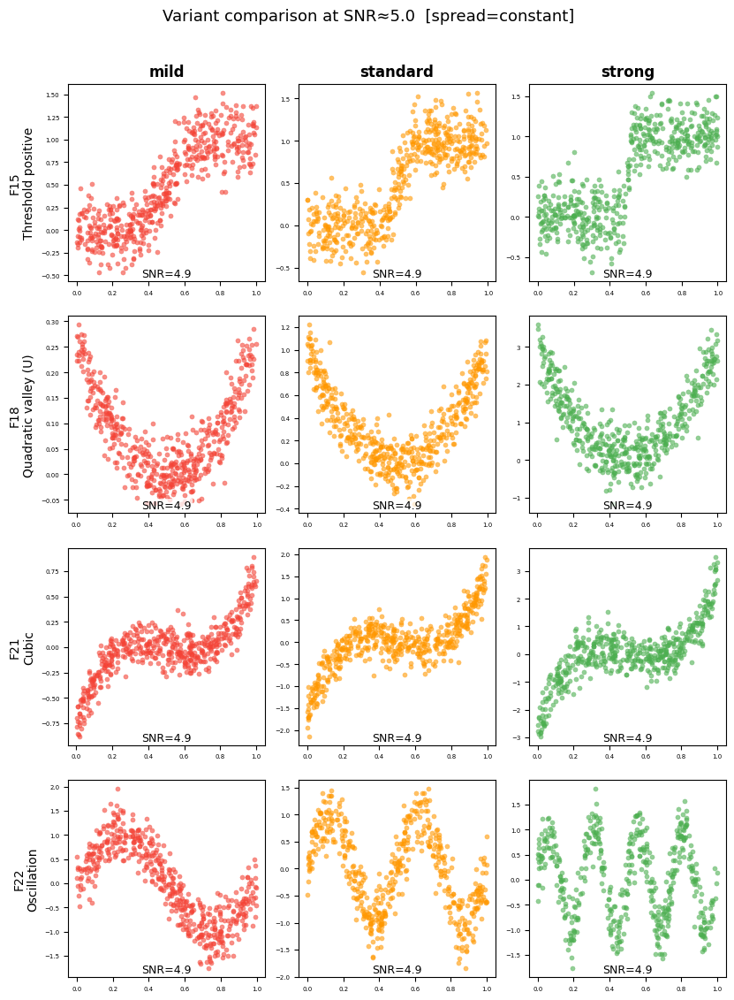

In [1437]:
# # ── Compare variants: mild vs standard vs strong ──
# import matplotlib.pyplot as plt

# _variants = ['mild', 'standard', 'strong']
# _show_families = ['F15', 'F18', 'F21', 'F22']
# _target_snr = 5.0

# # Load full cases (all variants) and scatter points
# _cases_all = pd.read_csv(INPUT_DIR / CASES_FILE, low_memory=False)
# _cases_all['_pt_idx'] = pd.to_numeric(_cases_all['candidate_index'], errors='raise').astype(np.int64)
# # Keep only repeat 1
# _cases_all = _cases_all[_cases_all['repeat'] == 1]

# _variant_colors = {'mild': '#F44336', 'standard': '#FF9800', 'strong': '#4CAF50'}

# nrows = len(_show_families)
# ncols = len(_variants)
# cell_size = 2.8

# fig, axes = plt.subplots(nrows, ncols,
#                          figsize=(cell_size * ncols, cell_size * nrows),
#                          squeeze=False)

# for r, fid in enumerate(_show_families):
#     fname = FAMILY_CATALOGUE.get(fid, {}).get('name', fid)
#     for c, var in enumerate(_variants):
#         ax = axes[r, c]
#         ax.set_box_aspect(1)

#         fam_var = _cases_all[
#             (_cases_all['family_id'] == fid) &
#             (_cases_all['variant_level'] == var)
#         ].copy()

#         if len(fam_var) == 0:
#             ax.text(0.5, 0.5, 'No data', ha='center', va='center',
#                     transform=ax.transAxes, fontsize=10, color='#999')
#         else:
#             # Find case closest to target SNR
#             fam_var['_snr_dist'] = np.abs(np.log(fam_var['nominal_snr'].clip(1e-6) / _target_snr))
#             best_idx = fam_var['_snr_dist'].idxmin()
#             best = fam_var.loc[best_idx]
#             pt_idx = int(best['_pt_idx'])
#             actual_snr = best['nominal_snr']
#             color = _variant_colors[var]

#             ax.scatter(x_all[pt_idx], y_all[pt_idx], s=14, alpha=0.6,
#                        facecolors=color, edgecolors=color, linewidths=0.3)

#             snr_str = f'{actual_snr:.1f}' if np.isfinite(actual_snr) else '∞'
#             ax.text(0.5, 0.01, f'SNR={snr_str}', transform=ax.transAxes,
#                     ha='center', va='bottom', fontsize=9,
#                     bbox=dict(facecolor='white', alpha=0.75, edgecolor='none', pad=0.5))

#         ax.tick_params(labelsize=5)
#         if r == 0:
#             ax.set_title(var, fontsize=12, fontweight='bold')
#         if c == 0:
#             ax.set_ylabel(f'{fid}\n{fname}', fontsize=10)

# fig.suptitle(f'Variant comparison at SNR≈{_target_snr}  [spread={SPREAD_PATTERN}]',
#              fontsize=13, y=1.01)
# fig.tight_layout()
# plt.show()

=== F25/F26 with MIC in [0.6, 0.8] ===
Total cases: 120

── Gate 1 (MIC strength) ──


,family_id,family_name,gate1,count
0,F25,Multi-regime threshold,intermediate_global,69
1,F26,Windowed threshold,intermediate_global,51



── Gate 2 (Simple vs Complex) ──


,family_id,gate2,count
0,F25,Complex,69
1,F26,Complex,51



── Branch detection [intermediate_global] ──


,family_id,cond_dip_label,count
0,F25,Non-branch,69
1,F26,Non-branch,51



── SiZer TP [intermediate_global] ──


,family_id,sizer_label,count
0,F25,TP=2,69
1,F26,TP≥3,51



── Scatter plots ──


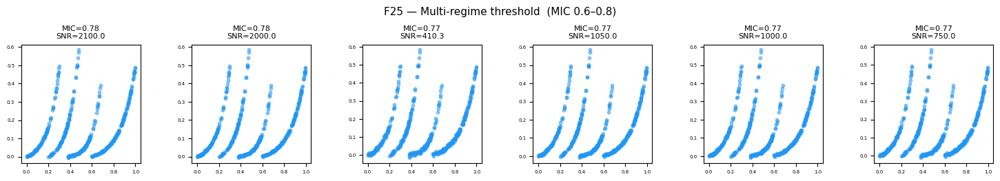

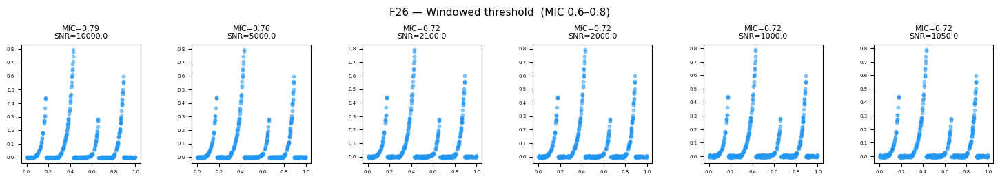

In [1438]:
# ── Trace F25/F26 classification path (MIC 0.6–0.8) ──
_trace_families = ['F25', 'F26']
_mic_lo, _mic_hi = 0.6, 0.8

_trace = data[
    (data['family_id'].isin(_trace_families)) &
    (data['MIC'] >= _mic_lo) & (data['MIC'] <= _mic_hi)
].copy()

print(f'=== F25/F26 with MIC in [{_mic_lo}, {_mic_hi}] ===')
print(f'Total cases: {len(_trace)}\n')

if len(_trace) > 0:
    # Gate 1
    print('── Gate 1 (MIC strength) ──')
    display(_trace.groupby(['family_id', 'family_name', 'gate1']).size().reset_index(name='count'))

    # Gate 2
    if 'enters_complex' in _trace.columns:
        print('\n── Gate 2 (Simple vs Complex) ──')
        _trace['gate2'] = np.where(_trace['enters_complex'], 'Complex', 'Simple')
        display(_trace.groupby(['family_id', 'gate2']).size().reset_index(name='count'))

    # Branch detection
    for _gate in MIC_ANALYSIS_GATES:
        _cdd = cond_dip_dfs.get(_gate)
        if _cdd is None:
            continue
        _cdd_trace = _cdd[_cdd['case_id'].isin(_trace['case_id'])]
        if len(_cdd_trace) > 0:
            print(f'\n── Branch detection [{_gate}] ──')
            _cdd_trace_lab = _cdd_trace[['case_id', 'cond_dip_label']].merge(
                _trace[['case_id', 'family_id']], on='case_id', how='left')
            display(_cdd_trace_lab.groupby(['family_id', 'cond_dip_label']).size().reset_index(name='count'))

    # SiZer TP
    for _gate in MIC_ANALYSIS_GATES:
        _sd = sizer_dfs.get(_gate)
        if _sd is None:
            continue
        _sd_trace = _sd[_sd['case_id'].isin(_trace['case_id'])]
        if len(_sd_trace) > 0:
            print(f'\n── SiZer TP [{_gate}] ──')
            _sd_trace_lab = _sd_trace[['case_id', 'sizer_label']].merge(
                _trace[['case_id', 'family_id']], on='case_id', how='left')
            display(_sd_trace_lab.groupby(['family_id', 'sizer_label']).size().reset_index(name='count'))

    # KL/QR/HD
    for _gate in MIC_ANALYSIS_GATES:
        _hd = klqrhd_dfs.get(_gate)
        if _hd is None:
            continue
        _hd_trace = _hd[_hd['case_id'].isin(_trace['case_id'])]
        if len(_hd_trace) > 0:
            print(f'\n── HD classification [{_gate}] ──')
            _hd_trace_lab = _hd_trace[['case_id', 'klqrhd_label']].merge(
                _trace[['case_id', 'family_id']], on='case_id', how='left')
            display(_hd_trace_lab.groupby(['family_id', 'klqrhd_label']).size().reset_index(name='count'))

    # Show scatter for these cases
    print(f'\n── Scatter plots ──')
    _trace_sorted = _trace.sort_values('MIC', ascending=False)
    for fid in _trace_families:
        _ft = _trace_sorted[_trace_sorted['family_id'] == fid]
        if len(_ft) == 0:
            continue
        n_show = min(6, len(_ft))
        fig, axes = plt.subplots(1, n_show, figsize=(2.5 * n_show, 2.5), squeeze=False)
        fname = _ft['family_name'].iloc[0]
        for j in range(n_show):
            ax = axes[0, j]
            ax.set_box_aspect(1)
            row = _ft.iloc[j]
            pi = int(row['_pt_idx'])
            ax.scatter(x_all[pi], y_all[pi], s=10, alpha=0.5, color='#2196F3')
            mic_val = row['MIC']
            snr_val = row['nominal_snr']
            snr_str = f'{snr_val:.1f}' if np.isfinite(snr_val) else '∞'
            ax.set_title(f'MIC={mic_val:.2f}\nSNR={snr_str}', fontsize=8)
            ax.tick_params(labelsize=5)
        fig.suptitle(f'{fid} — {fname}  (MIC {_mic_lo}–{_mic_hi})', fontsize=11)
        fig.tight_layout()
        plt.show()
else:
    print('No cases found in this MIC range.')

### Scatter diagnostic — Step 2: SiZer turning-point classification

Cases classified by number of turning points (TP=0, TP=1, TP=2, TP≥3).


=== Scatter diagnostic: SiZer TP [strong_global] ===


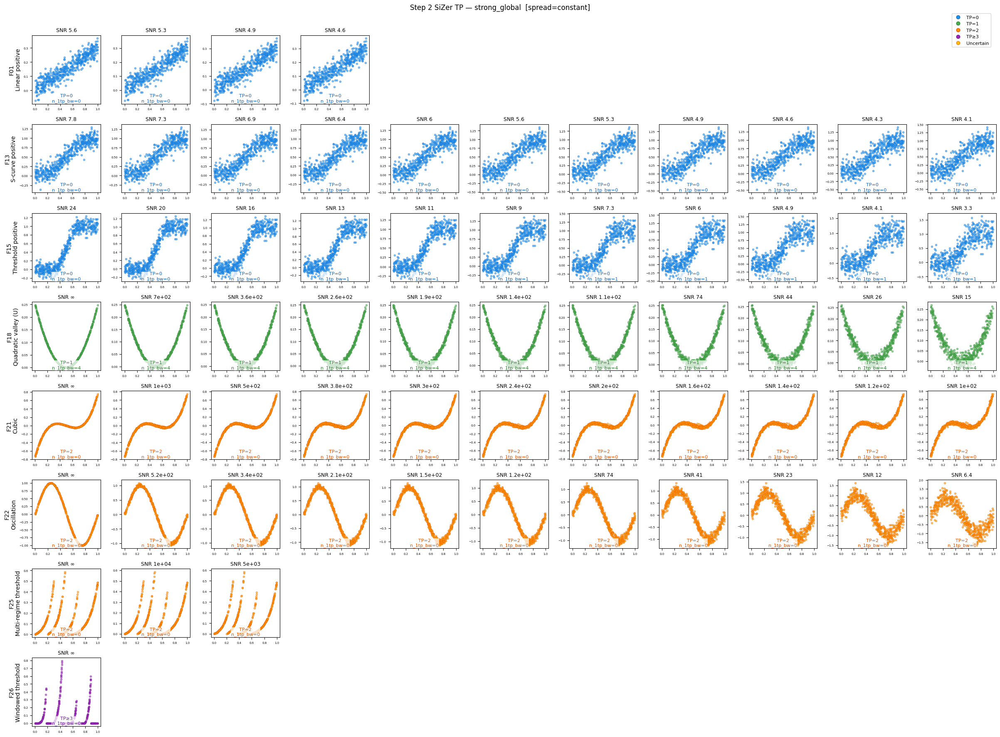


=== Scatter diagnostic: SiZer TP [intermediate_global] ===


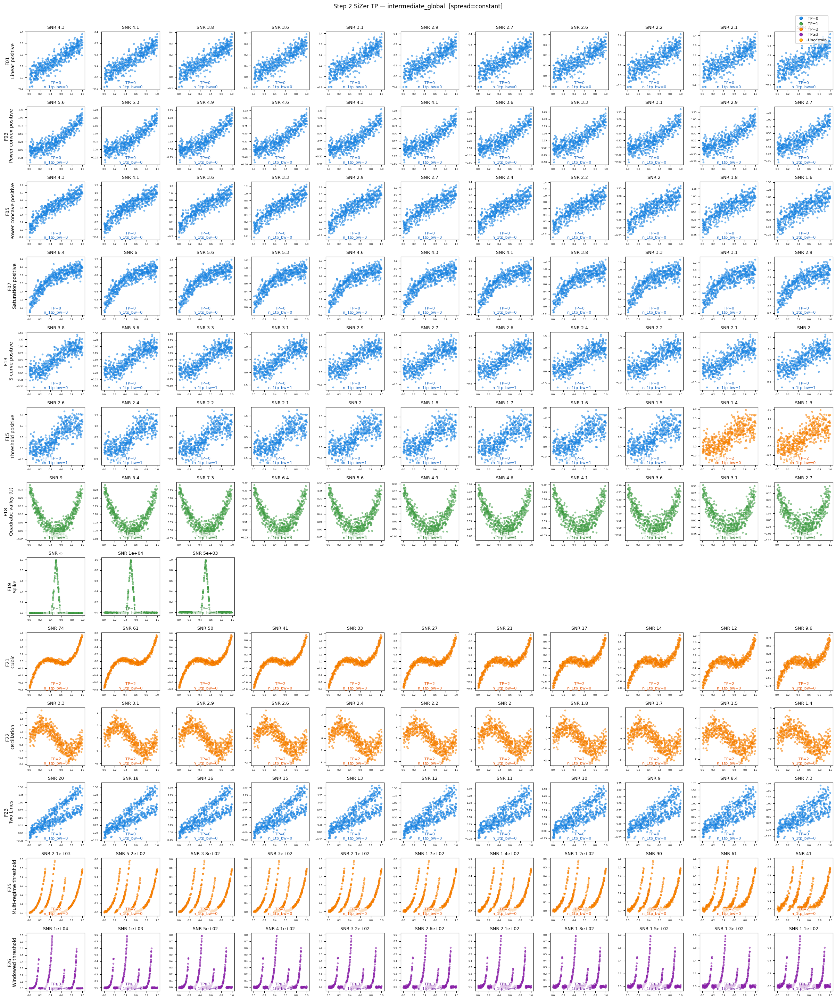

In [1439]:
if RUN_METHOD_A:
    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        if sizer_df is None or len(sizer_df) == 0:
            continue
        print(f'\n=== Scatter diagnostic: SiZer TP [{_gate}] ===')
        diag_scatter_from_sub(sizer_df, 'sizer_label',
                              f'Step 2 SiZer TP — {_gate}',
                              metric_col='n_1tp_bw', metric_fmt='.0f')

In [1440]:
# if RUN_METHOD_A:
#     for _gate in MIC_ANALYSIS_GATES:
#         sizer_df = sizer_dfs.get(_gate)
#         if sizer_df is None or len(sizer_df) == 0:
#             continue

#         tp0_df = sizer_df[sizer_df['sizer_label'] == 'TP=0'].copy()
#         n_tp0 = len(tp0_df)
#         print(f'\n{"="*60}')
#         print(f'=== Width Ratio within TP=0 [{_gate}] ({n_tp0} cases) ===')
#         print(f'{"="*60}')
#         print('Goal: separate S-curve (wide derivative) from Threshold (narrow derivative)\n')

#         if n_tp0 > 0:
#             tp0_wr_summary = tp0_df.groupby(['family_id', 'family_name']).agg(
#                 n=('case_id', 'size'),
#                 wr_fine_mean=('width_ratio_fine', 'mean'),
#                 wr_fine_std=('width_ratio_fine', 'std'),
#                 wr_fine_min=('width_ratio_fine', 'min'),
#                 wr_fine_max=('width_ratio_fine', 'max'),
#                 wr_mean_mean=('width_ratio_mean', 'mean'),
#             ).round(3)
#             display(tp0_wr_summary)

#             families_tp0 = sorted(tp0_df['family_id'].unique())
#             n_fam = len(families_tp0)
#             if n_fam > 0:
#                 fig, axes = plt.subplots(1, n_fam, figsize=(3.5*n_fam, 3), sharey=True)
#                 if n_fam == 1:
#                     axes = [axes]
#                 for ax, fid in zip(axes, families_tp0):
#                     subset = tp0_df[tp0_df['family_id'] == fid]
#                     fname = subset['family_name'].iloc[0] if len(subset) > 0 else fid
#                     ax.hist(subset['width_ratio_fine'].dropna(), bins=20, range=(0, 1),
#                             alpha=0.7, edgecolor='black')
#                     ax.set_title(f'{fid}\n{fname}', fontsize=9)
#                     ax.set_xlabel('width_ratio (fine)')
#                     ax.axvline(WIDTH_RATIO_THRESHOLD, color='red', ls='--', alpha=0.7,
#                                label=f'threshold={WIDTH_RATIO_THRESHOLD}')
#                     ax.legend(fontsize=7)
#                 fig.suptitle(f'Width Ratio within TP=0 [{_gate}]', y=1.02)
#                 plt.tight_layout()
#                 plt.show()
#         else:
#             print('No TP=0 cases found.')

In [1441]:
if RUN_METHOD_A:
    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        if sizer_df is None or len(sizer_df) == 0:
            continue

        tp0_mask = sizer_df['sizer_label'] == 'TP=0'
        n_tp0 = tp0_mask.sum()
        tp0_families = sizer_df.loc[tp0_mask, 'family_id'].unique()

        print(f'\n{"="*60}')
        print(f'=== Width-ratio sub-classification [{_gate}] ===')
        print(f'{"="*60}')
        print(f'TP=0 cases: {n_tp0} across {len(tp0_families)} families')

        if USE_WIDTH_RATIO_SUBCLASS and n_tp0 > 0:
            narrow_mask = tp0_mask & (sizer_df['width_ratio_fine'] < WIDTH_RATIO_THRESHOLD)
            n_narrow = narrow_mask.sum()
            n_wide = n_tp0 - n_narrow
            print(f'Width-ratio sub-classification ON (threshold = {WIDTH_RATIO_THRESHOLD})')
            print(f'  wide (wr >= {WIDTH_RATIO_THRESHOLD}): {n_wide} -> keep TP=0')
            print(f'  narrow (wr < {WIDTH_RATIO_THRESHOLD}): {n_narrow} -> relabel Threshold\n')

            sizer_df.loc[narrow_mask, 'sizer_label'] = 'Threshold'
            sizer_dfs[_gate] = sizer_df

            _tp0_df = sizer_df[sizer_df['family_id'].isin(tp0_families)].copy()
            _sub = _tp0_df.groupby(['family_id', 'sizer_label']).size().unstack(fill_value=0)
            _sub['total'] = _sub.sum(axis=1)
            _col_order = ['TP=0', 'Threshold', 'TP=1', 'TP≥3', 'Uncertain']
            _sub_display = [c for c in _col_order if c in _sub.columns]

            _sub_out = pd.DataFrame(index=_sub.index)
            _sub_out['family_name'] = _sub_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
            _sub_out['Expected'] = _sub_out.index.map(lambda f: EXPECTED_TP_LABEL.get(f, 'N/A'))
            _sub_out['Total'] = [count_percent(n, n) for n in _sub['total']]
            for col in _sub_display:
                _sub_out[col] = [count_percent(int(n), int(t)) for n, t in zip(_sub[col], _sub['total'])]

            accuracy = []
            for fid in _sub_out.index:
                exp = EXPECTED_TP_LABEL.get(fid)
                total = int(_sub.loc[fid, 'total'])
                if exp is None:
                    accuracy.append('N/A')
                elif exp in _sub.columns:
                    n_correct = int(_sub.loc[fid, exp])
                    accuracy.append(f'{n_correct}/{total} ({n_correct/total:.1%})')
                else:
                    accuracy.append(f'0/{total} (0.0%)')
            _sub_out['Accuracy'] = accuracy

            print(f'TP=0 sub-classification (wr_fine < {WIDTH_RATIO_THRESHOLD} -> Threshold):')
            print(f'Only showing families that had TP=0 cases\n')
            display(_sub_out)
        else:
            print('Width-ratio sub-classification OFF or no TP=0 cases')


=== Width-ratio sub-classification [strong_global] ===
TP=0 cases: 49 across 3 families
Width-ratio sub-classification OFF or no TP=0 cases

=== Width-ratio sub-classification [intermediate_global] ===
TP=0 cases: 96 across 7 families
Width-ratio sub-classification OFF or no TP=0 cases


## Step 3 — Transition Detection (HD test, TP=0 non-branch cases)

For TP=0 non-branch cases, use Hartigan's dip test on the **marginal Y distribution** to distinguish:
- **Transition** (HD significant): Y clusters into distinct levels → S-curve / Threshold type
- **Monotonic** (HD not significant): smooth monotonic relationship → Saturation / Acceleration that R² failed in Simple path

KL and QR are computed as diagnostics but not used for classification at this stage.

In [1442]:
if RUN_METHOD_B:
    from scipy.stats import gaussian_kde
    from diptest import diptest as diptest_func

    def _conditional_density_kde(x, y, n_grid_x=30, n_grid_y=50):
        gx = np.linspace(x.min(), x.max(), n_grid_x)
        gy = np.linspace(y.min(), y.max(), n_grid_y)
        GX, GY = np.meshgrid(gx, gy, indexing='ij')
        grid_pts = np.vstack([GX.ravel(), GY.ravel()])
        try:
            kde2d = gaussian_kde(np.vstack([x, y]), bw_method='silverman')
            density_2d = kde2d(grid_pts).reshape(n_grid_x, n_grid_y)
        except np.linalg.LinAlgError:
            return None
        kde_x = gaussian_kde(x, bw_method='silverman')
        p_x = kde_x(gx)
        p_x = p_x / p_x.sum()
        p_cond = np.zeros_like(density_2d)
        for ix in range(n_grid_x):
            col_sum = density_2d[ix].sum()
            if col_sum > 1e-20:
                p_cond[ix] = density_2d[ix] / col_sum
            else:
                p_cond[ix] = 1.0 / n_grid_y
        kde_y = gaussian_kde(y, bw_method='silverman')
        p_marginal_y = kde_y(gy)
        p_marginal_y = p_marginal_y / p_marginal_y.sum()
        return gx, gy, p_cond, p_marginal_y, p_x

    def _conditional_density_hist(x, y, n_grid_x=30, n_grid_y=50):
        hist2d, xedges, yedges = np.histogram2d(x, y, bins=[n_grid_x, n_grid_y])
        gx = 0.5 * (xedges[:-1] + xedges[1:])
        gy = 0.5 * (yedges[:-1] + yedges[1:])
        hist2d = hist2d + 1e-10
        p_x = hist2d.sum(axis=1)
        p_x = p_x / p_x.sum()
        p_cond = hist2d / hist2d.sum(axis=1, keepdims=True)
        p_marginal_y = hist2d.sum(axis=0)
        p_marginal_y = p_marginal_y / p_marginal_y.sum()
        return gx, gy, p_cond, p_marginal_y, p_x

    def _conditional_density(x, y, n_grid_x=30, n_grid_y=50):
        if KL_METHOD == 'kde':
            return _conditional_density_kde(x, y, n_grid_x, n_grid_y)
        else:
            return _conditional_density_hist(x, y, n_grid_x, n_grid_y)

    def _kl_from_cond(p_cond, p_marginal_y, p_x):
        kl = 0.0
        for ix in range(p_cond.shape[0]):
            pc = np.maximum(p_cond[ix], 1e-20)
            pm = np.maximum(p_marginal_y, 1e-20)
            kl += p_x[ix] * np.sum(pc * np.log(pc / pm))
        return float(kl)

    def _qr_from_cond(p_cond, gy):
        iqrs = []
        for ix in range(p_cond.shape[0]):
            cdf = np.cumsum(p_cond[ix])
            cdf = cdf / cdf[-1] if cdf[-1] > 0 else cdf
            q05 = gy[np.searchsorted(cdf, 0.05)]
            q95 = gy[np.searchsorted(cdf, 0.95, side='right').clip(max=len(gy)-1)]
            iqrs.append(q95 - q05)
        iqrs = np.array(iqrs)
        q01_iqr = np.percentile(iqrs, 1)
        q99_iqr = np.percentile(iqrs, 99)
        if q01_iqr < 1e-10:
            return np.nan
        return float(q99_iqr / q01_iqr)

    def klqr_test(x, y, n_perm=99):
        valid = np.isfinite(x) & np.isfinite(y)
        x, y = x[valid], y[valid]
        if len(x) < 20:
            return np.nan, np.nan, np.nan, np.nan
        result = _conditional_density(x, y)
        if result is None:
            return np.nan, np.nan, np.nan, np.nan
        gx, gy, p_cond, p_marginal_y, p_x = result
        kl_obs = _kl_from_cond(p_cond, p_marginal_y, p_x)
        qr_obs = _qr_from_cond(p_cond, gy)
        kl_count = 0
        qr_count = 0
        rng = np.random.RandomState(42)
        for _ in range(n_perm):
            y_perm = rng.permutation(y)
            res_perm = _conditional_density(x, y_perm)
            if res_perm is None:
                continue
            _, gy_p, pc_p, pm_p, px_p = res_perm
            kl_perm = _kl_from_cond(pc_p, pm_p, px_p)
            if kl_perm >= kl_obs:
                kl_count += 1
            qr_perm = _qr_from_cond(pc_p, gy_p)
            if not np.isnan(qr_perm) and not np.isnan(qr_obs) and qr_perm >= qr_obs:
                qr_count += 1
        kl_p = float((kl_count + 1) / (n_perm + 1))
        qr_p = float((qr_count + 1) / (n_perm + 1)) if not np.isnan(qr_obs) else np.nan
        return kl_obs, kl_p, qr_obs, qr_p

    def hd_test(y):
        valid = np.isfinite(y)
        y = y[valid]
        if len(y) < 20:
            return np.nan, np.nan
        dip, pval = diptest_func(y)
        return float(dip), float(pval)

    print(f'KL/QR/HD helpers defined.  KL_METHOD={KL_METHOD!r}, n_perm=99 (KL+QR shared)')

KL/QR/HD helpers defined.  KL_METHOD='histogram', n_perm=99 (KL+QR shared)



=== HD (Step 3) [strong_global] — 49 TP=0 non-branch cases (KL_METHOD='histogram') ===


KL/QR/HD [strong_global]: 100%|██████████| 49/49 [00:03<00:00, 15.78it/s]

KL/QR/HD: 49 cases in 3.1s

=== Significance rates per family [strong_global] ===


,,n,KL_sig,QR_sig,HD_sig
family_id,family_name,,,,
F01,Linear positive,4,4 (100.0%),4 (100.0%),0 (0.0%)
F13,S-curve positive,11,11 (100.0%),11 (100.0%),10 (90.9%)
F15,Threshold positive,34,34 (100.0%),34 (100.0%),28 (82.4%)


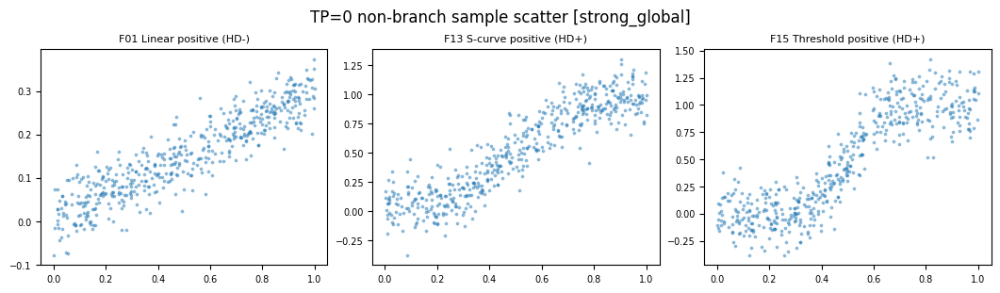


=== HD (Step 3) [intermediate_global] — 96 TP=0 non-branch cases (KL_METHOD='histogram') ===


KL/QR/HD [intermediate_global]: 100%|██████████| 96/96 [00:06<00:00, 15.26it/s]

KL/QR/HD: 96 cases in 6.3s

=== Significance rates per family [intermediate_global] ===


,,n,KL_sig,QR_sig,HD_sig
family_id,family_name,,,,
F01,Linear positive,14,14 (100.0%),14 (100.0%),0 (0.0%)
F03,Power convex positive,13,13 (100.0%),4 (30.8%),0 (0.0%)
F05,Power concave positive,17,17 (100.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,14,14 (100.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,12,12 (100.0%),9 (75.0%),1 (8.3%)
F15,Threshold positive,9,9 (100.0%),3 (33.3%),0 (0.0%)
F23,Two Lines,17,17 (100.0%),14 (82.4%),0 (0.0%)


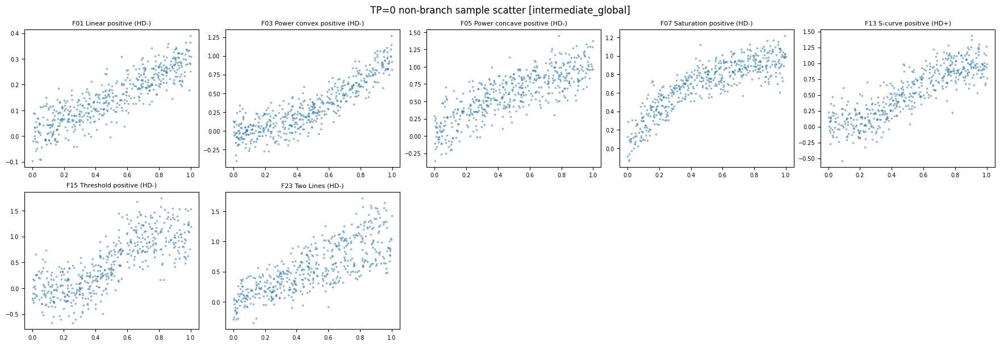

In [1443]:
if RUN_METHOD_B:
    klqrhd_dfs = {}
    np.random.seed(42)

    for _gate in MIC_ANALYSIS_GATES:
        # Filter to TP=0 non-branch cases from SiZer classification
        _sdf = sizer_dfs.get(_gate)
        if _sdf is None or len(_sdf) == 0:
            print(f'[{_gate}] No SiZer results, skipping Step 3.')
            continue
        _tp0_ids = set(_sdf[_sdf['sizer_label'] == 'TP=0']['case_id'])
        _nb = non_branch_datas.get(_gate)
        if _nb is None:
            continue
        complex_data = _nb[_nb['case_id'].isin(_tp0_ids)].copy()
        if len(complex_data) == 0:
            print(f'[{_gate}] No TP=0 non-branch cases, skipping Step 3.')
            continue

        print(f'\n{"="*60}')
        print(f'=== HD (Step 3) [{_gate}] — {len(complex_data):,} TP=0 non-branch cases (KL_METHOD={KL_METHOD!r}) ===')
        print(f'{"="*60}')

        klqrhd_results = []
        t0 = time.time()

        for idx, row in tqdm(complex_data.iterrows(), total=len(complex_data), desc=f'KL/QR/HD [{_gate}]'):
            pi = int(row['_pt_idx'])
            x = x_all[pi].astype(np.float64)
            y = y_all[pi].astype(np.float64)

            kl_stat, kl_p, qr_stat, qr_p = klqr_test(x, y)
            hd_stat, hd_p = hd_test(y)

            klqrhd_results.append({
                'case_id': row['case_id'],
                'family_id': row['family_id'],
                'kl_stat': kl_stat, 'kl_p': kl_p, 'kl_sig': kl_p < 0.05 if not np.isnan(kl_p) else np.nan,
                'qr_stat': qr_stat, 'qr_p': qr_p, 'qr_sig': qr_p < 0.05 if not np.isnan(qr_p) else np.nan,
                'hd_stat': hd_stat, 'hd_p': hd_p, 'hd_sig': hd_p < 0.05 if not np.isnan(hd_p) else np.nan,
            })

        print(f'KL/QR/HD: {len(klqrhd_results):,} cases in {time.time()-t0:.1f}s')

        klqrhd_df = pd.DataFrame(klqrhd_results)
        klqrhd_df['family_name'] = klqrhd_df['family_id'].map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        klqrhd_dfs[_gate] = klqrhd_df

        print(f'\n=== Significance rates per family [{_gate}] ===')
        _sig = klqrhd_df.groupby(['family_id', 'family_name']).agg(
            n=('case_id', 'size'),
            KL_sig=('kl_sig', lambda s: count_percent(int(s.sum()), len(s))),
            QR_sig=('qr_sig', lambda s: count_percent(int(s.sum()), len(s))),
            HD_sig=('hd_sig', lambda s: count_percent(int(s.sum()), len(s))),
        )
        display(_sig)

        # ── Scatter plots: 1 sample per family (prefer HD-significant) ──
        import matplotlib.pyplot as plt
        _fam_ids = sorted(klqrhd_df['family_id'].unique())
        n_fam = len(_fam_ids)
        if n_fam > 0:
            ncols = min(n_fam, 5)
            nrows = math.ceil(n_fam / ncols)
            fig, axes = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3*nrows), constrained_layout=True)
            axes = np.array(axes).flatten() if n_fam > 1 else [axes]
            for ax, _pfid in zip(axes, _fam_ids):
                _pf_df = klqrhd_df[klqrhd_df['family_id'] == _pfid]
                _pf_sig = _pf_df[_pf_df['hd_sig'] == True]
                if len(_pf_sig) > 0:
                    _pick = _pf_sig.sample(n=1, random_state=42).iloc[0]
                    _tag = 'HD+'
                else:
                    _pick = _pf_df.sample(n=1, random_state=42).iloc[0]
                    _tag = 'HD-'
                _pi = int(complex_data.loc[complex_data['case_id'] == _pick['case_id'], '_pt_idx'].iloc[0])
                _x = x_all[_pi].astype(np.float64)
                _y = y_all[_pi].astype(np.float64)
                _fname = FAMILY_CATALOGUE.get(_pfid, {}).get('name', '')
                ax.scatter(_x, _y, s=3, alpha=0.4)
                ax.set_title(f'{_pfid} {_fname} ({_tag})', fontsize=8)
                ax.tick_params(labelsize=7)
            for ax in axes[n_fam:]:
                ax.set_visible(False)
            fig.suptitle(f'TP=0 non-branch sample scatter [{_gate}]', fontsize=12)
            plt.show()


=== KL/QR/HD stat distributions [strong_global] ===


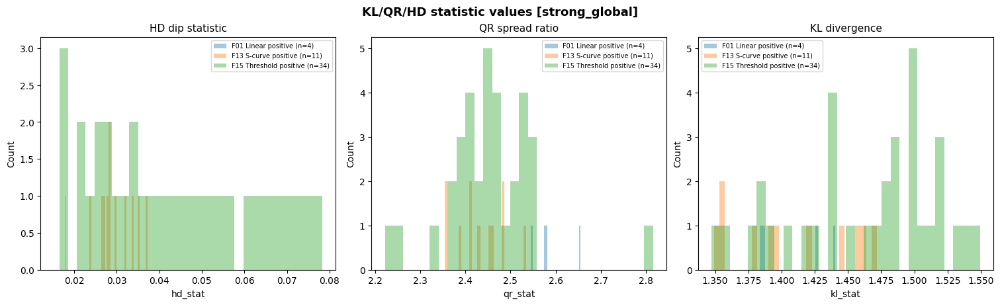


=== HD dip statistic per family [strong_global] ===


,family_name,count,mean,std,min,10%,25%,50%,75%,90%,max
family_id,,,,,,,,,,,
F01,Linear positive,4.0,0.0167,0.0013,0.0153,0.0155,0.0158,0.0168,0.0177,0.0179,0.0180
F13,S-curve positive,11.0,0.0300,0.0041,0.0236,0.0267,0.0274,0.0286,0.0329,0.0352,0.0372
F15,Threshold positive,34.0,0.0437,0.0189,0.0165,0.0216,0.0272,0.0412,0.0594,0.0706,0.0783



=== QR spread ratio per family [strong_global] ===


,family_name,count,mean,std,min,10%,25%,50%,75%,90%,max
family_id,,,,,,,,,,,
F01,Linear positive,4.0,2.5887,0.0467,2.5455,2.5543,2.5676,2.5771,2.5982,2.6323,2.6550
F13,S-curve positive,11.0,2.4332,0.0563,2.3550,2.3550,2.3997,2.4273,2.4708,2.4830,2.5350
F15,Threshold positive,34.0,2.4554,0.0998,2.2222,2.3641,2.4122,2.4545,2.5000,2.5391,2.8157



=== KL/QR/HD stat distributions [intermediate_global] ===


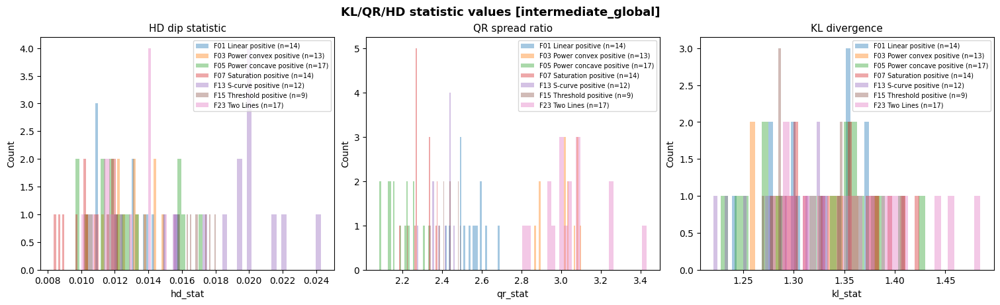


=== HD dip statistic per family [intermediate_global] ===


,family_name,count,mean,std,min,10%,25%,50%,75%,90%,max
family_id,,,,,,,,,,,
F01,Linear positive,14.0,0.0131,0.0017,0.0108,0.0109,0.0117,0.0131,0.0142,0.0154,0.0159
F03,Power convex positive,13.0,0.0129,0.0014,0.0103,0.0114,0.0122,0.0132,0.0139,0.0144,0.0150
F05,Power concave positive,17.0,0.0126,0.0023,0.0097,0.0101,0.0112,0.0120,0.0134,0.0160,0.0172
F07,Saturation positive,14.0,0.0106,0.0013,0.0084,0.0088,0.0098,0.0106,0.0119,0.0120,0.0122
F13,S-curve positive,12.0,0.0198,0.0022,0.0155,0.0174,0.0192,0.0200,0.0204,0.0220,0.0243
F15,Threshold positive,9.0,0.0168,0.0008,0.0157,0.0158,0.0163,0.0169,0.0174,0.0177,0.0180
F23,Two Lines,17.0,0.0126,0.0017,0.0100,0.0106,0.0115,0.0120,0.0141,0.0145,0.0157



=== QR spread ratio per family [intermediate_global] ===


,family_name,count,mean,std,min,10%,25%,50%,75%,90%,max
family_id,,,,,,,,,,,
F01,Linear positive,14.0,2.5413,0.0740,2.4149,2.4562,2.4895,2.5478,2.5888,2.6132,2.6900
F03,Power convex positive,13.0,3.0146,0.0807,2.8641,2.8925,3.0170,3.0321,3.0844,3.0844,3.1008
F05,Power concave positive,17.0,2.1913,0.0745,2.0833,2.1088,2.1380,2.1887,2.2352,2.2780,2.3369
F07,Saturation positive,14.0,2.2969,0.0592,2.1818,2.2362,2.2710,2.2727,2.3363,2.3756,2.3776
F13,S-curve positive,12.0,2.3917,0.0562,2.2717,2.3521,2.3543,2.3984,2.4384,2.4400,2.4622
F15,Threshold positive,9.0,2.4300,0.0508,2.3364,2.3770,2.4079,2.4392,2.4793,2.4822,2.4938
F23,Two Lines,17.0,3.0456,0.1550,2.8036,2.8972,2.9563,3.0130,3.0904,3.2569,3.4282


In [1444]:
if RUN_METHOD_B:
    import matplotlib.pyplot as plt

    for _gate in MIC_ANALYSIS_GATES:
        klqrhd_df = klqrhd_dfs.get(_gate)
        if klqrhd_df is None or len(klqrhd_df) == 0:
            continue

        print(f'\n{"="*60}')
        print(f'=== KL/QR/HD stat distributions [{_gate}] ===')
        print(f'{"="*60}')

        fig, axes = plt.subplots(1, 3, figsize=(15, 4.5), constrained_layout=True)
        stat_cols = [
            ('hd_stat', 'HD dip statistic'),
            ('qr_stat', 'QR spread ratio'),
            ('kl_stat', 'KL divergence'),
        ]
        for ax, (col, title) in zip(axes, stat_cols):
            for fid in sorted(klqrhd_df['family_id'].unique()):
                vals = klqrhd_df.loc[klqrhd_df['family_id'] == fid, col].dropna()
                if len(vals) == 0:
                    continue
                fname = FAMILY_CATALOGUE.get(fid, {}).get('name', fid)
                ax.hist(vals, bins=30, alpha=0.4, label=f'{fid} {fname} (n={len(vals)})')
            ax.set_title(title, fontsize=11)
            ax.set_xlabel(col)
            ax.set_ylabel('Count')
            ax.legend(fontsize=7)
        fig.suptitle(f'KL/QR/HD statistic values [{_gate}]', fontsize=13, fontweight='bold')
        plt.show()

        print(f'\n=== HD dip statistic per family [{_gate}] ===')
        _hd_summary = klqrhd_df.groupby('family_id')['hd_stat'].describe(percentiles=[.1,.25,.5,.75,.9]).round(4)
        _hd_summary.insert(0, 'family_name', _hd_summary.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', '')))
        display(_hd_summary)

        print(f'\n=== QR spread ratio per family [{_gate}] ===')
        _qr_summary = klqrhd_df.groupby('family_id')['qr_stat'].describe(percentiles=[.1,.25,.5,.75,.9]).round(4)
        _qr_summary.insert(0, 'family_name', _qr_summary.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', '')))
        display(_qr_summary)

In [1445]:
if RUN_METHOD_B:

    def klqrhd_classify(row):
        if np.isnan(row.get('hd_sig', np.nan)):
            return 'failed'
        if row['hd_sig']:
            return 'Transition'
        return 'Monotonic'

    EXPECTED_KLQRHD = {}
    for fid, props in FAMILY_CATALOGUE.items():
        shape = props.get('special_shape', '')
        mono = props.get('monotonicity', '')
        lin = props.get('linearity', '')
        if shape in ('S-curve', 'threshold'):
            EXPECTED_KLQRHD[fid] = 'Transition'
        elif mono == 'monotonic' and lin != 'linear':
            EXPECTED_KLQRHD[fid] = 'Monotonic'
        else:
            EXPECTED_KLQRHD[fid] = None

    for _gate in MIC_ANALYSIS_GATES:
        klqrhd_df = klqrhd_dfs.get(_gate)
        if klqrhd_df is None or len(klqrhd_df) == 0:
            continue

        klqrhd_df['klqrhd_label'] = klqrhd_df.apply(klqrhd_classify, axis=1)
        klqrhd_dfs[_gate] = klqrhd_df

        print(f'\n{"="*60}')
        print(f'=== Step 3: HD classification [{_gate}] ===')
        print(f'{"="*60}')
        print(f'Rule: HD significant \u2192 Transition | HD not significant \u2192 Monotonic\n')

        _kc = klqrhd_df.groupby(['family_id', 'klqrhd_label']).size().unstack(fill_value=0)
        _kc['total'] = _kc.sum(axis=1)
        _kc_out = pd.DataFrame(index=_kc.index)
        _kc_out['family_name'] = _kc_out.index.map(lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _kc_out['Total'] = [count_percent(n, n) for n in _kc['total']]
        for col in sorted(_kc.columns.drop('total')):
            _kc_out[col] = [count_percent(int(n), int(t)) for n, t in zip(_kc[col], _kc['total'])]
        _kc_out['Expected'] = _kc_out.index.map(lambda f: EXPECTED_KLQRHD.get(f, 'N/A'))

        accuracy = []
        for fid in _kc_out.index:
            exp = EXPECTED_KLQRHD.get(fid)
            total = int(_kc.loc[fid, 'total'])
            if exp is None or exp not in _kc.columns:
                accuracy.append('N/A')
            else:
                n_correct = int(_kc.loc[fid, exp])
                accuracy.append(f'{n_correct}/{total} ({n_correct/total:.1%})')
        _kc_out['Accuracy'] = accuracy
        display(_kc_out)

        _eval = klqrhd_df[klqrhd_df['family_id'].map(lambda f: EXPECTED_KLQRHD.get(f) is not None)].copy()
        if len(_eval) > 0:
            _eval['_expected'] = _eval['family_id'].map(EXPECTED_KLQRHD)
            _eval['_correct'] = _eval['klqrhd_label'] == _eval['_expected']
            n_t = len(_eval)
            n_c = int(_eval['_correct'].sum())
            print(f'\nOverall accuracy (TP=0 with expected): {n_c}/{n_t} ({n_c/n_t:.1%})')


=== Step 3: HD classification [strong_global] ===
Rule: HD significant → Transition | HD not significant → Monotonic



,family_name,Total,Monotonic,Transition,Expected,Accuracy
family_id,,,,,,
F01,Linear positive,4 (100.0%),4 (100.0%),0 (0.0%),None,N/A
F13,S-curve positive,11 (100.0%),1 (9.1%),10 (90.9%),Transition,10/11 (90.9%)
F15,Threshold positive,34 (100.0%),6 (17.6%),28 (82.4%),Transition,28/34 (82.4%)



Overall accuracy (TP=0 with expected): 38/45 (84.4%)

=== Step 3: HD classification [intermediate_global] ===
Rule: HD significant → Transition | HD not significant → Monotonic



,family_name,Total,Monotonic,Transition,Expected,Accuracy
family_id,,,,,,
F01,Linear positive,14 (100.0%),14 (100.0%),0 (0.0%),None,N/A
F03,Power convex positive,13 (100.0%),13 (100.0%),0 (0.0%),Monotonic,13/13 (100.0%)
F05,Power concave positive,17 (100.0%),17 (100.0%),0 (0.0%),Monotonic,17/17 (100.0%)
F07,Saturation positive,14 (100.0%),14 (100.0%),0 (0.0%),Monotonic,14/14 (100.0%)
F13,S-curve positive,12 (100.0%),11 (91.7%),1 (8.3%),Transition,1/12 (8.3%)
F15,Threshold positive,9 (100.0%),9 (100.0%),0 (0.0%),Transition,0/9 (0.0%)
F23,Two Lines,17 (100.0%),17 (100.0%),0 (0.0%),None,N/A



Overall accuracy (TP=0 with expected): 45/65 (69.2%)


### Scatter diagnostic — Step 3: HD classification

Cases classified as Transition vs Monotonic by the Hartigan dip test.


=== Scatter diagnostic: HD classification [strong_global] ===


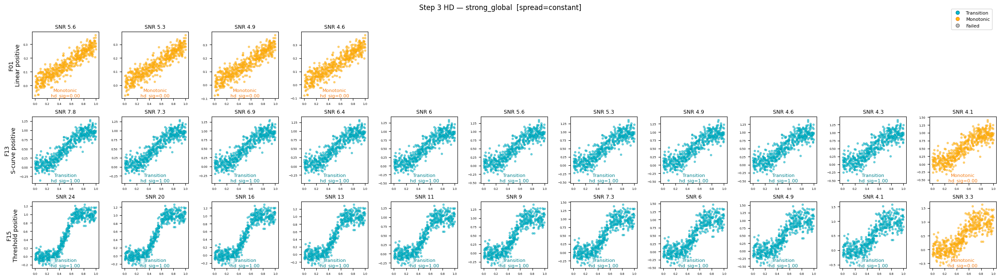


=== Scatter diagnostic: HD classification [intermediate_global] ===


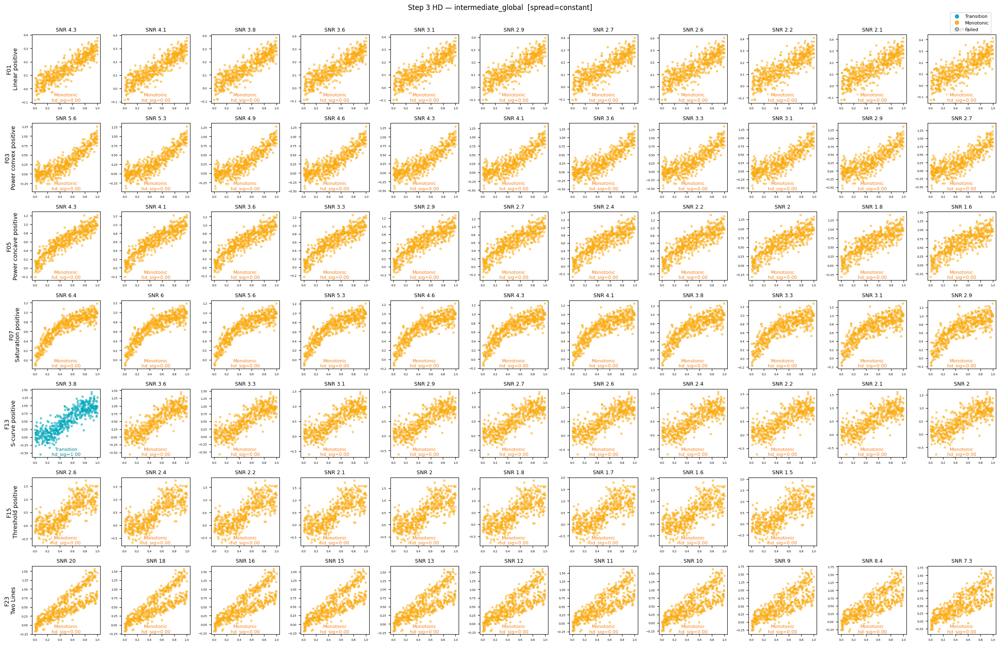

In [1446]:
if RUN_METHOD_B:
    for _gate in MIC_ANALYSIS_GATES:
        klqrhd_df = klqrhd_dfs.get(_gate)
        if klqrhd_df is None or len(klqrhd_df) == 0:
            continue
        print(f'\n=== Scatter diagnostic: HD classification [{_gate}] ===')
        diag_scatter_from_sub(klqrhd_df, 'klqrhd_label',
                              f'Step 3 HD — {_gate}',
                              metric_col='hd_sig')

## Method D — Periodicity Detection (Lomb-Scargle / Autocorrelation / Spectral Entropy)

Three independent methods to detect periodic/oscillatory structure in Y(X), compared side-by-side.
Runs on **all non-branch** complex cases. Results can be combined with SiZer TP count to sub-classify TP≥3.

In [1447]:
# RUN_METHOD_D = True

# if RUN_METHOD_D:
#     from scipy.signal import lombscargle
#     from scipy.stats import pearsonr

#     def _smooth_lowess(x, y, frac=0.15):
#         """Simple moving-average smoother (sorted by x)."""
#         order = np.argsort(x)
#         xs, ys = x[order], y[order]
#         n = len(xs)
#         hw = max(int(n * frac / 2), 3)
#         smoothed = np.full(n, np.nan)
#         for i in range(n):
#             lo, hi = max(0, i - hw), min(n, i + hw + 1)
#             smoothed[i] = np.mean(ys[lo:hi])
#         return xs, smoothed

#     # ── Method D1: Lomb-Scargle ──
#     def lombscargle_test(x, y, n_freq=500, smooth_frac=0.15):
#         """Lomb-Scargle periodogram on smoothed Y(X).
#         Returns: (max_power, p_value, dominant_period)
#         p-value approximation: Baluev (2008) false-alarm probability.
#         """
#         valid = np.isfinite(x) & np.isfinite(y)
#         x, y = x[valid], y[valid]
#         n = len(x)
#         if n < 30:
#             return np.nan, np.nan, np.nan

#         xs, ys = _smooth_lowess(x, y, frac=smooth_frac)
#         ys = ys - ys.mean()
#         x_range = xs[-1] - xs[0]
#         if x_range < 1e-10:
#             return np.nan, np.nan, np.nan

#         f_min = 1.0 / x_range
#         f_max = n / (2.0 * x_range)
#         freqs = np.linspace(f_min, f_max, n_freq)
#         angular_freqs = 2 * np.pi * freqs

#         power = lombscargle(xs, ys, angular_freqs, normalize=True)
#         max_idx = np.argmax(power)
#         max_power = power[max_idx]
#         dominant_freq = freqs[max_idx]
#         dominant_period = 1.0 / dominant_freq if dominant_freq > 0 else np.nan

#         # Baluev false-alarm probability approximation
#         M = len(freqs)
#         z = max_power
#         p_single = np.exp(-z)
#         p_value = 1.0 - (1.0 - p_single) ** M
#         p_value = min(max(p_value, 0.0), 1.0)

#         return float(max_power), float(p_value), float(dominant_period / x_range)

#     # ── Method D2: Autocorrelation ──
#     def autocorr_test(x, y, smooth_frac=0.15, n_grid=200):
#         """Autocorrelation of smoothed Y on uniform grid.
#         Returns: (has_secondary_peak, peak_lag_frac, peak_acf_value)
#         """
#         valid = np.isfinite(x) & np.isfinite(y)
#         x, y = x[valid], y[valid]
#         n = len(x)
#         if n < 30:
#             return False, np.nan, np.nan

#         xs, ys = _smooth_lowess(x, y, frac=smooth_frac)
#         x_grid = np.linspace(xs[0], xs[-1], n_grid)
#         y_grid = np.interp(x_grid, xs, ys)
#         y_grid = y_grid - y_grid.mean()

#         # Full autocorrelation
#         acf = np.correlate(y_grid, y_grid, mode='full')
#         acf = acf[len(y_grid)-1:]  # positive lags only
#         acf = acf / acf[0] if acf[0] > 0 else acf

#         # Find secondary peak (skip lag 0 and initial decay)
#         min_lag = n_grid // 8
#         max_lag = n_grid // 2
#         if max_lag <= min_lag:
#             return False, np.nan, np.nan

#         acf_search = acf[min_lag:max_lag]
#         if len(acf_search) == 0:
#             return False, np.nan, np.nan

#         peak_idx = np.argmax(acf_search)
#         peak_val = acf_search[peak_idx]
#         peak_lag = (min_lag + peak_idx) / n_grid

#         has_peak = peak_val > 0.3

#         return bool(has_peak), float(peak_lag), float(peak_val)

#     # ── Method D3: Spectral Entropy ──
#     def spectral_entropy_test(x, y, smooth_frac=0.15, n_grid=256):
#         """Spectral entropy of smoothed Y.
#         Low entropy = energy concentrated (periodic), high entropy = spread (non-periodic).
#         Returns: (entropy, normalized_entropy)
#         """
#         valid = np.isfinite(x) & np.isfinite(y)
#         x, y = x[valid], y[valid]
#         n = len(x)
#         if n < 30:
#             return np.nan, np.nan

#         xs, ys = _smooth_lowess(x, y, frac=smooth_frac)
#         x_grid = np.linspace(xs[0], xs[-1], n_grid)
#         y_grid = np.interp(x_grid, xs, ys)
#         y_grid = y_grid - y_grid.mean()

#         # FFT power spectrum
#         fft_vals = np.fft.rfft(y_grid)
#         psd = np.abs(fft_vals[1:]) ** 2  # skip DC
#         psd_norm = psd / psd.sum() if psd.sum() > 0 else psd

#         # Shannon entropy
#         psd_safe = psd_norm[psd_norm > 0]
#         entropy = -np.sum(psd_safe * np.log2(psd_safe))
#         max_entropy = np.log2(len(psd_norm)) if len(psd_norm) > 0 else 1.0
#         norm_entropy = entropy / max_entropy if max_entropy > 0 else np.nan

#         return float(entropy), float(norm_entropy)

#     print('Method D helpers defined (Lomb-Scargle, Autocorrelation, Spectral Entropy)')


In [1448]:
# if RUN_METHOD_D:
#     import time as _time
#     import matplotlib.pyplot as plt
#     periodicity_dfs = {}

#     for _gate in MIC_ANALYSIS_GATES:
#         complex_data = complex_datas.get(_gate)
#         if complex_data is None or len(complex_data) == 0:
#             print(f'[{_gate}] No complex cases, skipping Method D.')
#             continue

#         print(f'\n{"="*60}')
#         print(f'=== Periodicity Detection [{_gate}] — {len(complex_data):,} complex cases ===')
#         print(f'{"="*60}')

#         period_results = []
#         t0 = _time.time()

#         for idx, row in tqdm(complex_data.iterrows(), total=len(complex_data), desc=f'Periodicity [{_gate}]'):
#             pi = int(row['_pt_idx'])
#             x = x_all[pi].astype(np.float64)
#             y = y_all[pi].astype(np.float64)

#             ls_power, ls_p, ls_period = lombscargle_test(x, y)
#             ac_peak, ac_lag, ac_val = autocorr_test(x, y)
#             se_entropy, se_norm = spectral_entropy_test(x, y)

#             period_results.append({
#                 'case_id': row['case_id'],
#                 'family_id': row['family_id'],
#                 'ls_power': ls_power, 'ls_p': ls_p, 'ls_period': ls_period,
#                 'ls_sig': ls_p < 0.05 if not np.isnan(ls_p) else np.nan,
#                 'ac_peak': ac_peak, 'ac_lag': ac_lag, 'ac_val': ac_val,
#                 'se_entropy': se_entropy, 'se_norm': se_norm,
#             })

#         print(f'Periodicity: {len(period_results):,} cases in {_time.time()-t0:.1f}s')

#         period_df = pd.DataFrame(period_results)
#         period_df['family_name'] = period_df['family_id'].map(
#             lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
#         periodicity_dfs[_gate] = period_df

#         # ── Summary table: detection rates per family ──
#         print(f'\n=== Periodicity detection rates [{_gate}] ===')
#         _psig = period_df.groupby(['family_id', 'family_name']).agg(
#             n=('case_id', 'size'),
#             LS_sig=('ls_sig', lambda s: count_percent(int(s.sum()), len(s))),
#             AC_peak=('ac_peak', lambda s: count_percent(int(s.sum()), len(s))),
#             SE_mean=('se_norm', 'mean'),
#             SE_std=('se_norm', 'std'),
#         ).round(3)
#         display(_psig)

#         # ── Distribution plots: 3 panels per family ──
#         _fam_ids = sorted(period_df['family_id'].unique())
#         n_fam = len(_fam_ids)

#         if n_fam > 0:
#             # 1. Lomb-Scargle power distribution
#             fig, axes = plt.subplots(1, n_fam, figsize=(2.5*n_fam, 3), sharey=True)
#             if n_fam == 1: axes = [axes]
#             for ax, fid in zip(axes, _fam_ids):
#                 vals = period_df.loc[period_df['family_id'] == fid, 'ls_power'].dropna()
#                 fname = FAMILY_CATALOGUE.get(fid, {}).get('name', '')
#                 ax.hist(vals, bins=20, alpha=0.7, edgecolor='black')
#                 ax.set_title(f'{fid}\n{fname}', fontsize=8)
#                 ax.set_xlabel('LS power', fontsize=7)
#                 ax.tick_params(labelsize=7)
#             fig.suptitle(f'Lomb-Scargle max power [{_gate}]', fontsize=11)
#             plt.tight_layout()
#             plt.show()

#             # 2. Autocorrelation peak value distribution
#             fig, axes = plt.subplots(1, n_fam, figsize=(2.5*n_fam, 3), sharey=True)
#             if n_fam == 1: axes = [axes]
#             for ax, fid in zip(axes, _fam_ids):
#                 vals = period_df.loc[period_df['family_id'] == fid, 'ac_val'].dropna()
#                 fname = FAMILY_CATALOGUE.get(fid, {}).get('name', '')
#                 ax.hist(vals, bins=20, alpha=0.7, edgecolor='black')
#                 ax.axvline(0.3, color='red', ls='--', lw=1)
#                 ax.set_title(f'{fid}\n{fname}', fontsize=8)
#                 ax.set_xlabel('ACF peak', fontsize=7)
#                 ax.tick_params(labelsize=7)
#             fig.suptitle(f'Autocorrelation secondary peak [{_gate}]', fontsize=11)
#             plt.tight_layout()
#             plt.show()

#             # 3. Spectral entropy distribution
#             fig, axes = plt.subplots(1, n_fam, figsize=(2.5*n_fam, 3), sharey=True)
#             if n_fam == 1: axes = [axes]
#             for ax, fid in zip(axes, _fam_ids):
#                 vals = period_df.loc[period_df['family_id'] == fid, 'se_norm'].dropna()
#                 fname = FAMILY_CATALOGUE.get(fid, {}).get('name', '')
#                 ax.hist(vals, bins=20, alpha=0.7, edgecolor='black')
#                 ax.set_title(f'{fid}\n{fname}', fontsize=8)
#                 ax.set_xlabel('Norm. entropy', fontsize=7)
#                 ax.tick_params(labelsize=7)
#             fig.suptitle(f'Spectral entropy [{_gate}]', fontsize=11)
#             plt.tight_layout()
#             plt.show()

#             # 4. Scatter: 1 sample per family
#             ncols = min(n_fam, 5)
#             nrows = math.ceil(n_fam / ncols)
#             fig, axes = plt.subplots(nrows, ncols, figsize=(3.5*ncols, 3*nrows), constrained_layout=True)
#             axes = np.array(axes).flatten() if n_fam > 1 else [axes]
#             for ax, fid in zip(axes, _fam_ids):
#                 _pf = period_df[period_df['family_id'] == fid]
#                 _pick = _pf.sample(n=1, random_state=42).iloc[0]
#                 _cd = complex_datas[_gate]
#                 _pi = int(_cd.loc[_cd['case_id'] == _pick['case_id'], '_pt_idx'].iloc[0])
#                 _x = x_all[_pi].astype(np.float64)
#                 _y = y_all[_pi].astype(np.float64)
#                 fname = FAMILY_CATALOGUE.get(fid, {}).get('name', '')
#                 _ls = 'LS+' if _pick.get('ls_sig') else 'LS-'
#                 _ac = 'AC+' if _pick.get('ac_peak') else 'AC-'
#                 _se = f"SE={_pick.get('se_norm', 0):.2f}"
#                 ax.scatter(_x, _y, s=3, alpha=0.4)
#                 ax.set_title(f'{fid} {fname}\n{_ls} {_ac} {_se}', fontsize=7)
#                 ax.tick_params(labelsize=7)
#             for ax in axes[n_fam:]:
#                 ax.set_visible(False)
#             fig.suptitle(f'Complex-path samples [{_gate}]', fontsize=11)
#             plt.show()


## Full classification tree summary

Combined results from Step 1 (Branch detection) → Step 2 (SiZer TP) → Step 3 (HD on TP=0).

In [1449]:
if RUN_METHOD_A and RUN_METHOD_B:
    tree_dfs = {}

    for _gate in MIC_ANALYSIS_GATES:
        sizer_df = sizer_dfs.get(_gate)
        klqrhd_df = klqrhd_dfs.get(_gate)
        if sizer_df is None:
            continue

        print(f'\n{"="*60}')
        print(f'=== Full classification tree [{_gate}] ===')
        print(f'{"="*60}')

        # Build unified label per case
        tree_df = sizer_df[['case_id', 'family_id', 'family_name', 'sizer_label']].copy()

        # Add branch info from Method C
        if RUN_METHOD_C:
            _cdd = cond_dip_dfs.get(_gate)
            if _cdd is not None:
                _branch_ids = set(_cdd[_cdd['is_branch']]['case_id'])
                _branch_rows = _cdd[_cdd['is_branch']][['case_id', 'family_id']].copy()
                _branch_rows['family_name'] = _branch_rows['family_id'].map(
                    lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
                _branch_rows['sizer_label'] = 'N/A'
                _branch_rows['tree_label'] = 'Branch'
                tree_df = pd.concat([tree_df, _branch_rows], ignore_index=True)

        # Assign tree_label for non-branch cases
        tree_df.loc[tree_df.get('tree_label') != 'Branch', 'tree_label'] = tree_df['sizer_label']

        # TP=0 cases: use HD result if available
        if klqrhd_df is not None and len(klqrhd_df) > 0:
            _hd_map = klqrhd_df.set_index('case_id')['klqrhd_label']
            _tp0_mask = tree_df['tree_label'] == 'TP=0'
            tree_df.loc[_tp0_mask, 'tree_label'] = tree_df.loc[_tp0_mask, 'case_id'].map(_hd_map).fillna('TP=0')

        tree_dfs[_gate] = tree_df.copy()

        # Summary table
        _tree_ct = tree_df.groupby(['family_id', 'tree_label']).size().unstack(fill_value=0)
        _tree_ct['total'] = _tree_ct.sum(axis=1)
        _tree_out = pd.DataFrame(index=_tree_ct.index)
        _tree_out['family_name'] = _tree_out.index.map(
            lambda f: FAMILY_CATALOGUE.get(f, {}).get('name', ''))
        _tree_out['Total'] = [count_percent(n, n) for n in _tree_ct['total']]
        _label_order = ['Branch', 'Transition', 'Monotonic', 'TP=0', 'TP=1', 'TP=2', 'TP≥3', 'Uncertain', 'failed']
        for col in _label_order:
            if col in _tree_ct.columns:
                _tree_out[col] = [count_percent(int(n), int(t))
                                  for n, t in zip(_tree_ct[col], _tree_ct['total'])]
        display(_tree_out)

        print(f'\nTotal cases: {len(tree_df):,}')
        print(f'Label distribution:')
        for lbl, cnt in tree_df['tree_label'].value_counts().sort_index().items():
            print(f'  {lbl}: {cnt:,} ({cnt/len(tree_df):.1%})')

    # ══════════════════════════════════════════════════════════════════
    # Pipeline Summary per gate — Simple + Complex
    # ══════════════════════════════════════════════════════════════════
    _PW_TO_SIMPLE = {
        'positive_line': 'Linear', 'negative_line': 'Linear',
        'positive_concave': 'Saturation', 'negative_concave': 'Acceleration',
        'positive_convex': 'Acceleration', 'negative_convex': 'Saturation',
    }

    _EXP_S = {}
    _EXP_C = {}
    for _fid, _props in FAMILY_CATALOGUE.items():
        if _fid == 'Null':
            continue
        _epr = EXPECTED_POWER_ROUTE.get(_fid)
        if _epr and _epr != 'Enter next branch':
            _EXP_S[_fid] = _epr
        _mono = _props.get('monotonicity', '')
        _shape = _props.get('special_shape', '')
        _tp = _props.get('tp', 'N/A')
        if _mono == 'monotonic':
            if _shape in ('S-curve', 'threshold'):
                _EXP_C[_fid] = 'Transition'
            else:
                _EXP_C[_fid] = 'Monotonic'
        elif _mono == 'non-monotonic':
            if _tp == 1:
                _EXP_C[_fid] = 'TP=1'
            elif _tp == 2:
                _EXP_C[_fid] = 'TP=2'
            elif _tp == 'multiple':
                if _fid in ('F25', 'F26'):
                    _EXP_C[_fid] = 'Uncertain'
                else:
                    _EXP_C[_fid] = 'TP≥3'
        elif _mono == 'multi-branch':
            if 'two lines' in _shape or 'parabola' in _shape:
                _EXP_C[_fid] = 'Branch'

    _s_lbls = ['Linear', 'Saturation', 'Acceleration']
    _c_lbls = ['Branch', 'TP=1', 'TP=2', 'TP≥3', 'Uncertain', 'Transition', 'Monotonic']
    _ck = ['Total'] + [f's_{l}' for l in _s_lbls] + [f'c_{l}' for l in _c_lbls]

    _mi = pd.MultiIndex.from_tuples([
        ('', '', 'Total'),
        ('Simple Path', '', 'Subtotal'),
        ('Simple Path', '', 'Linear'),
        ('Simple Path', '', 'Saturation'),
        ('Simple Path', '', 'Acceleration'),
        ('Complex Path', '', 'Subtotal'),
        ('Complex Path', 'Branch', 'Branch'),
        ('Complex Path', 'No Branch', 'TP=1'),
        ('Complex Path', 'No Branch', 'TP=2'),
        ('Complex Path', 'No Branch', 'TP≥3'),
        ('Complex Path', 'No Branch', 'Uncertain'),
        ('Complex Path', 'TP=0 → HD', 'Transition'),
        ('Complex Path', 'TP=0 → HD', 'Monotonic'),
        ('Expected', '', 'Simple'),
        ('Expected', '', 'Complex'),
        ('Accuracy', '', 'Simple'),
        ('Accuracy', '', 'Complex'),
        ('Accuracy', '', 'Overall'),
    ])

    for _gate in MIC_ANALYSIS_GATES:
        _mask_gate = data['gate1'] == _gate
        _mask_simple_stay = _mask_gate & ~data['enters_complex']
        _s = data.loc[_mask_simple_stay, ['case_id', 'family_id', 'pw_label']].copy()
        _s['final_label'] = _s['pw_label'].map(_PW_TO_SIMPLE)
        _s['path'] = 'simple'

        _labeled = [_s[['case_id', 'family_id', 'final_label', 'path']]]
        _tree = tree_dfs.get(_gate)
        if _tree is not None:
            _c = _tree[['case_id', 'family_id', 'tree_label']].rename(
                columns={'tree_label': 'final_label'})
            _c['path'] = 'complex'
            _labeled.append(_c[['case_id', 'family_id', 'final_label', 'path']])

        _comb = pd.concat(_labeled, ignore_index=True)
        _families = sorted(_comb['family_id'].unique(),
                           key=lambda x: (int(x[1:]) if x[1:].isdigit() else 999))

        _rows = []
        _agg = dict(Total=0, s_n=0, c_n=0, s_ok=0, c_ok=0,
                    **{f's_{l}': 0 for l in _s_lbls},
                    **{f'c_{l}': 0 for l in _c_lbls})

        for _fid in _families:
            _fc = _comb[_comb['family_id'] == _fid]
            _sc = _fc[_fc['path'] == 'simple']
            _cc = _fc[_fc['path'] == 'complex']
            _sn, _cn = len(_sc), len(_cc)
            _total = _sn + _cn

            _r = dict(fid=_fid,
                      fname=FAMILY_CATALOGUE.get(_fid, {}).get('name', _fid),
                      Total=_total, s_n=_sn, c_n=_cn)
            for _l in _s_lbls:
                _r[f's_{_l}'] = int((_sc['final_label'] == _l).sum())
            for _l in _c_lbls:
                if _l == 'Uncertain':
                    _r[f'c_{_l}'] = int(_cc['final_label'].isin(['Uncertain', 'failed']).sum())
                else:
                    _r[f'c_{_l}'] = int((_cc['final_label'] == _l).sum())

            _es = _EXP_S.get(_fid)
            _ec = _EXP_C.get(_fid)
            _r['exp_s'] = _es if _es else '-'
            _r['exp_c'] = _ec if _ec else '-'

            _sok = int((_sc['final_label'] == _es).sum()) if _es and _sn > 0 else 0
            _cok = int((_cc['final_label'] == _ec).sum()) if _ec and _cn > 0 else 0
            _r['acc_s'] = f'{_sok}/{_sn} ({_sok/_sn:.1%})' if _es and _sn > 0 else '-'
            _r['acc_c'] = f'{_cok}/{_cn} ({_cok/_cn:.1%})' if _ec and _cn > 0 else '-'
            _den = (_sn if _es else 0) + (_cn if _ec else 0)
            _num = _sok + _cok
            _r['acc_all'] = f'{_num}/{_den} ({_num/_den:.1%})' if _den > 0 else 'N/A'
            _rows.append(_r)

            _agg['Total'] += _total
            for _l in _s_lbls:
                _agg[f's_{_l}'] += _r[f's_{_l}']
            for _l in _c_lbls:
                _agg[f'c_{_l}'] += _r[f'c_{_l}']
            if _es:
                _agg['s_n'] += _sn; _agg['s_ok'] += _sok
            if _ec:
                _agg['c_n'] += _cn; _agg['c_ok'] += _cok

        _disp = []
        for _r in _rows:
            _dr = [count_percent(_r['Total'], _r['Total']),
                   count_percent(_r['s_n'], _r['Total']),]
            for _l in _s_lbls:
                _dr.append(count_percent(int(_r[f's_{_l}']), int(_r['Total'])))
            _dr.append(count_percent(_r['c_n'], _r['Total']))
            for _l in _c_lbls:
                _dr.append(count_percent(int(_r[f'c_{_l}']), int(_r['Total'])))
            _dr += [_r['exp_s'], _r['exp_c'], _r['acc_s'], _r['acc_c'], _r['acc_all']]
            _disp.append(_dr)

        _T = _agg['Total']
        _s_total = sum(_agg[f's_{l}'] for l in _s_lbls)
        _c_total = sum(_agg[f'c_{l}'] for l in _c_lbls)
        _or = [count_percent(_T, _T), count_percent(_s_total, _T)]
        for _l in _s_lbls:
            _or.append(count_percent(_agg[f's_{_l}'], _T))
        _or.append(count_percent(_c_total, _T))
        for _l in _c_lbls:
            _or.append(count_percent(_agg[f'c_{_l}'], _T))
        _sa = f"{_agg['s_ok']}/{_agg['s_n']} ({_agg['s_ok']/_agg['s_n']:.1%})" if _agg['s_n'] else '-'
        _ca = f"{_agg['c_ok']}/{_agg['c_n']} ({_agg['c_ok']/_agg['c_n']:.1%})" if _agg['c_n'] else '-'
        _an = _agg['s_n'] + _agg['c_n']
        _ao = _agg['s_ok'] + _agg['c_ok']
        _aa = f'{_ao}/{_an} ({_ao/_an:.1%})' if _an else '-'
        _or += ['', '', _sa, _ca, _aa]
        _disp.append(_or)

        _idx = pd.MultiIndex.from_tuples(
            [(_r['fid'], _r['fname']) for _r in _rows] + [('', 'Overall')],
            names=['family_id', 'family_name'])

        _summary = pd.DataFrame(_disp, index=_idx, columns=_mi)

        print(f'\n{"="*60}')
        print(f'=== Pipeline Summary [{_gate}] (simple + complex) ===')
        print(f'{"="*60}')
        display(_summary)



=== Full classification tree [strong_global] ===


,family_name,Total,Transition,Monotonic,TP=1,TP=2,TP≥3
family_id,,,,,,,
F01,Linear positive,4 (100.0%),0 (0.0%),4 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,11 (100.0%),10 (90.9%),1 (9.1%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,34 (100.0%),28 (82.4%),6 (17.6%),0 (0.0%),0 (0.0%),0 (0.0%)
F18,Quadratic valley (U),88 (100.0%),0 (0.0%),0 (0.0%),88 (100.0%),0 (0.0%),0 (0.0%)
F21,Cubic,56 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),56 (100.0%),0 (0.0%)
F22,Oscillation,103 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),103 (100.0%),0 (0.0%)
F25,Multi-regime threshold,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%)
F26,Windowed threshold,1 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),1 (100.0%)



Total cases: 300
Label distribution:
  Monotonic: 11 (3.7%)
  TP=1: 88 (29.3%)
  TP=2: 162 (54.0%)
  TP≥3: 1 (0.3%)
  Transition: 38 (12.7%)

=== Full classification tree [intermediate_global] ===


,family_name,Total,Branch,Transition,Monotonic,TP=1,TP=2,TP≥3
family_id,,,,,,,,
F01,Linear positive,14 (100.0%),0 (0.0%),0 (0.0%),14 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F03,Power convex positive,13 (100.0%),0 (0.0%),0 (0.0%),13 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F05,Power concave positive,17 (100.0%),0 (0.0%),0 (0.0%),17 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F07,Saturation positive,14 (100.0%),0 (0.0%),0 (0.0%),14 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%)
F13,S-curve positive,12 (100.0%),0 (0.0%),1 (8.3%),11 (91.7%),0 (0.0%),0 (0.0%),0 (0.0%)
F15,Threshold positive,11 (100.0%),0 (0.0%),0 (0.0%),9 (81.8%),0 (0.0%),2 (18.2%),0 (0.0%)
F18,Quadratic valley (U),20 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),20 (100.0%),0 (0.0%),0 (0.0%)
F19,Spike,3 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),3 (100.0%),0 (0.0%),0 (0.0%)
F21,Cubic,35 (100.0%),0 (0.0%),0 (0.0%),0 (0.0%),0 (0.0%),35 (100.0%),0 (0.0%)



Total cases: 393
Label distribution:
  Branch: 102 (26.0%)
  Monotonic: 95 (24.2%)
  TP=1: 23 (5.9%)
  TP=2: 121 (30.8%)
  TP≥3: 51 (13.0%)
  Transition: 1 (0.3%)

=== Pipeline Summary [strong_global] (simple + complex) ===


Simple Path              \
                                                                          
                                         Total     Subtotal      Linear   
family_id family_name                                                     
F01       Linear positive          99 (100.0%)   95 (96.0%)  78 (78.8%)   
F03       Power convex positive    91 (100.0%)  91 (100.0%)    0 (0.0%)   
F05       Power concave positive   98 (100.0%)  98 (100.0%)    0 (0.0%)   
F07       Saturation positive      86 (100.0%)  86 (100.0%)    0 (0.0%)   
F13       S-curve positive        101 (100.0%)   90 (89.1%)    0 (0.0%)   
F15       Threshold positive      107 (100.0%)   73 (68.2%)    0 (0.0%)   
F18       Quadratic valley (U)     88 (100.0%)     0 (0.0%)    0 (0.0%)   
F21       Cubic                    56 (100.0%)     0 (0.0%)    0 (0.0%)   
F22       Oscillation             103 (100.0%)     0 (0.0%)    0 (0.0%)   
F25       Multi-regime threshold    3 (100.0%)     0 (0.0%)    0 (0.0%)   
F26       Windowed threshold        1 (100.0%)     0 (0.0%)    0 (0.0%)   
          Overall                 833 (100.0%)  533 (64.0%)   78 (9.4%)   

                                                            Complex Path  \
                                                                           
                                   Saturation Acceleration      Subtotal   
family_id family_name                                                      
F01       Linear positive            0 (0.0%)   17 (17.2%)      4 (4.0%)   
F03       Power convex positive      0 (0.0%)  91 (100.0%)      0 (0.0%)   
F05       Power concave positive  98 (100.0%)     0 (0.0%)      0 (0.0%)   
F07       Saturation positive     86 (100.0%)     0 (0.0%)      0 (0.0%)   
F13       S-curve positive           0 (0.0%)   90 (89.1%)    11 (10.9%)   
F15       Threshold positive         0 (0.0%)   73 (68.2%)    34 (31.8%)   
F18       Quadratic valley (U)       0 (0.0%)     0 (0.0%)   88 (100.0%)   
F21       Cubic                      0 (0.0%)     0 (0.0%)   56 (100.0%)   
F22       Oscillation                0 (0.0%)     0 (0.0%)  103 (100.0%)   
F25       Multi-regime threshold     0 (0.0%)     0 (0.0%)    3 (100.0%)   
F26       Windowed threshold         0 (0.0%)     0 (0.0%)    1 (100.0%)   
          Overall                 184 (22.1%)  271 (32.5%)   300 (36.0%)   

                                                                       \
                                    Branch    No Branch                 
                                    Branch         TP=1          TP=2   
family_id family_name                                                   
F01       Linear positive         0 (0.0%)     0 (0.0%)      0 (0.0%)   
F03       Power convex positive   0 (0.0%)     0 (0.0%)      0 (0.0%)   
F05       Power concave positive  0 (0.0%)     0 (0.0%)      0 (0.0%)   
F07       Saturation positive     0 (0.0%)     0 (0.0%)      0 (0.0%)   
F13       S-curve positive        0 (0.0%)     0 (0.0%)      0 (0.0%)   
F15       Threshold positive      0 (0.0%)     0 (0.0%)      0 (0.0%)   
F18       Quadratic valley (U)    0 (0.0%)  88 (100.0%)      0 (0.0%)   
F21       Cubic                   0 (0.0%)     0 (0.0%)   56 (100.0%)   
F22       Oscillation             0 (0.0%)     0 (0.0%)  103 (100.0%)   
F25       Multi-regime threshold  0 (0.0%)     0 (0.0%)    3 (100.0%)   
F26       Windowed threshold      0 (0.0%)     0 (0.0%)      0 (0.0%)   
          Overall                 0 (0.0%)   88 (10.6%)   162 (19.4%)   

                                                                               \
                                                         TP=0 → HD              
                                        TP≥3 Uncertain  Transition  Monotonic   
family_id family_name                                                           
F01       Linear positive           0 (0.0%)  0 (0.0%)    0 (0.0%)   4 (4.0%)   
F03       Power convex positive     0 (0.0%)  0 (0.0%)  


=== Pipeline Summary [intermediate_global] (simple + complex) ===


Simple Path            \
                                                                       
                                         Total    Subtotal    Linear   
family_id family_name                                                  
F01       Linear positive          14 (100.0%)    0 (0.0%)  0 (0.0%)   
F03       Power convex positive    17 (100.0%)   4 (23.5%)  0 (0.0%)   
F05       Power concave positive   18 (100.0%)    1 (5.6%)  0 (0.0%)   
F07       Saturation positive      21 (100.0%)   7 (33.3%)  0 (0.0%)   
F13       S-curve positive         12 (100.0%)    0 (0.0%)  0 (0.0%)   
F15       Threshold positive       11 (100.0%)    0 (0.0%)  0 (0.0%)   
F18       Quadratic valley (U)     20 (100.0%)    0 (0.0%)  0 (0.0%)   
F19       Spike                     3 (100.0%)    0 (0.0%)  0 (0.0%)   
F21       Cubic                    35 (100.0%)    0 (0.0%)  0 (0.0%)   
F22       Oscillation              15 (100.0%)    0 (0.0%)  0 (0.0%)   
F23       Two Lines                93 (100.0%)    0 (0.0%)  0 (0.0%)   
F24       Line and Parabola        26 (100.0%)    0 (0.0%)  0 (0.0%)   
F25       Multi-regime threshold   69 (100.0%)    0 (0.0%)  0 (0.0%)   
F26       Windowed threshold       51 (100.0%)    0 (0.0%)  0 (0.0%)   
          Overall                 405 (100.0%)   12 (3.0%)  0 (0.0%)   

                                                         Complex Path  \
                                                                        
                                 Saturation Acceleration     Subtotal   
family_id family_name                                                   
F01       Linear positive          0 (0.0%)     0 (0.0%)  14 (100.0%)   
F03       Power convex positive    0 (0.0%)    4 (23.5%)   13 (76.5%)   
F05       Power concave positive   1 (5.6%)     0 (0.0%)   17 (94.4%)   
F07       Saturation positive     7 (33.3%)     0 (0.0%)   14 (66.7%)   
F13       S-curve positive         0 (0.0%)     0 (0.0%)  12 (100.0%)   
F15       Threshold positive       0 (0.0%)     0 (0.0%)  11 (100.0%)   
F18       Quadratic valley (U)     0 (0.0%)     0 (0.0%)  20 (100.0%)   
F19       Spike                    0 (0.0%)     0 (0.0%)   3 (100.0%)   
F21       Cubic                    0 (0.0%)     0 (0.0%)  35 (100.0%)   
F22       Oscillation              0 (0.0%)     0 (0.0%)  15 (100.0%)   
F23       Two Lines                0 (0.0%)     0 (0.0%)  93 (100.0%)   
F24       Line and Parabola        0 (0.0%)     0 (0.0%)  26 (100.0%)   
F25       Multi-regime threshold   0 (0.0%)     0 (0.0%)  69 (100.0%)   
F26       Windowed threshold       0 (0.0%)     0 (0.0%)  51 (100.0%)   
          Overall                  8 (2.0%)     4 (1.0%)  393 (97.0%)   

                                                                         \
                                       Branch    No Branch                
                                       Branch         TP=1         TP=2   
family_id family_name                                                     
F01       Linear positive            0 (0.0%)     0 (0.0%)     0 (0.0%)   
F03       Power convex positive      0 (0.0%)     0 (0.0%)     0 (0.0%)   
F05       Power concave positive     0 (0.0%)     0 (0.0%)     0 (0.0%)   
F07       Saturation positive        0 (0.0%)     0 (0.0%)     0 (0.0%)   
F13       S-curve positive           0 (0.0%)     0 (0.0%)     0 (0.0%)   
F15       Threshold positive         0 (0.0%)     0 (0.0%)    2 (18.2%)   
F18       Quadratic valley (U)       0 (0.0%)  20 (100.0%)     0 (0.0%)   
F19       Spike                      0 (0.0%)   3 (100.0%)     0 (0.0%)   
F21       Cubic                      0 (0.0%)     0 (0.0%)  35 (100.0%)   
F22       Oscillation                0 (0.0%)     0 (0.0%)  15 (100.0%)   
F23       Two Lines                76 (81.7%)     0 (0.0%)     0 (0.0%)   
F24       Line and Parabola       26 (100.0%)     0 (0.0%)     0 (0.0%)   
F25       Multi-regime threshold     0 (0.0%)     0 (0.0%)  69 (100.0%)   
F26       Windo